# TabPFNCredit - Comprehensive Results Analysis

This notebook provides comprehensive analysis tools for benchmarking results from the TabPFNCredit project, including:
- **PAMA Analysis**: Probability of Achieving Maximal Accuracy
- **Average Ranks**: Algorithm ranking across datasets
- **Critical Difference Diagrams**: Statistical significance testing (Wilcoxon-Holm)
- **Baseline Improvement**: Percentage improvement over linear baselines
- **Pairwise Comparisons**: Head-to-head algorithm scatter plots
- **Tuning Impact**: Default vs HPO performance analysis

## 1. Setup and Configuration

In [ ]:
import pandas as pd
import os
from pathlib import Path
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import wilcoxon, friedmanchisquare
import operator
import math
import networkx as nx
from matplotlib.patches import Patch, Rectangle
import json

# =============================================================================
# GLOBAL CONFIGURATION
# =============================================================================

# Experiment to analyze
EXPERIMENT = "experiment1"

# Project root (notebook is in notebooks/ folder, so go up one level)
PROJECT_ROOT = Path(".").resolve().parent.parent

# Primary metrics for each task
MAIN_PD_METRIC = "AUC"      # Primary metric for PD (classification)
MAIN_LGD_METRIC = "R2"      # Primary metric for LGD (regression)

# =============================================================================
# ALGORITHM DEFINITIONS
# =============================================================================

# Classical ML Methods
CLASSICAL_METHODS = [
    'XGBoost', 'LightGBM', 'CatBoost', 'RandomForest',
    'LogReg', 'KNN', 'SVM', 'NaiveBayes', 'NCM', 'Dummy'
]

# Deep Learning Methods
DL_METHODS = [
    'TabPFN', 'TabPFNv2', 'TabNet', 'MLP', 
]

# All methods (union)
ALL_METHODS = CLASSICAL_METHODS + DL_METHODS

# Baseline algorithms for improvement calculation
PD_BASELINE = 'LogReg'    # Logistic regression for classification
LGD_BASELINE = 'LinearReg' # Linear regression for regression (or LogReg if shared)

print("✅ Configuration loaded")
print(f"   Project root: {PROJECT_ROOT}")
print(f"   Experiment: {EXPERIMENT}")
print(f"   PD metric: {MAIN_PD_METRIC}")
print(f"   LGD metric: {MAIN_LGD_METRIC}")

✅ Configuration loaded
   Project root: C:\Users\U0152019\OneDrive - KU Leuven\PhD Documents\Projects\1. TabPFN\TabPFNCredit
   Experiment: experiment1
   PD metric: AUC
   LGD metric: R2


## 2. Data Loading

In [2]:
# =============================================================================
# DATA LOADING - Load summarized results from Summarize_Results.py
# =============================================================================

def load_summarized_results(project_root: Path, experiment: str) -> dict:
    """
    Load all summarized result files into a dictionary.
    
    Returns:
        Dictionary with keys:
        - 'pd_raw': Raw PD results (per fold)
        - 'lgd_raw': Raw LGD results (per fold)
        - 'pd_agg': Aggregated PD results (mean/std per method/dataset/hpo)
        - 'lgd_agg': Aggregated LGD results
        - 'unified': Combined DataFrame in standard analysis format
    """
    summary_dir = project_root / "results" / experiment / "summary"
    
    if not summary_dir.exists():
        raise FileNotFoundError(f"Summary directory not found: {summary_dir}")
    
    print(f"📂 Loading results from: {summary_dir}")
    
    results = {}
    
    # Load raw results (per-fold data)
    pd_raw_file = summary_dir / "summary_pd_raw.csv"
    lgd_raw_file = summary_dir / "summary_lgd_raw.csv"
    
    if pd_raw_file.exists():
        results['pd_raw'] = pd.read_csv(pd_raw_file)
        print(f"   ✅ PD raw: {len(results['pd_raw'])} rows")
    else:
        results['pd_raw'] = pd.DataFrame()
        print(f"   ⚠️ PD raw: Not found")
    
    if lgd_raw_file.exists():
        results['lgd_raw'] = pd.read_csv(lgd_raw_file)
        print(f"   ✅ LGD raw: {len(results['lgd_raw'])} rows")
    else:
        results['lgd_raw'] = pd.DataFrame()
        print(f"   ⚠️ LGD raw: Not found")
    
    # Load aggregated results
    pd_agg_file = summary_dir / "summary_pd_aggregated.csv"
    lgd_agg_file = summary_dir / "summary_lgd_aggregated.csv"
    
    if pd_agg_file.exists():
        results['pd_agg'] = pd.read_csv(pd_agg_file)
        print(f"   ✅ PD aggregated: {len(results['pd_agg'])} rows")
    else:
        results['pd_agg'] = pd.DataFrame()
    
    if lgd_agg_file.exists():
        results['lgd_agg'] = pd.read_csv(lgd_agg_file)
        print(f"   ✅ LGD aggregated: {len(results['lgd_agg'])} rows")
    else:
        results['lgd_agg'] = pd.DataFrame()
    
    # Create unified DataFrame for analysis functions
    results['unified'] = create_unified_dataframe(results)
    
    return results


def create_unified_dataframe(results: dict) -> pd.DataFrame:
    """
    Create a unified DataFrame combining PD and LGD results.
    
    Maps column names to standard format expected by analysis functions:
    - method -> model
    - hpo_mode -> tuning_strategy (NO_HPO -> default, HPO -> optuna)
    - fold_id -> split
    """
    dfs = []
    
    for task in ['pd', 'lgd']:
        raw_key = f'{task}_raw'
        if raw_key not in results or results[raw_key].empty:
            continue
        
        df = results[raw_key].copy()
        
        # Standardize column names
        df = df.rename(columns={
            'method': 'model',
            'fold_id': 'split'
        })
        
        # Map HPO mode to tuning strategy
        df['tuning_strategy'] = df['hpo_mode'].map({
            'NO_HPO': 'default',
            'HPO': 'optuna'
        })
        
        # Ensure task column exists
        if 'task' not in df.columns:
            df['task'] = task
        
        dfs.append(df)
    
    if not dfs:
        return pd.DataFrame()
    
    unified = pd.concat(dfs, ignore_index=True)
    
    print(f"\n📊 Unified DataFrame created:")
    print(f"   Total rows: {len(unified)}")
    print(f"   Tasks: {unified['task'].unique().tolist()}")
    print(f"   Models: {unified['model'].nunique()} unique")
    print(f"   Datasets: {unified['dataset'].nunique()} unique")
    print(f"   Tuning strategies: {unified['tuning_strategy'].unique().tolist()}")
    
    return unified


# Load the data
try:
    RESULTS = load_summarized_results(PROJECT_ROOT, EXPERIMENT)
    UNIFIED_DF = RESULTS['unified']
    print(f"\n✅ Data loading complete!")
except FileNotFoundError as e:
    print(f"\n❌ Error: {e}")
    print("\nPlease run Summarize_Results.py first:")
    print("  python src/postprocessing/Summarize_Results.py --experiment", EXPERIMENT)
    RESULTS = {}
    UNIFIED_DF = pd.DataFrame()

📂 Loading results from: C:\Users\U0152019\OneDrive - KU Leuven\PhD Documents\Projects\1. TabPFN\TabPFNCredit\results\experiment1\summary
   ✅ PD raw: 4170 rows
   ✅ LGD raw: 1365 rows
   ✅ PD aggregated: 834 rows
   ✅ LGD aggregated: 273 rows

📊 Unified DataFrame created:
   Total rows: 5535
   Tasks: ['pd', 'lgd']
   Models: 33 unique
   Datasets: 22 unique
   Tuning strategies: ['default', 'optuna']

✅ Data loading complete!


In [3]:
# =============================================================================
# DATA OVERVIEW
# =============================================================================

if not UNIFIED_DF.empty:
    print("📈 Data Overview:")
    print("=" * 60)
    
    # Task breakdown
    print("\n📊 By Task:")
    for task in UNIFIED_DF['task'].unique():
        task_df = UNIFIED_DF[UNIFIED_DF['task'] == task]
        print(f"   {task.upper()}: {len(task_df)} rows, {task_df['dataset'].nunique()} datasets")
    
    # Tuning strategy breakdown
    print("\n🔧 By Tuning Strategy:")
    for strategy in UNIFIED_DF['tuning_strategy'].unique():
        strategy_df = UNIFIED_DF[UNIFIED_DF['tuning_strategy'] == strategy]
        print(f"   {strategy}: {len(strategy_df)} rows")
    
    # Model list
    print("\n🤖 Available Models:")
    models = sorted(UNIFIED_DF['model'].unique())
    for i, model in enumerate(models, 1):
        print(f"   {i:2d}. {model}")
    
    # Dataset list
    print("\n📁 Available Datasets:")
    for task in UNIFIED_DF['task'].unique():
        datasets = sorted(UNIFIED_DF[UNIFIED_DF['task'] == task]['dataset'].unique())
        print(f"   {task.upper()}: {datasets}")
    
    # Metric columns
    print("\n📏 Available Metrics:")
    numeric_cols = UNIFIED_DF.select_dtypes(include=[np.number]).columns.tolist()
    # Filter out metadata columns
    metric_cols = [c for c in numeric_cols if c not in ['split', 'n_num_features', 'n_cat_features']]
    print(f"   {metric_cols}")
else:
    print("❌ No data loaded. Please check the data loading cell.")

📈 Data Overview:

📊 By Task:
   PD: 4170 rows, 15 datasets
   LGD: 1365 rows, 7 datasets

🔧 By Tuning Strategy:
   default: 2775 rows
   optuna: 2760 rows

🤖 Available Models:
    1. LinearRegression
    2. LogReg
    3. NCM
    4. NaiveBayes
    5. RandomForest
    6. amformer
    7. autoint
    8. catboost
    9. danets
   10. dcn2
   11. dummy
   12. excelformer
   13. ftt
   14. knn
   15. lightgbm
   16. mlp
   17. mlp_plr
   18. modernNCA
   19. ptarl
   20. realmlp
   21. resnet
   22. snn
   23. svm
   24. switchtab
   25. t2gformer
   26. tabicl
   27. tabm
   28. tabnet
   29. tabpfn
   30. tabpfn_v2
   31. tabr
   32. tangos
   33. xgboost

📁 Available Datasets:
   PD: ['0001.gmsc', '0002.taiwan_creditcard', '0003.vehicle_loan', '0004.lendingclub', '0005.case_study', '0006.myhom', '0007.hackerearth', '0008.cobranded', '0009.german', '0010.bank_status', '0011.thomas', '0012.loan_default', '0013.home_credit', '0014.hmeq', '0015.algorithmwatch']
   LGD: ['0001.heloc', '0002.los

In [4]:
# =============================================================================
# AVERAGE PERFORMANCE ACROSS ALL DATASETS (with std from all folds)
# Default vs Optuna for both PD (AUC) and LGD (R2)
# =============================================================================

def get_average_performance_summary(df, task, metric, tuning):
    """
    Calculate average performance across all datasets with std from all folds.
    
    Parameters:
        df: UNIFIED_DF
        task: 'pd' or 'lgd'
        metric: 'AUC' for PD, 'R2' for LGD
        tuning: 'default' or 'optuna'
    """
    # Filter data
    mask = (df['task'] == task) & (df['tuning_strategy'] == tuning)
    task_df = df[mask].copy()
    
    # Group by model and compute mean/std across ALL folds from ALL datasets
    summary = task_df.groupby('model')[metric].agg(['mean', 'std', 'count']).reset_index()
    summary.columns = ['Model', 'Mean', 'Std', 'N_Folds']
    
    # Sort by mean (descending - higher is better for both AUC and R2)
    summary = summary.sort_values('Mean', ascending=False).reset_index(drop=True)
    summary.index = summary.index + 1  # Rank starting from 1
    summary.index.name = 'Rank'
    
    return summary


def print_full_comparison(df, task, metric):
    """Print default and optuna results side by side for a task."""
    
    n_datasets = df[df['task'] == task]['dataset'].nunique()
    
    # Get summaries
    default = get_average_performance_summary(df, task, metric, 'default')
    optuna = get_average_performance_summary(df, task, metric, 'optuna')
    
    # Print DEFAULT results
    print(f"\n{'='*75}")
    print(f"{task.upper()} DATASETS - {metric} (NO TUNING / DEFAULT)")
    print(f"{'='*75}")
    print(f"{'Rank':<6}{'Model':<20}{'Mean':>12}{'± Std':>12}{'N_Folds':>10}")
    print("-"*60)
    for rank, row in default.iterrows():
        print(f"{rank:<6}{row['Model']:<20}{row['Mean']:>12.4f}{row['Std']:>12.4f}{int(row['N_Folds']):>10}")
    print(f"\n📊 {n_datasets} datasets × 5 folds = {int(default['N_Folds'].iloc[0])} total folds per model")
    
    # Print OPTUNA results
    print(f"\n{'='*75}")
    print(f"{task.upper()} DATASETS - {metric} (WITH OPTUNA TUNING)")
    print(f"{'='*75}")
    print(f"{'Rank':<6}{'Model':<20}{'Mean':>12}{'± Std':>12}{'N_Folds':>10}")
    print("-"*60)
    for rank, row in optuna.iterrows():
        print(f"{rank:<6}{row['Model']:<20}{row['Mean']:>12.4f}{row['Std']:>12.4f}{int(row['N_Folds']):>10}")
    print(f"\n📊 {n_datasets} datasets × 5 folds = {int(optuna['N_Folds'].iloc[0])} total folds per model")
    
    # Print COMPARISON (improvement from tuning)
    print(f"\n{'='*75}")
    print(f"{task.upper()} - TUNING IMPACT (Optuna - Default)")
    print(f"{'='*75}")
    comparison = default[['Model', 'Mean']].merge(
        optuna[['Model', 'Mean']], 
        on='Model', 
        suffixes=('_default', '_optuna')
    )
    comparison['Δ'] = comparison['Mean_optuna'] - comparison['Mean_default']
    comparison['Δ%'] = (comparison['Δ'] / comparison['Mean_default'].abs()) * 100
    comparison = comparison.sort_values('Mean_optuna', ascending=False)
    
    print(f"{'Model':<20}{'Default':>12}{'Optuna':>12}{'Δ':>10}{'Δ%':>10}")
    print("-"*64)
    for _, row in comparison.iterrows():
        delta_str = f"{row['Δ']:+.4f}"
        pct_str = f"{row['Δ%']:+.1f}%"
        print(f"{row['Model']:<20}{row['Mean_default']:>12.4f}{row['Mean_optuna']:>12.4f}{delta_str:>10}{pct_str:>10}")


# =============================================================================
# RUN FOR BOTH TASKS
# =============================================================================

# PD Results (AUC)
print_full_comparison(UNIFIED_DF, task='pd', metric='AUC')

print("\n\n" + "🔷"*38 + "\n")

# LGD Results (R2)
print_full_comparison(UNIFIED_DF, task='lgd', metric='R2')


PD DATASETS - AUC (NO TUNING / DEFAULT)
Rank  Model                       Mean       ± Std   N_Folds
------------------------------------------------------------
1     tabm                      0.7610      0.1053        70
2     catboost                  0.7594      0.1132        75
3     t2gformer                 0.7556      0.1092        75
4     ftt                       0.7549      0.1112        75
5     amformer                  0.7545      0.1124        75
6     excelformer               0.7543      0.1133        75
7     danets                    0.7543      0.1037        70
8     realmlp                   0.7533      0.1117        75
9     tabicl                    0.7522      0.1144        65
10    mlp_plr                   0.7514      0.1119        75
11    tabpfn_v2                 0.7492      0.1153        75
12    tangos                    0.7491      0.1103        75
13    mlp                       0.7487      0.1057        75
14    xgboost                   0.7478      

## 3. Helper Functions

In [5]:
# =============================================================================
# HELPER FUNCTIONS
# =============================================================================

def get_available_metrics(df, task=None):
    """Get available metric columns for a given task."""
    # Define expected metrics per task
    pd_metrics = ['AUC', 'Gini', 'KS', 'Brier', 'LogLoss', 'Accuracy', 
                  'Balanced_Accuracy', 'F1', 'Precision', 'Recall', 'MCC']
    lgd_metrics = ['R2', 'RMSE', 'MAE', 'MSE', 'MAPE', 'Correlation', 'Spearman']
    
    if task == 'pd':
        expected = pd_metrics
    elif task == 'lgd':
        expected = lgd_metrics
    else:
        expected = pd_metrics + lgd_metrics
    
    return [m for m in expected if m in df.columns]


def prepare_analysis_data(df, pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                         tuning_strategy=None, task_filter=None):
    """
    Prepare data structure for core analysis functions.
    
    Parameters:
    - df: Input DataFrame (UNIFIED_DF)
    - pd_metric: Metric to use for PD datasets (default: 'AUC')
    - lgd_metric: Metric to use for LGD datasets (default: 'R2')
    - tuning_strategy: Filter by specific tuning strategy ('default', 'optuna', or None)
    - task_filter: Filter by specific task ('pd', 'lgd', or None for both)
    
    Returns:
    - DataFrame with columns: task, dataset, tuning_strategy, model, split, perf_metric
    """
    working_df = df.copy()
    
    # Apply task filter
    if task_filter is not None:
        if task_filter not in ['pd', 'lgd']:
            raise ValueError("task_filter must be 'pd', 'lgd', or None")
        working_df = working_df[working_df['task'] == task_filter]
        print(f"📊 Filtered data for task: {task_filter.upper()}")
    
    # Apply tuning strategy filter
    if tuning_strategy is not None:
        available_tuning = working_df['tuning_strategy'].unique()
        if tuning_strategy not in available_tuning:
            print(f"❌ Warning: tuning_strategy '{tuning_strategy}' not found.")
            print(f"   Available: {list(available_tuning)}")
            return pd.DataFrame()
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
        print(f"📊 Filtered data for tuning strategy: {tuning_strategy}")
    
    # Create performance metric column based on task
    def get_perf_metric(row):
        if row['task'] == 'pd':
            return row.get(pd_metric, np.nan)
        elif row['task'] == 'lgd':
            return row.get(lgd_metric, np.nan)
        return np.nan
    
    working_df['perf_metric'] = working_df.apply(get_perf_metric, axis=1)
    
    # Select relevant columns
    result_cols = ['task', 'dataset', 'tuning_strategy', 'model', 'split', 'perf_metric']
    available_cols = [c for c in result_cols if c in working_df.columns]
    
    result = working_df[available_cols].dropna(subset=['perf_metric'])
    
    print(f"   Prepared {len(result)} data points for analysis")
    print(f"   Models: {sorted(result['model'].unique())}")
    
    return result


# Algorithm display name mapping
ALGORITHM_DISPLAY_NAMES = {
    'tabpfn': 'TabPFN',
    'tabpfnv2': 'TabPFN-v2',
    'xgboost': 'XGBoost',
    'lightgbm': 'LightGBM',
    'catboost': 'CatBoost',
    'randomforest': 'RForest',
    'logreg': 'LogReg',
    'linearreg': 'LinReg',
    'knn': 'KNN',
    'svm': 'SVM',
    'naivebayes': 'NaiveBayes',
    'ncm': 'NCM',
    'dummy': 'Dummy',
    'tabnet': 'TabNet',
    'mlp': 'MLP',
    'resnet': 'ResNet',
    'saint': 'SAINT',
    'fttransformer': 'FT-Trans',
    'node': 'NODE',
}

def get_display_name(algorithm_name):
    """Convert algorithm name to display name."""
    return ALGORITHM_DISPLAY_NAMES.get(algorithm_name.lower(), algorithm_name)


print("✅ Helper functions loaded")

✅ Helper functions loaded


## 4. Dataset Analysis


In [6]:
# =============================================================================
# DATASET ANALYSIS - Per-Dataset Performance & Time Overview
# =============================================================================

def load_dataset_metadata(task: str, dataset: str, project_root: Path = PROJECT_ROOT) -> dict:
    """
    Load dataset metadata from the processed data folder.
    
    Reads info.json and calculates imbalance ratio from y.npy for classification tasks.
    
    Parameters:
    - task: 'pd' or 'lgd'
    - dataset: dataset name (e.g., '0001.gmsc')
    - project_root: path to project root
    
    Returns:
    - Dictionary with metadata (n_samples, n_num_features, n_cat_features, imbalance_ratio)
    """
    processed_dir = project_root / "data" / "processed" / task / dataset
    
    metadata = {}
    
    # Load info.json if exists
    info_file = processed_dir / "info.json"
    if info_file.exists():
        with open(info_file, 'r') as f:
            info = json.load(f)
        
        metadata['n_samples'] = info.get('n_samples')
        metadata['n_num_features'] = info.get('n_num_features', 0)
        metadata['n_cat_features'] = info.get('n_cat_features', 0)
        metadata['task_type'] = info.get('task_type')
        metadata['numerical_cols'] = info.get('numerical_cols', [])
        metadata['categorical_cols'] = info.get('categorical_cols', [])
    
    # Load y.npy and calculate imbalance ratio for classification
    y_file = processed_dir / "y.npy"
    if y_file.exists():
        y = np.load(y_file)
        metadata['n_samples'] = len(y)  # Ensure consistency
        
        # Calculate imbalance ratio for classification (PD) tasks
        if task == 'pd':
            unique, counts = np.unique(y, return_counts=True)
            if len(counts) == 2:
                majority = counts.max()
                minority = counts.min()
                metadata['imbalance_ratio'] = majority / minority
                metadata['positive_rate'] = counts[1] / len(y) if len(unique) == 2 else np.nan
                metadata['class_distribution'] = dict(zip(unique.astype(int).tolist(), counts.tolist()))
    
    return metadata


def analyze_dataset(df, dataset_name, tuning_strategy='default', 
                   pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                   figsize=(14, 10), save_path=None):
    """
    Comprehensive analysis for a single dataset.
    
    Shows:
    - Dataset metadata (rows, features, imbalance ratio) from processed data folder
    - Performance comparison across all methods (mean ± std)
    - Training time comparison
    
    Parameters:
    - df: Input DataFrame (UNIFIED_DF)
    - dataset_name: Name of the dataset to analyze
    - tuning_strategy: 'default', 'optuna', or None for both
    - figsize: Figure size for plots
    - save_path: Optional path to save figure
    
    Returns:
    - Dictionary with metadata and performance summary
    """
    print("=" * 80)
    print(f"DATASET ANALYSIS: {dataset_name}")
    print("=" * 80)
    
    # Filter data for this dataset
    dataset_df = df[df['dataset'] == dataset_name].copy()
    
    if dataset_df.empty:
        print(f"❌ Dataset '{dataset_name}' not found.")
        print(f"   Available datasets: {sorted(df['dataset'].unique())}")
        return None
    
    # Apply tuning strategy filter
    if tuning_strategy is not None:
        dataset_df = dataset_df[dataset_df['tuning_strategy'] == tuning_strategy]
        if dataset_df.empty:
            print(f"❌ No data for tuning_strategy='{tuning_strategy}'")
            return None
    
    # Determine task type
    task = dataset_df['task'].iloc[0]
    metric_col = pd_metric if task == 'pd' else lgd_metric
    
    # =========================================================================
    # LOAD METADATA FROM PROCESSED DATA FOLDER
    # =========================================================================
    
    processed_metadata = load_dataset_metadata(task, dataset_name, PROJECT_ROOT)
    
    metadata = {
        'dataset': dataset_name,
        'task': task.upper(),
        'task_type': 'Classification (PD)' if task == 'pd' else 'Regression (LGD)',
        'metric': metric_col,
        'tuning_strategy': tuning_strategy or 'all',
        'n_models': dataset_df['model'].nunique(),
        'n_folds': dataset_df['split'].nunique(),
    }
    
    # Merge with processed metadata
    metadata.update(processed_metadata)
    
    # =========================================================================
    # PRINT METADATA
    # =========================================================================
    
    print(f"\n📋 DATASET METADATA:")
    print("-" * 50)
    print(f"   Task Type:        {metadata['task_type']}")
    print(f"   Primary Metric:   {metadata['metric']}")
    print(f"   Tuning Strategy:  {metadata['tuning_strategy']}")
    print(f"   # Models:         {metadata['n_models']}")
    print(f"   # CV Folds:       {metadata['n_folds']}")
    
    if 'n_samples' in metadata and metadata['n_samples'] is not None:
        print(f"   # Rows:           {metadata['n_samples']:,}")
    else:
        print(f"   # Rows:           N/A")
        
    if 'n_num_features' in metadata:
        print(f"   # Num Features:   {metadata['n_num_features']}")
    if 'n_cat_features' in metadata:
        print(f"   # Cat Features:   {metadata['n_cat_features']}")
    if 'n_num_features' in metadata and 'n_cat_features' in metadata:
        total_features = metadata['n_num_features'] + metadata['n_cat_features']
        print(f"   # Total Features: {total_features}")
        
    if 'imbalance_ratio' in metadata and task == 'pd':
        ir = metadata['imbalance_ratio']
        print(f"   Imbalance Ratio:  {ir:.2f}:1 (majority:minority)")
        if 'positive_rate' in metadata:
            print(f"   Positive Rate:    {metadata['positive_rate']*100:.2f}%")
        if 'class_distribution' in metadata:
            print(f"   Class Dist:       {metadata['class_distribution']}")
    
    # =========================================================================
    # CALCULATE PERFORMANCE STATISTICS
    # =========================================================================
    
    perf_stats = dataset_df.groupby('model').agg({
        metric_col: ['mean', 'std', 'count'],
        'train_time': ['mean', 'std']
    }).round(4)
    
    perf_stats.columns = ['perf_mean', 'perf_std', 'n_folds', 'time_mean', 'time_std']
    perf_stats = perf_stats.reset_index()
    
    # Sort by performance
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'MedAE', 'MaxError', 
                                           'Brier', 'LogLoss', 'MAPE']
    perf_stats = perf_stats.sort_values('perf_mean', ascending=not higher_is_better)
    perf_stats = perf_stats.reset_index(drop=True)
    perf_stats['rank'] = range(1, len(perf_stats) + 1)
    
    metadata['performance_summary'] = perf_stats
    
    # =========================================================================
    # PRINT PERFORMANCE TABLE
    # =========================================================================
    
    print(f"\n📊 PERFORMANCE SUMMARY ({metric_col}):")
    print("-" * 75)
    print(f"{'Rank':<5} {'Model':<20} {'Mean':>12} {'± Std':>12} {'Time (s)':>12} {'± Std':>10}")
    print("-" * 75)
    
    for _, row in perf_stats.iterrows():
        perf_std_str = f"± {row['perf_std']:.4f}" if pd.notna(row['perf_std']) else "± N/A"
        time_str = f"{row['time_mean']:.2f}" if pd.notna(row['time_mean']) else "N/A"
        time_std_str = f"± {row['time_std']:.2f}" if pd.notna(row['time_std']) else "± N/A"
        print(f"{row['rank']:<5} {row['model']:<20} {row['perf_mean']:>12.4f} {perf_std_str:>12} {time_str:>12} {time_std_str:>10}")
    
    # =========================================================================
    # VISUALIZATION - 2 SUBPLOTS
    # =========================================================================
    
    fig, axes = plt.subplots(2, 1, figsize=figsize)
    
    n_models = len(perf_stats)
    perf_colors = plt.cm.RdYlGn(np.linspace(0.8, 0.2, n_models))
    if not higher_is_better:
        perf_colors = perf_colors[::-1]
    
    # -------------------------------------------------------------------------
    # BUILD SUBTITLE WITH METADATA
    # -------------------------------------------------------------------------
    
    subtitle_parts = [f"Task: {metadata['task_type']}"]
    
    if 'n_samples' in metadata and metadata['n_samples'] is not None:
        subtitle_parts.append(f"Rows: {metadata['n_samples']:,}")
    
    if 'n_num_features' in metadata and 'n_cat_features' in metadata:
        subtitle_parts.append(f"Features: {metadata['n_num_features']} num + {metadata['n_cat_features']} cat")
    
    if 'imbalance_ratio' in metadata and task == 'pd':
        subtitle_parts.append(f"IR: {metadata['imbalance_ratio']:.2f}:1")
    
    subtitle = " | ".join(subtitle_parts)
    
    # -------------------------------------------------------------------------
    # SUBPLOT 1: Performance Bar Chart
    # -------------------------------------------------------------------------
    ax1 = axes[0]
    
    x_pos = np.arange(n_models)
    bars1 = ax1.bar(x_pos, perf_stats['perf_mean'], 
                    yerr=perf_stats['perf_std'].fillna(0),
                    capsize=4, color=perf_colors, edgecolor='black', 
                    linewidth=1, alpha=0.85, error_kw={'linewidth': 1.5})
    
    ax1.set_xlabel('Model (sorted by performance)', fontsize=11, fontweight='bold')
    ax1.set_ylabel(f'{metric_col}', fontsize=11, fontweight='bold')
    ax1.set_title(f'Performance Comparison: {dataset_name}\n{subtitle}',
                  fontsize=12, fontweight='bold', pad=10)
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels([get_display_name(m) for m in perf_stats['model']], 
                        rotation=45, ha='right', fontsize=10)
    ax1.grid(True, alpha=0.3, axis='y', linestyle='--')
    
    # Add value labels
    for bar, val, std in zip(bars1, perf_stats['perf_mean'], perf_stats['perf_std']):
        y_offset = (std if pd.notna(std) else 0) + (ax1.get_ylim()[1] - ax1.get_ylim()[0]) * 0.01
        ax1.text(bar.get_x() + bar.get_width()/2., bar.get_height() + y_offset,
                 f'{val:.3f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
    
    # Highlight best performer
    bars1[0].set_edgecolor('gold')
    bars1[0].set_linewidth(3)
    
    # -------------------------------------------------------------------------
    # SUBPLOT 2: Training Time Bar Chart
    # -------------------------------------------------------------------------
    ax2 = axes[1]
    
    time_sorted = perf_stats.sort_values('time_mean', ascending=True).reset_index(drop=True)
    time_colors = plt.cm.RdYlGn(np.linspace(0.8, 0.2, n_models))
    
    x_pos2 = np.arange(len(time_sorted))
    bars2 = ax2.bar(x_pos2, time_sorted['time_mean'],
                    yerr=time_sorted['time_std'].fillna(0),
                    capsize=4, color=time_colors, edgecolor='black',
                    linewidth=1, alpha=0.85, error_kw={'linewidth': 1.5})
    
    ax2.set_xlabel('Model (sorted by training time)', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Training Time (seconds)', fontsize=11, fontweight='bold')
    ax2.set_title(f'Training Time Comparison: {dataset_name}',
                  fontsize=12, fontweight='bold', pad=10)
    ax2.set_xticks(x_pos2)
    ax2.set_xticklabels([get_display_name(m) for m in time_sorted['model']], 
                        rotation=45, ha='right', fontsize=10)
    ax2.grid(True, alpha=0.3, axis='y', linestyle='--')
    
    # Add time labels
    for bar, val in zip(bars2, time_sorted['time_mean']):
        if pd.notna(val):
            if val >= 3600:
                label = f'{val/3600:.1f}h'
            elif val >= 60:
                label = f'{val/60:.1f}m'
            else:
                label = f'{val:.1f}s'
            ax2.text(bar.get_x() + bar.get_width()/2., bar.get_height() + ax2.get_ylim()[1] * 0.01,
                     label, ha='center', va='bottom', fontsize=8, fontweight='bold')
    
    # Highlight fastest
    bars2[0].set_edgecolor('gold')
    bars2[0].set_linewidth(3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"\n📁 Figure saved: {save_path}")
    
    plt.show()
    
    return metadata


def analyze_all_datasets(df, task_filter=None, tuning_strategy='default',
                        pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC):
    """
    Generate a summary table for all datasets with metadata from processed folder.
    
    Returns DataFrame with dataset metadata and best performer info.
    """
    print("=" * 80)
    print("ALL DATASETS SUMMARY")
    print("=" * 80)
    
    working_df = df.copy()
    
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    if tuning_strategy:
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
    
    datasets = sorted(working_df['dataset'].unique())
    
    summary_rows = []
    for dataset in datasets:
        ds_data = working_df[working_df['dataset'] == dataset]
        task = ds_data['task'].iloc[0]
        metric_col = pd_metric if task == 'pd' else lgd_metric
        
        # Load metadata from processed folder
        proc_meta = load_dataset_metadata(task, dataset, PROJECT_ROOT)
        
        # Calculate best performer
        perf_by_model = ds_data.groupby('model')[metric_col].mean()
        higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss']
        
        if higher_is_better:
            best_model = perf_by_model.idxmax()
            best_perf = perf_by_model.max()
        else:
            best_model = perf_by_model.idxmin()
            best_perf = perf_by_model.min()
        
        # Fastest model
        time_by_model = ds_data.groupby('model')['train_time'].mean()
        fastest_model = time_by_model.idxmin()
        fastest_time = time_by_model.min()
        
        row = {
            'Dataset': dataset,
            'Task': task.upper(),
            '# Rows': proc_meta.get('n_samples', 'N/A'),
            '# Num': proc_meta.get('n_num_features', 'N/A'),
            '# Cat': proc_meta.get('n_cat_features', 'N/A'),
        }
        
        # Add imbalance ratio for PD tasks
        if task == 'pd' and 'imbalance_ratio' in proc_meta:
            row['IR'] = round(proc_meta['imbalance_ratio'], 2)
        else:
            row['IR'] = '-'
        
        row.update({
            'Best Model': best_model,
            f'Best {metric_col}': round(best_perf, 4),
            'Fastest': fastest_model,
            'Time (s)': round(fastest_time, 2),
        })
            
        summary_rows.append(row)
    
    summary_df = pd.DataFrame(summary_rows)
    
    print(f"\n📊 Found {len(datasets)} datasets")
    print(f"   Task filter: {task_filter or 'all'}")
    print(f"   Tuning: {tuning_strategy or 'all'}")
    
    return summary_df


print("✅ Dataset analysis functions loaded")

✅ Dataset analysis functions loaded


In [7]:
# =============================================================================
# SUMMARY TABLE WITH METADATA
# =============================================================================

if not UNIFIED_DF.empty:
    # PD Summary
    print("\n📊 PD DATASETS OVERVIEW:")
    pd_summary = analyze_all_datasets(UNIFIED_DF, task_filter='pd', tuning_strategy='default')
    display(pd_summary)
    
    # LGD Summary  
    print("\n📊 LGD DATASETS OVERVIEW:")
    lgd_summary = analyze_all_datasets(UNIFIED_DF, task_filter='lgd', tuning_strategy='default')
    display(lgd_summary)


📊 PD DATASETS OVERVIEW:
ALL DATASETS SUMMARY

📊 Found 15 datasets
   Task filter: pd
   Tuning: default


,Dataset,Task,# Rows,# Num,# Cat,IR,Best Model,Best AUC,Fastest,Time (s)
0,0001.gmsc,PD,150000,10,0,13.96,tabicl,0.8661,dummy,0.01
1,0002.taiwan_creditcard,PD,30000,23,0,3.52,tabicl,0.7871,dummy,0.00
2,0003.vehicle_loan,PD,233154,32,3,3.61,catboost,0.6559,dummy,0.01
3,0004.lendingclub,PD,9578,12,1,5.25,tabicl,0.6802,dummy,0.00
4,0005.case_study,PD,150000,10,1,13.96,tabicl,0.8658,dummy,0.01
5,0006.myhom,PD,7000,7,1,1.50,tabpfn,0.5962,dummy,0.00
6,0007.hackerearth,PD,532428,27,8,3.23,tabr,0.9664,dummy,0.02
7,0008.cobranded,PD,80000,47,0,3.06,tabicl,0.8406,dummy,0.00
8,0009.german,PD,999,7,13,2.33,tabpfn,0.7943,dummy,0.00
9,0010.bank_status,PD,100000,16,0,3.42,tabicl,0.7801,dummy,0.00



📊 LGD DATASETS OVERVIEW:
ALL DATASETS SUMMARY

📊 Found 7 datasets
   Task filter: lgd
   Tuning: default


,Dataset,Task,# Rows,# Num,# Cat,IR,Best Model,Best R2,Fastest,Time (s)
0,0001.heloc,LGD,57931,8,0,-,modernNCA,0.7720,LinearRegression,0.01
1,0002.loss2,LGD,4637,29,23,-,tabpfn_v2,0.7150,knn,0.01
2,0003.axa,LGD,2545,2,0,-,tabm,0.2137,LinearRegression,0.00
3,0004.base_model,LGD,762,114,88,-,tangos,0.1674,knn,0.01
4,0005.base_modelisation,LGD,594,179,77,-,tabm,0.4055,knn,0.01
5,0006.lgd_freddie,LGD,16002,12,8,-,realmlp,0.3819,LinearRegression,0.02
6,0007.lgd_lendingclub,LGD,5627,10,7,-,catboost,0.7452,knn,0.01


📊 Analyzing 22 datasets...

DATASET ANALYSIS: 0001.gmsc

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           150,000
   # Num Features:   10
   # Cat Features:   0
   # Total Features: 10
   Imbalance Ratio:  13.96:1 (majority:minority)
   Positive Rate:    6.68%
   Class Dist:       {0: 139974, 1: 10026}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.8661     ± 0.0040         1.13     ± 0.34
2     catboost                   0.8645     ± 0.0035         8.71     ± 1.90
3     xgboost                    0.8643     ± 0.0051         0.30     ± 0.12
4     RandomForest         

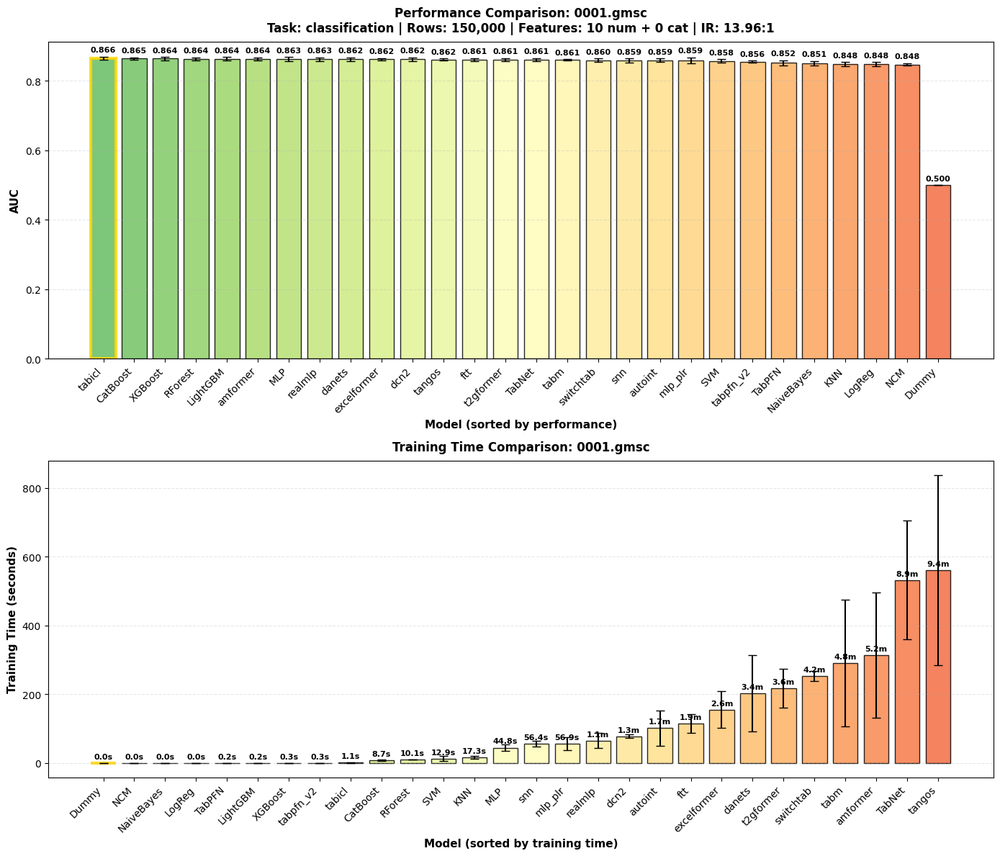



DATASET ANALYSIS: 0001.heloc

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         22
   # CV Folds:       5
   # Rows:           57,931
   # Num Features:   8
   # Cat Features:   0
   # Total Features: 8

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     modernNCA                  0.7954     ± 0.0072       205.05     ± 2.59
2     xgboost                    0.6387     ± 0.0137         0.72     ± 0.17
3     lightgbm                   0.5896     ± 0.0060         0.21     ± 0.00
4     tabm                       0.5374     ± 0.0470       224.36    ± 46.74
5     knn                        0.5351     ± 0.0115         0.69     ± 0.01
6     excelformer         

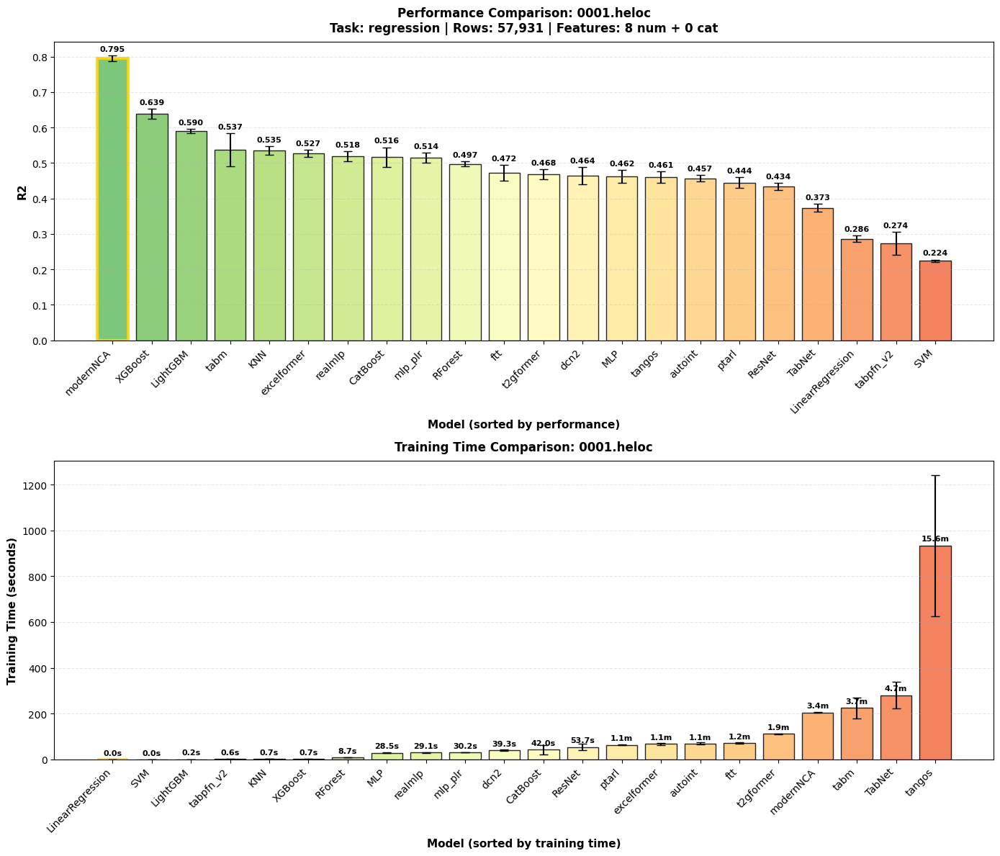



DATASET ANALYSIS: 0002.loss2

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         22
   # CV Folds:       5
   # Rows:           4,637
   # Num Features:   29
   # Cat Features:   23
   # Total Features: 52

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabpfn_v2                  0.7150     ± 0.0187         1.26     ± 0.59
2     excelformer                0.6632     ± 0.0250        16.67     ± 2.01
3     catboost                   0.6558     ± 0.0234       120.11    ± 88.23
4     modernNCA                  0.6502     ± 0.0188         4.85     ± 0.63
5     tabm                       0.6499     ± 0.0247        24.58     ± 7.81
6     t2gformer         

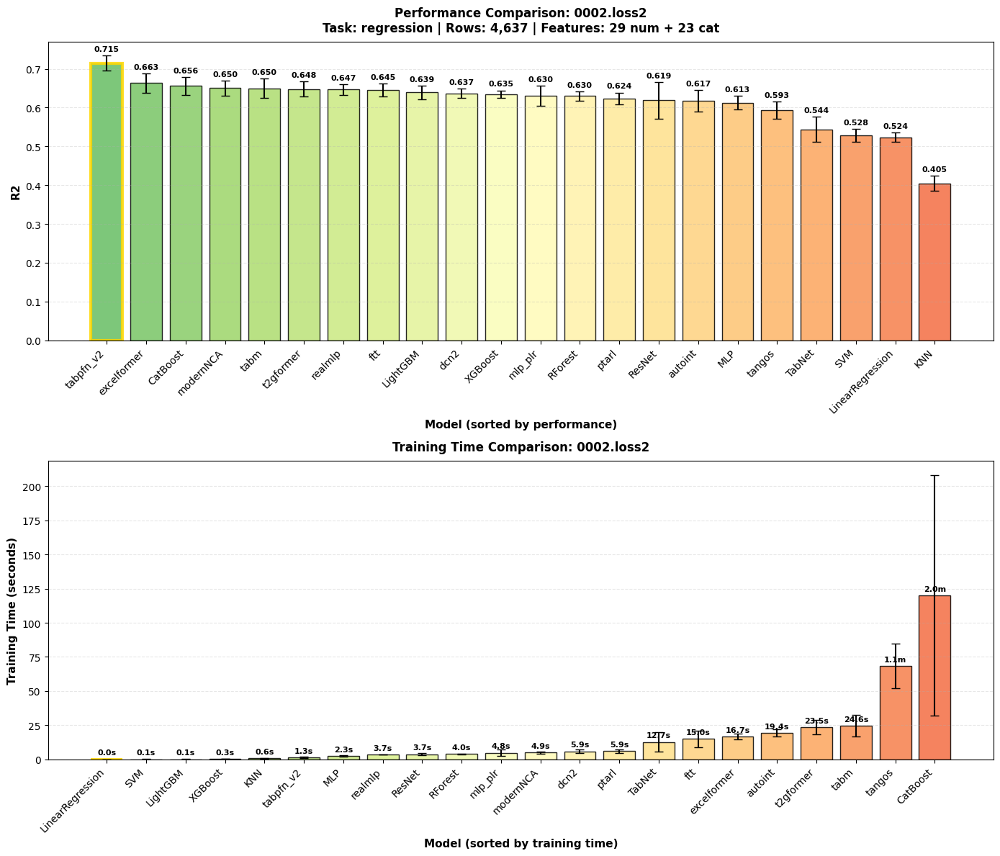



DATASET ANALYSIS: 0002.taiwan_creditcard

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           30,000
   # Num Features:   23
   # Cat Features:   0
   # Total Features: 23
   Imbalance Ratio:  3.52:1 (majority:minority)
   Positive Rate:    22.12%
   Class Dist:       {0: 23364, 1: 6636}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.7871     ± 0.0063         0.74     ± 0.12
2     excelformer                0.7831     ± 0.0069        52.89     ± 9.22
3     ftt                        0.7818     ± 0.0077        35.48    ± 10.76
4     xgboost                    0.7814    

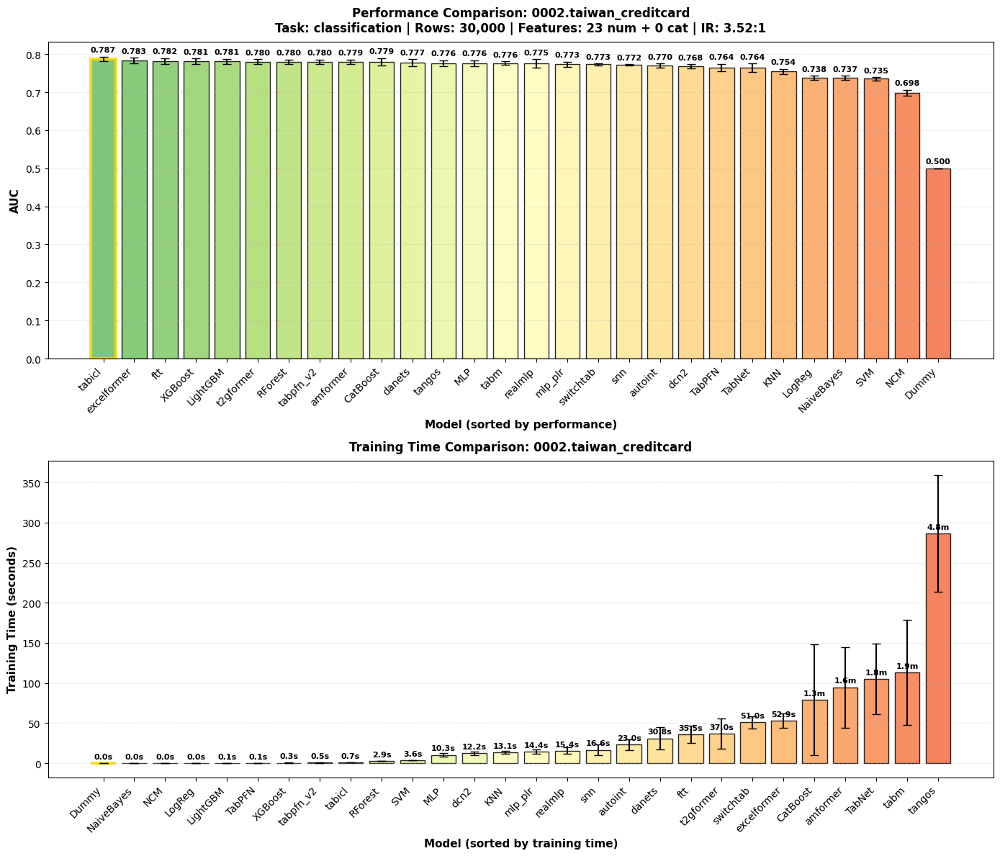



DATASET ANALYSIS: 0003.axa

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         22
   # CV Folds:       5
   # Rows:           2,545
   # Num Features:   2
   # Cat Features:   0
   # Total Features: 2

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     ptarl                      0.2084     ± 0.0434         2.24     ± 0.63
2     tabpfn_v2                  0.2060     ± 0.0581         0.30     ± 0.28
3     catboost                   0.2025     ± 0.0358         6.60     ± 3.22
4     tabnet                     0.2012     ± 0.0370         9.81     ± 2.11
5     ftt                        0.2002     ± 0.0355         1.60     ± 0.36
6     realmlp                

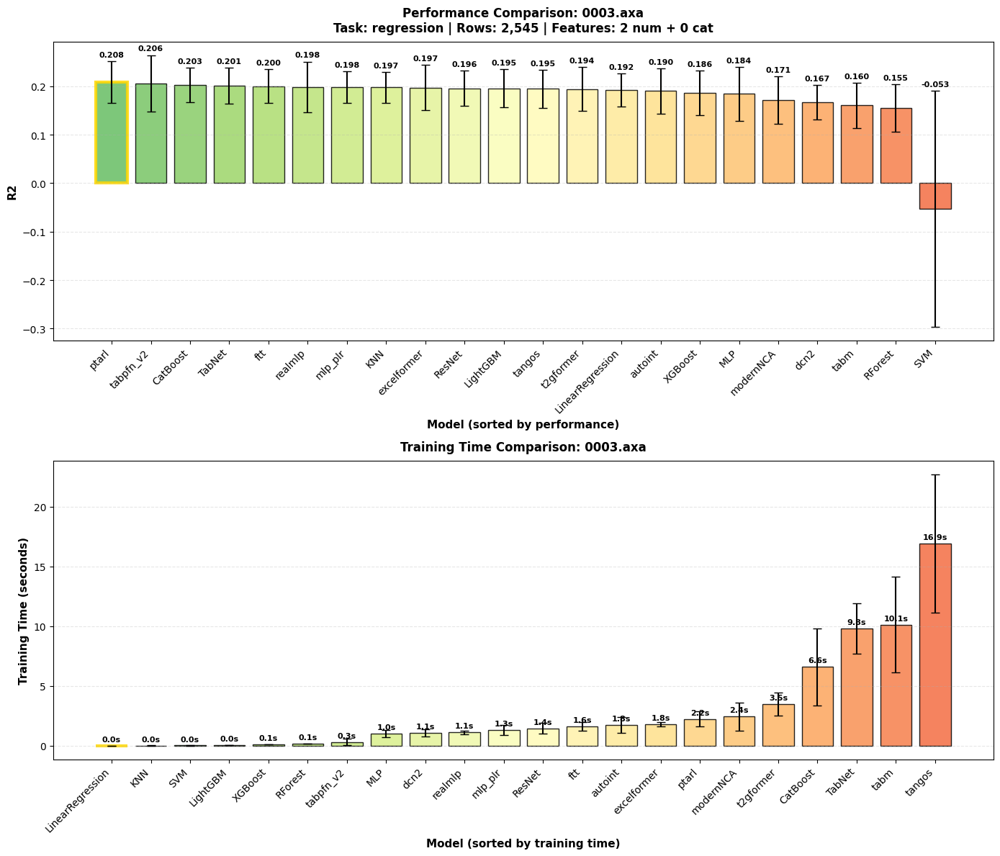



DATASET ANALYSIS: 0003.vehicle_loan

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           233,154
   # Num Features:   32
   # Cat Features:   3
   # Total Features: 35
   Imbalance Ratio:  3.61:1 (majority:minority)
   Positive Rate:    21.71%
   Class Dist:       {0: 182543, 1: 50611}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     catboost                   0.6538     ± 0.0034        27.66    ± 14.46
2     tabicl                     0.6527     ± 0.0034         4.00     ± 0.13
3     amformer                   0.6520     ± 0.0036       846.37   ± 274.14
4     ftt                        0.6517     ±

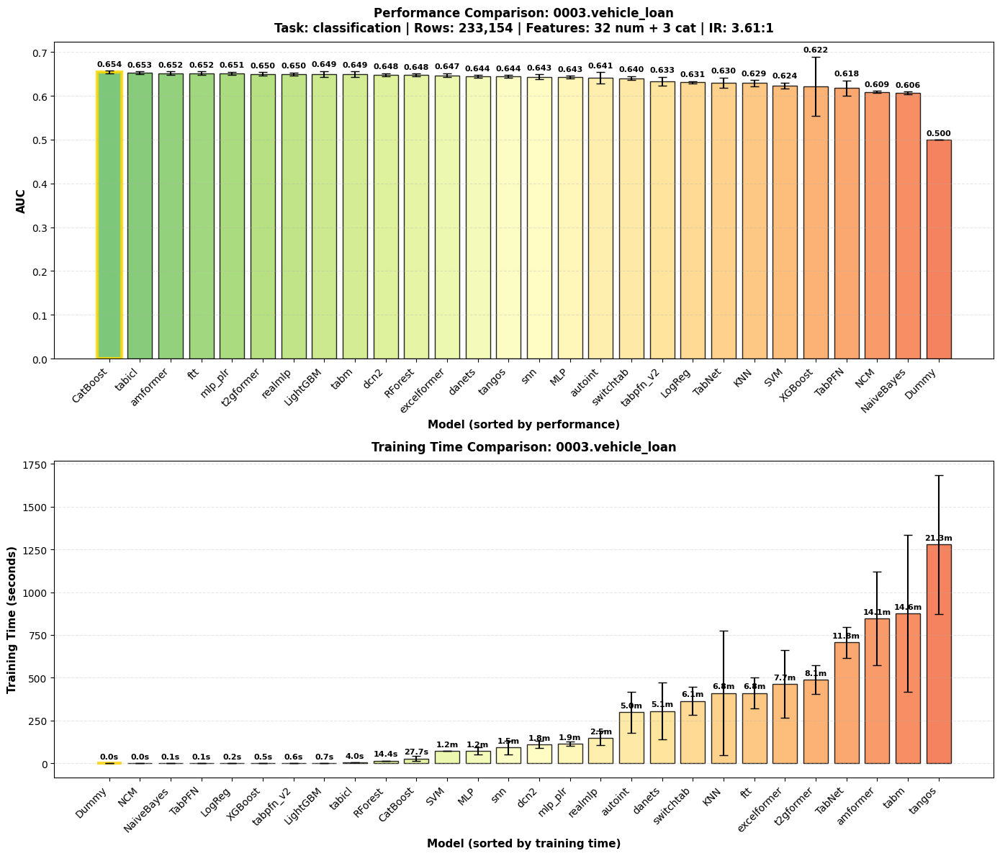



DATASET ANALYSIS: 0004.base_model

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         20
   # CV Folds:       5
   # Rows:           762
   # Num Features:   114
   # Cat Features:   88
   # Total Features: 202

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     catboost                   0.1655     ± 0.0758        73.75    ± 93.54
2     ptarl                      0.1612     ± 0.0675         0.96     ± 0.06
3     resnet                     0.1446     ± 0.0872         1.46     ± 0.94
4     dcn2                       0.1374     ± 0.1052         1.04     ± 0.71
5     mlp                        0.1356     ± 0.0989         0.72     ± 0.18
6     xgboost      

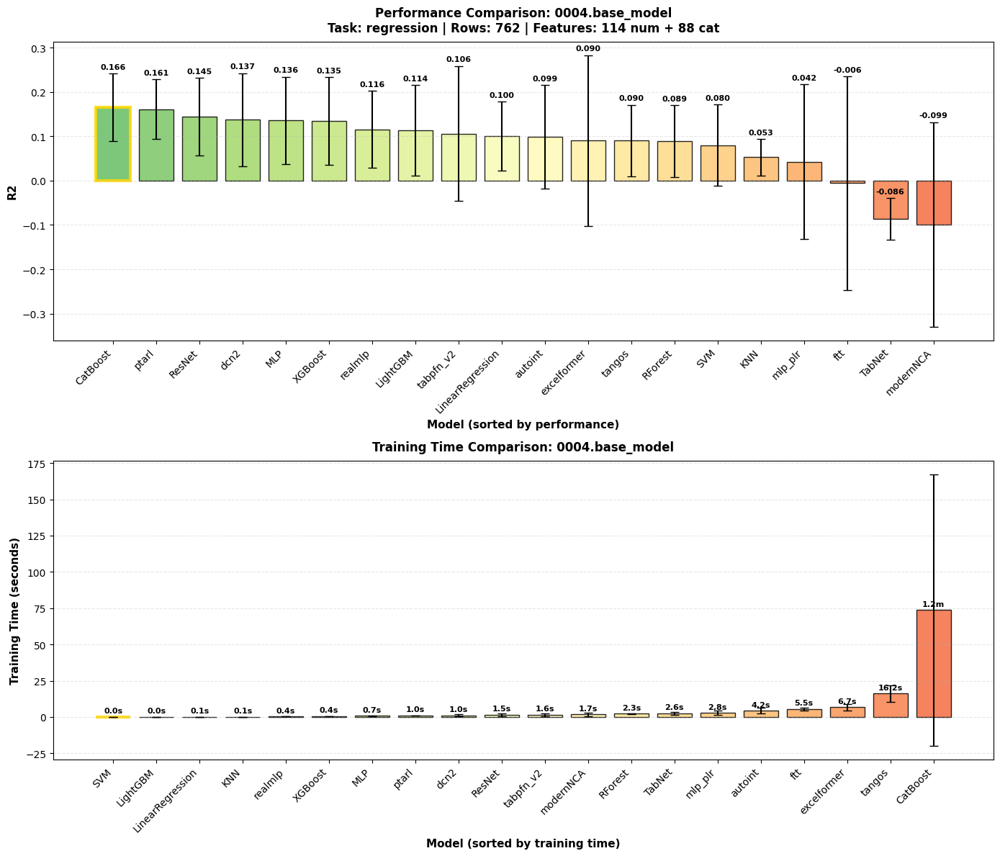



DATASET ANALYSIS: 0004.lendingclub

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           9,578
   # Num Features:   12
   # Cat Features:   1
   # Total Features: 13
   Imbalance Ratio:  5.25:1 (majority:minority)
   Positive Rate:    16.01%
   Class Dist:       {0: 8045, 1: 1533}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.6802     ± 0.0084         0.50     ± 0.10
2     tabpfn_v2                  0.6779     ± 0.0234         0.28     ± 0.20
3     t2gformer                  0.6775     ± 0.0098        12.98     ± 6.28
4     tabpfn                     0.6762     ± 0.023

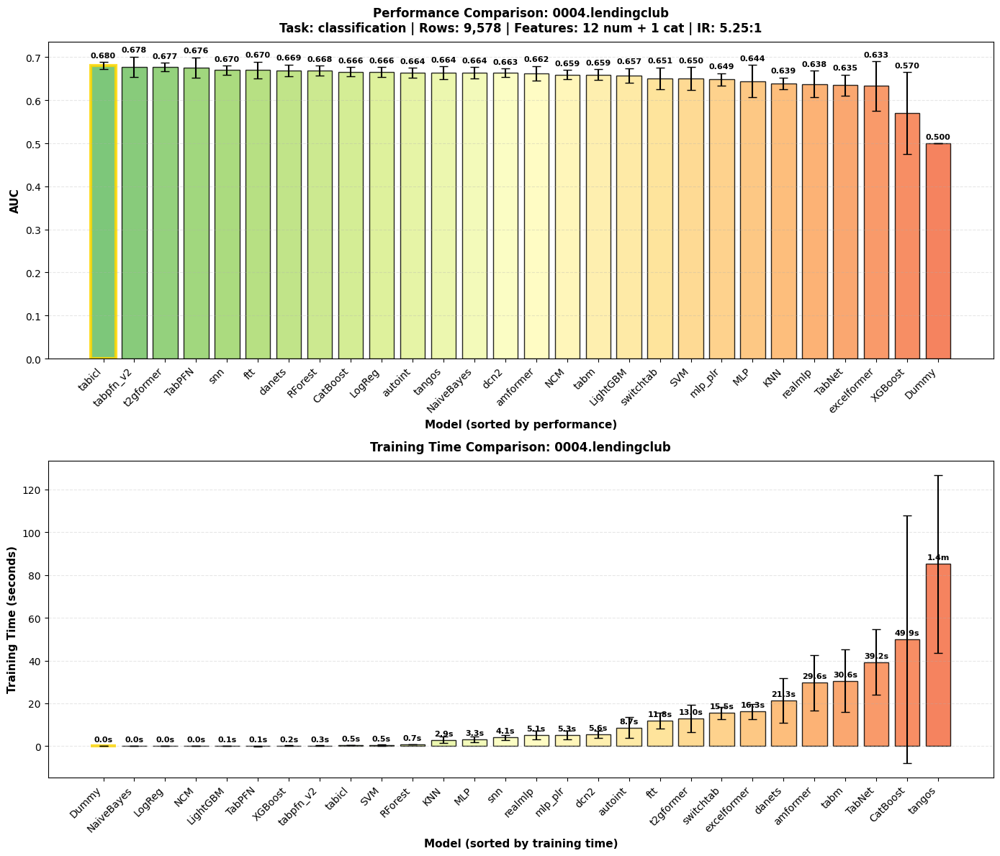



DATASET ANALYSIS: 0005.base_modelisation

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         7
   # CV Folds:       5
   # Rows:           594
   # Num Features:   179
   # Cat Features:   77
   # Total Features: 256

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     RandomForest               0.3930     ± 0.1151         1.11     ± 0.22
2     svm                        0.3703     ± 0.0845         0.00     ± 0.00
3     excelformer                0.3553     ± 0.0941         2.67     ± 0.61
4     tabm                       0.3544     ± 0.1446         3.17     ± 1.00
5     LinearRegression           0.3436     ± 0.0984         0.03     ± 0.04
6     t2gform

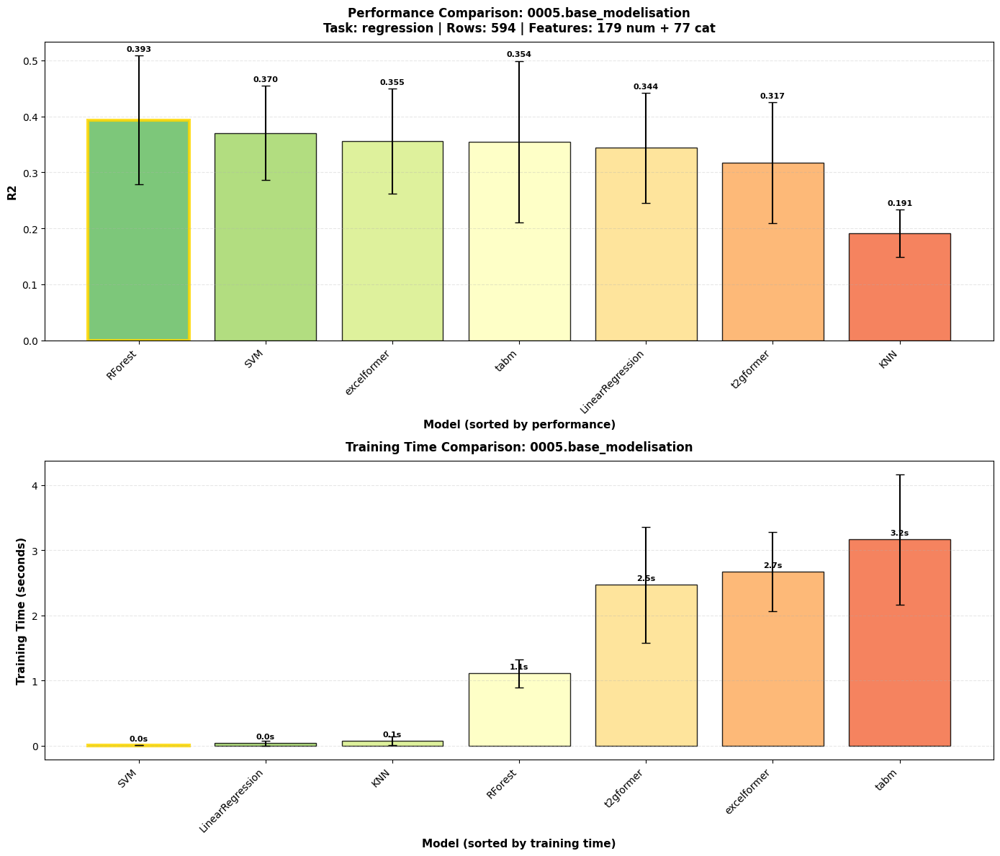



DATASET ANALYSIS: 0005.case_study

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           150,000
   # Num Features:   10
   # Cat Features:   1
   # Total Features: 11
   Imbalance Ratio:  13.96:1 (majority:minority)
   Positive Rate:    6.68%
   Class Dist:       {0: 139974, 1: 10026}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.8658     ± 0.0040         1.26     ± 0.20
2     catboost                   0.8646     ± 0.0043        24.76    ± 10.91
3     RandomForest               0.8640     ± 0.0040         8.32     ± 0.14
4     lightgbm                   0.8640     ± 0

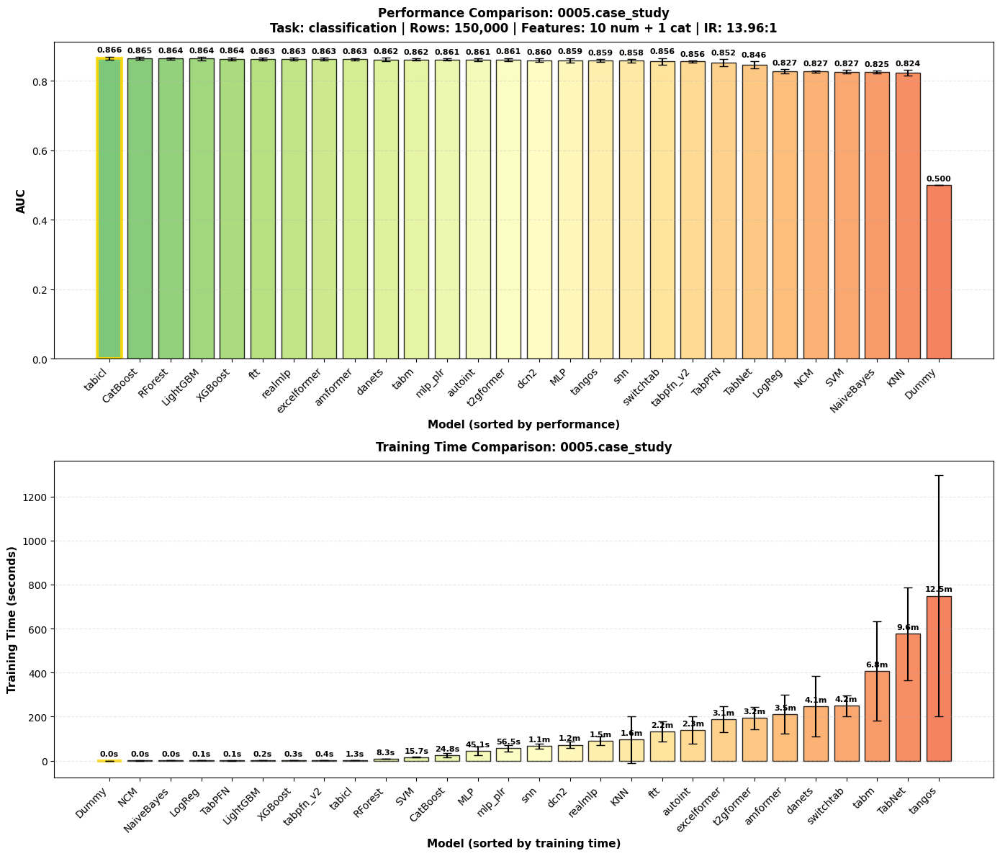



DATASET ANALYSIS: 0006.lgd_freddie

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         22
   # CV Folds:       5
   # Rows:           16,002
   # Num Features:   12
   # Cat Features:   8
   # Total Features: 20

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     realmlp                    0.3795     ± 0.0165         8.25     ± 1.04
2     tabpfn_v2                  0.3731     ± 0.0114         1.32     ± 1.17
3     tabm                       0.3726     ± 0.0186        25.22     ± 6.17
4     dcn2                       0.3698     ± 0.0190         7.44     ± 1.11
5     ptarl                      0.3691     ± 0.0107        12.86     ± 3.80
6     t2gformer   

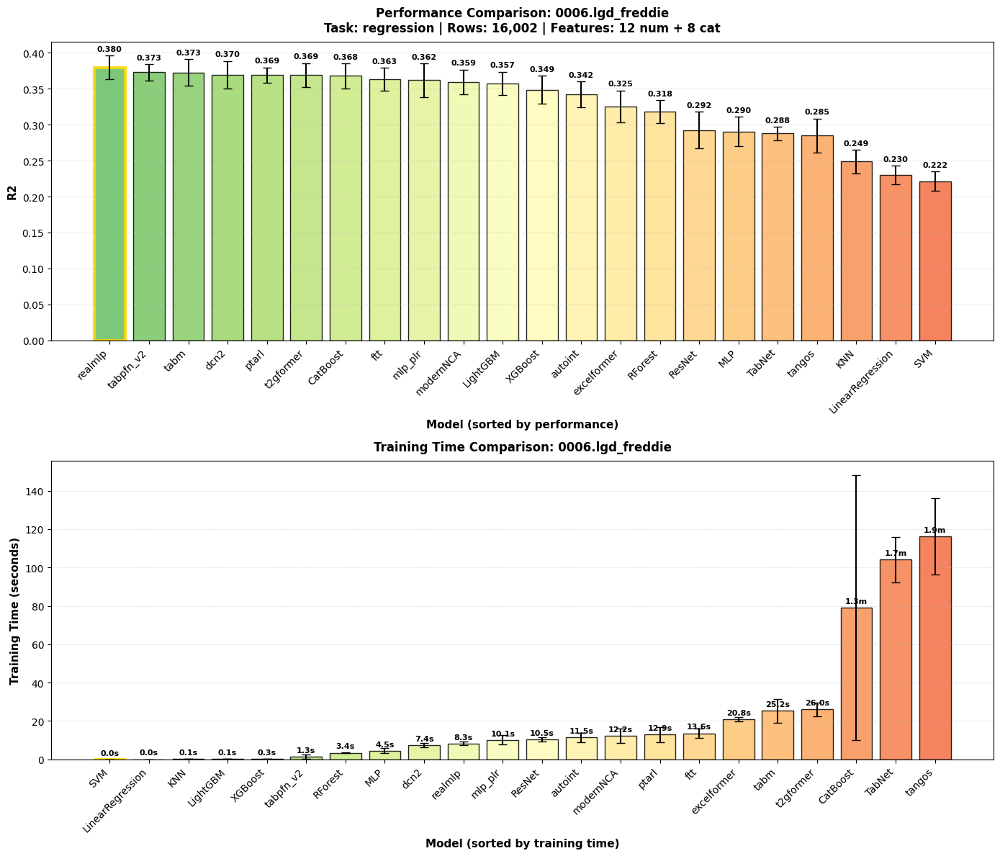



DATASET ANALYSIS: 0006.myhom

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           7,000
   # Num Features:   7
   # Cat Features:   1
   # Total Features: 8
   Imbalance Ratio:  1.50:1 (majority:minority)
   Positive Rate:    40.00%
   Class Dist:       {0: 4200, 1: 2800}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabpfn                     0.5962     ± 0.0161         0.11     ± 0.22
2     svm                        0.5960     ± 0.0068         0.19     ± 0.16
3     LogReg                     0.5956     ± 0.0048         0.00     ± 0.00
4     tabpfn_v2                  0.5951     ± 0.0164       

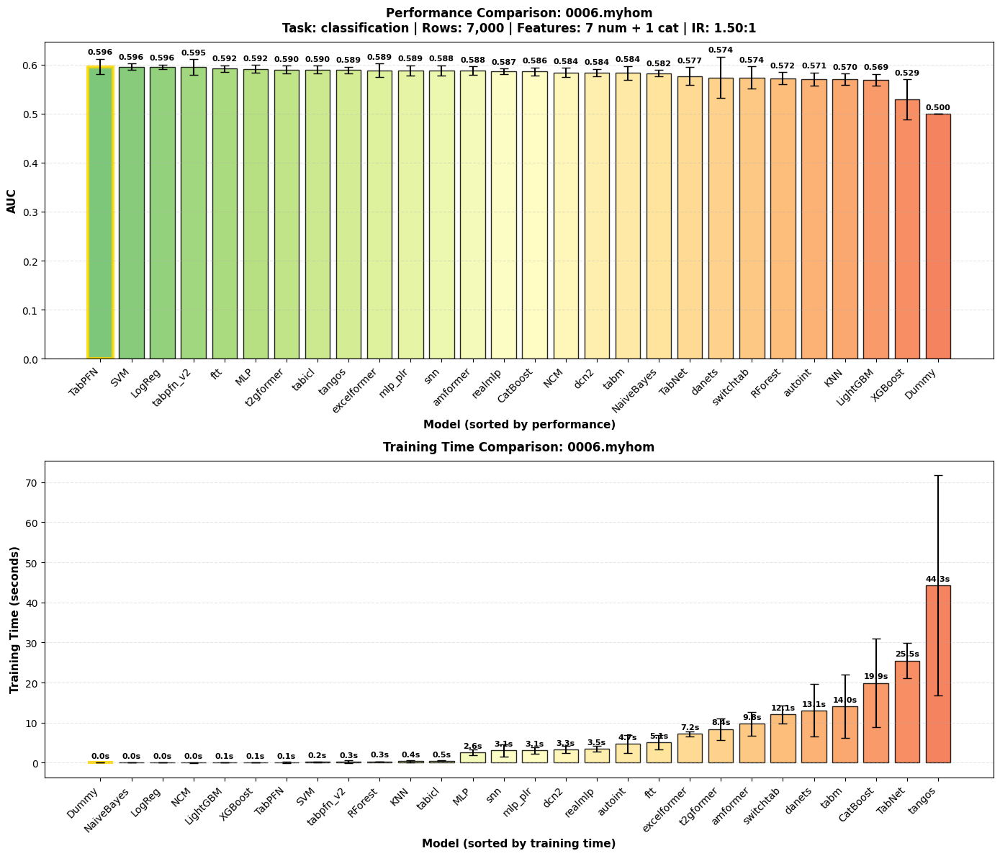



DATASET ANALYSIS: 0007.hackerearth

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         26
   # CV Folds:       5
   # Rows:           532,428
   # Num Features:   27
   # Cat Features:   8
   # Total Features: 35
   Imbalance Ratio:  3.23:1 (majority:minority)
   Positive Rate:    23.63%
   Class Dist:       {0: 406601, 1: 125827}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabm                       0.9440     ± 0.0015      1718.86   ± 779.30
2     t2gformer                  0.9396     ± 0.0021       905.50     ± 4.14
3     catboost                   0.9395     ± 0.0025        39.03    ± 20.75
4     realmlp                    0.9392     ±

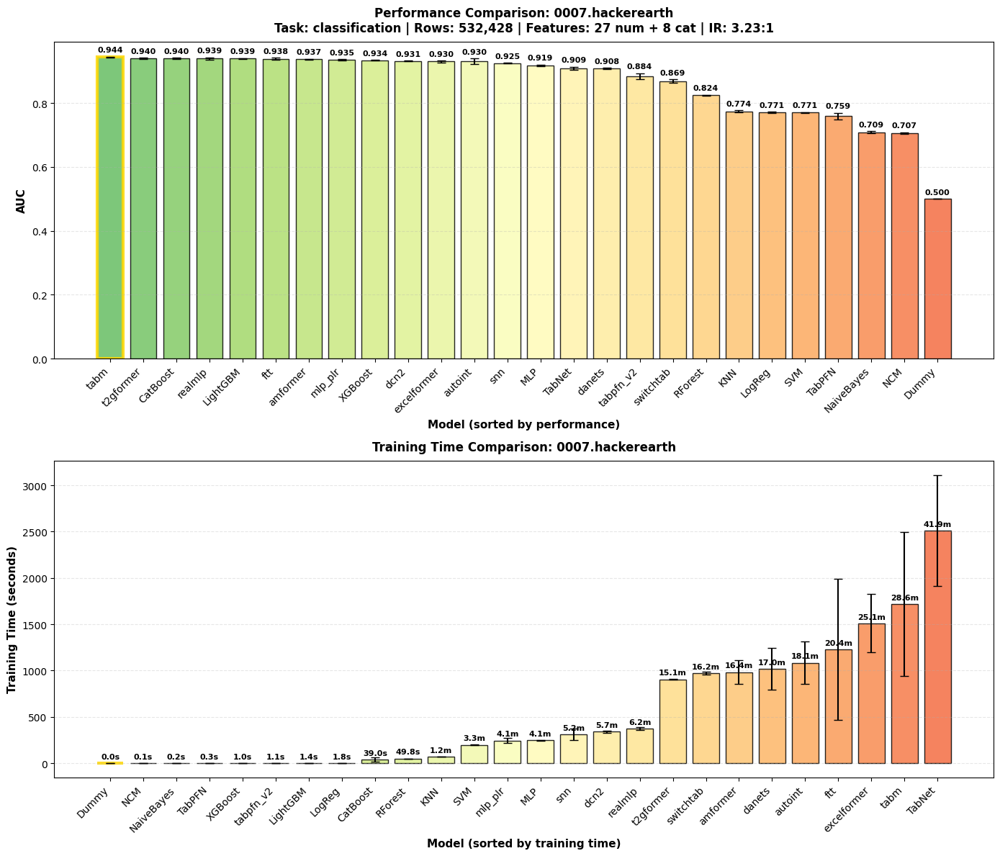



DATASET ANALYSIS: 0007.lgd_lendingclub

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        regression
   Primary Metric:   R2
   Tuning Strategy:  optuna
   # Models:         22
   # CV Folds:       5
   # Rows:           5,627
   # Num Features:   10
   # Cat Features:   7
   # Total Features: 17

📊 PERFORMANCE SUMMARY (R2):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     catboost                   0.7450     ± 0.0391        18.93     ± 8.57
2     tabpfn_v2                  0.7440     ± 0.0379         1.13     ± 0.86
3     RandomForest               0.7426     ± 0.0393         1.23     ± 0.05
4     lightgbm                   0.7421     ± 0.0384         0.03     ± 0.01
5     xgboost                    0.7385     ± 0.0386         0.14     ± 0.01
6     excelform

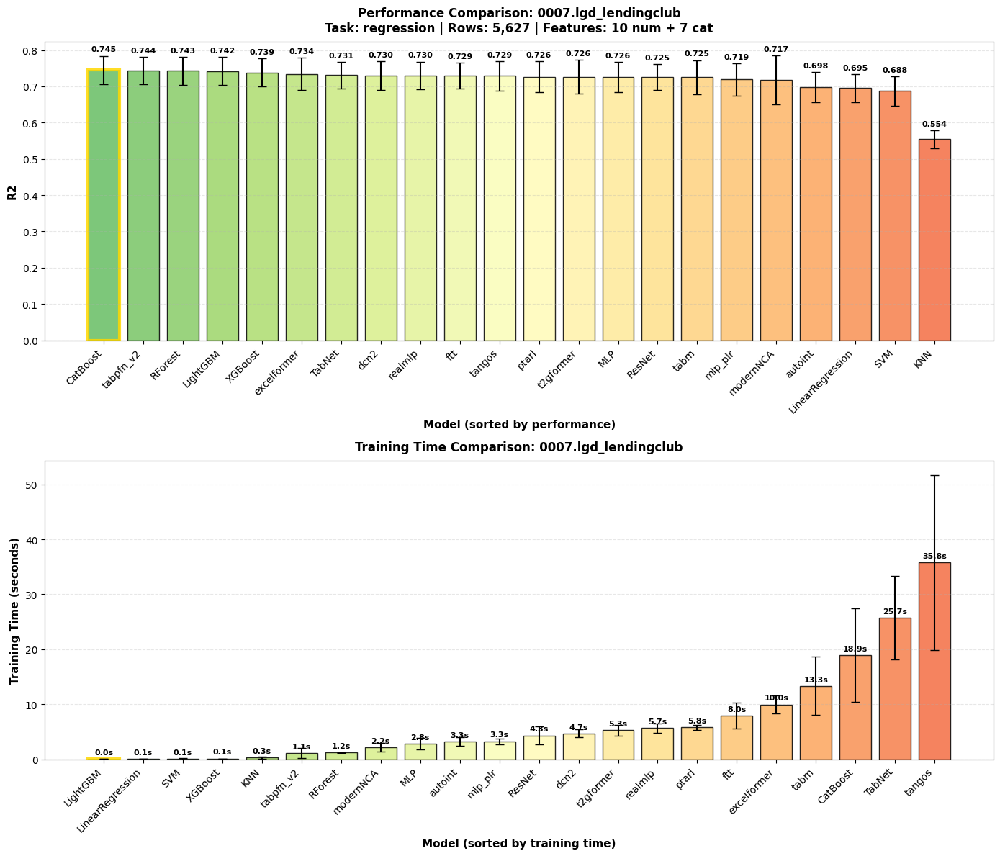



DATASET ANALYSIS: 0008.cobranded

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           80,000
   # Num Features:   47
   # Cat Features:   0
   # Total Features: 47
   Imbalance Ratio:  3.06:1 (majority:minority)
   Positive Rate:    24.62%
   Class Dist:       {0: 60303, 1: 19697}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.8406     ± 0.0019         1.99     ± 0.07
2     catboost                   0.8402     ± 0.0011         4.03     ± 0.45
3     amformer                   0.8388     ± 0.0021       567.19    ± 66.96
4     t2gformer                  0.8385     ± 0.00

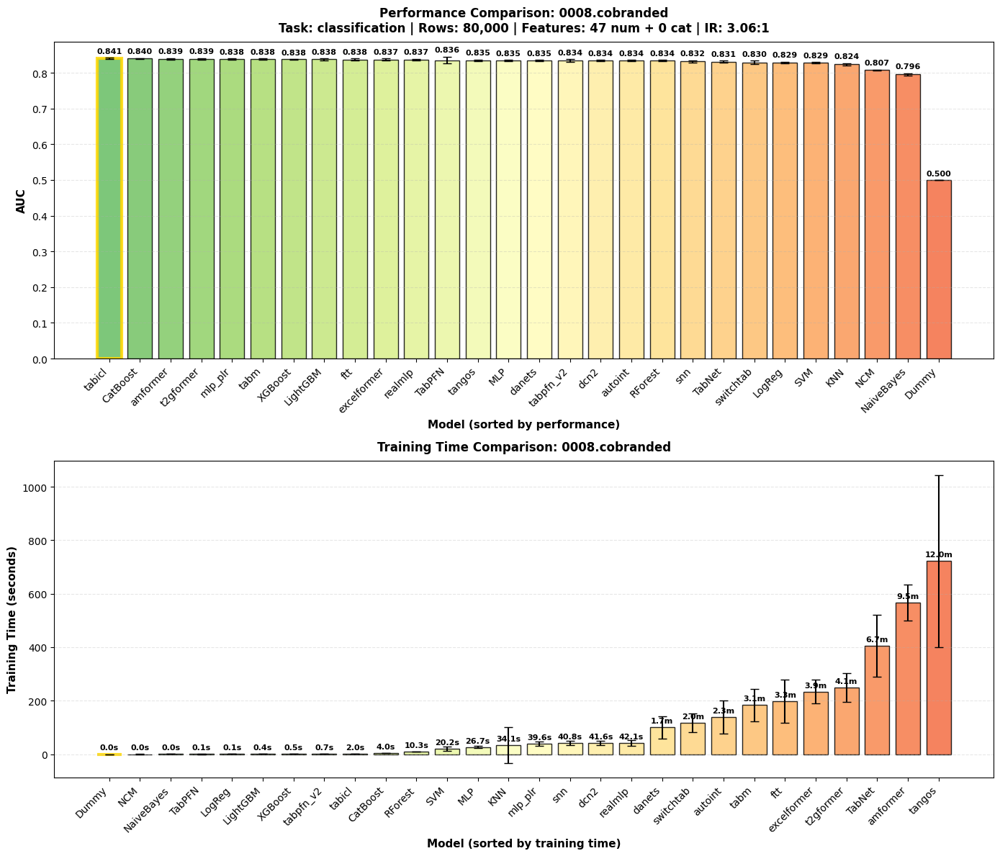



DATASET ANALYSIS: 0009.german

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           999
   # Num Features:   7
   # Cat Features:   13
   # Total Features: 20
   Imbalance Ratio:  2.33:1 (majority:minority)
   Positive Rate:    30.03%
   Class Dist:       {0: 699, 1: 300}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabpfn                     0.7943     ± 0.0352         0.10     ± 0.20
2     tabicl                     0.7902     ± 0.0380         0.61     ± 0.29
3     RandomForest               0.7864     ± 0.0411         0.12     ± 0.01
4     tabpfn_v2                  0.7860     ± 0.0252        

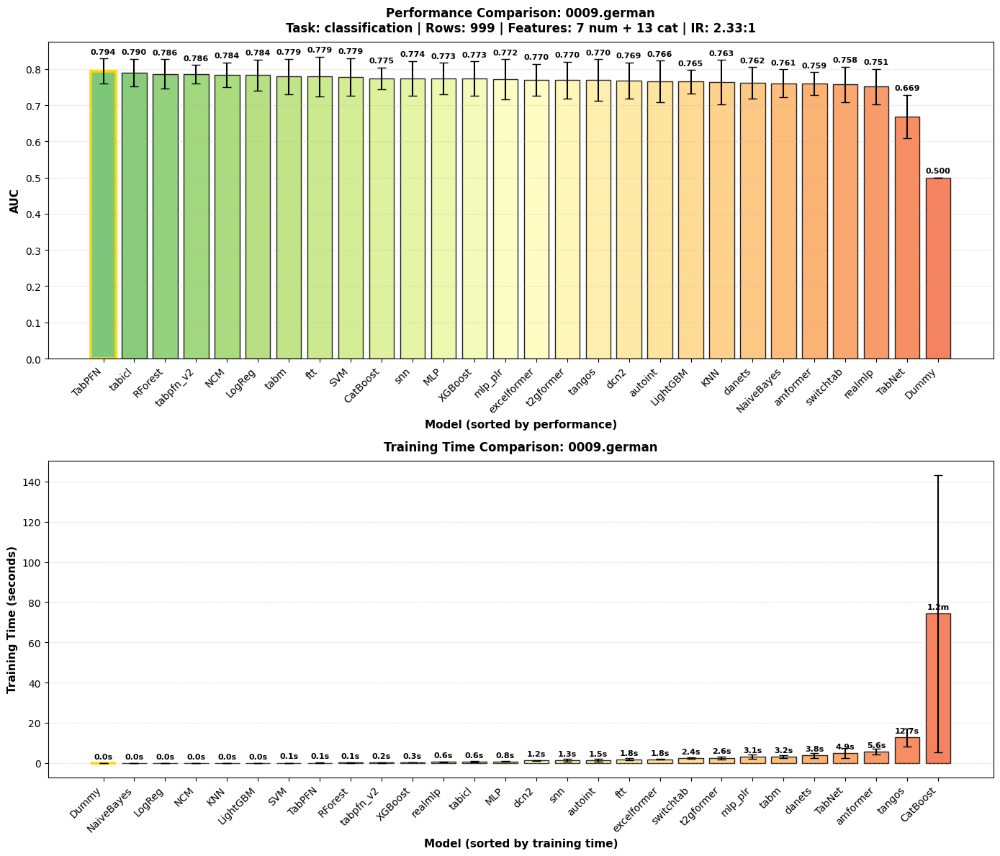



DATASET ANALYSIS: 0010.bank_status

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           100,000
   # Num Features:   16
   # Cat Features:   0
   # Total Features: 16
   Imbalance Ratio:  3.42:1 (majority:minority)
   Positive Rate:    22.64%
   Class Dist:       {0: 77361, 1: 22639}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.7801     ± 0.0029         1.15     ± 0.29
2     knn                        0.7790     ± 0.0034        63.10    ± 34.96
3     catboost                   0.7680     ± 0.0031         8.96     ± 4.12
4     lightgbm                   0.7643     ± 0

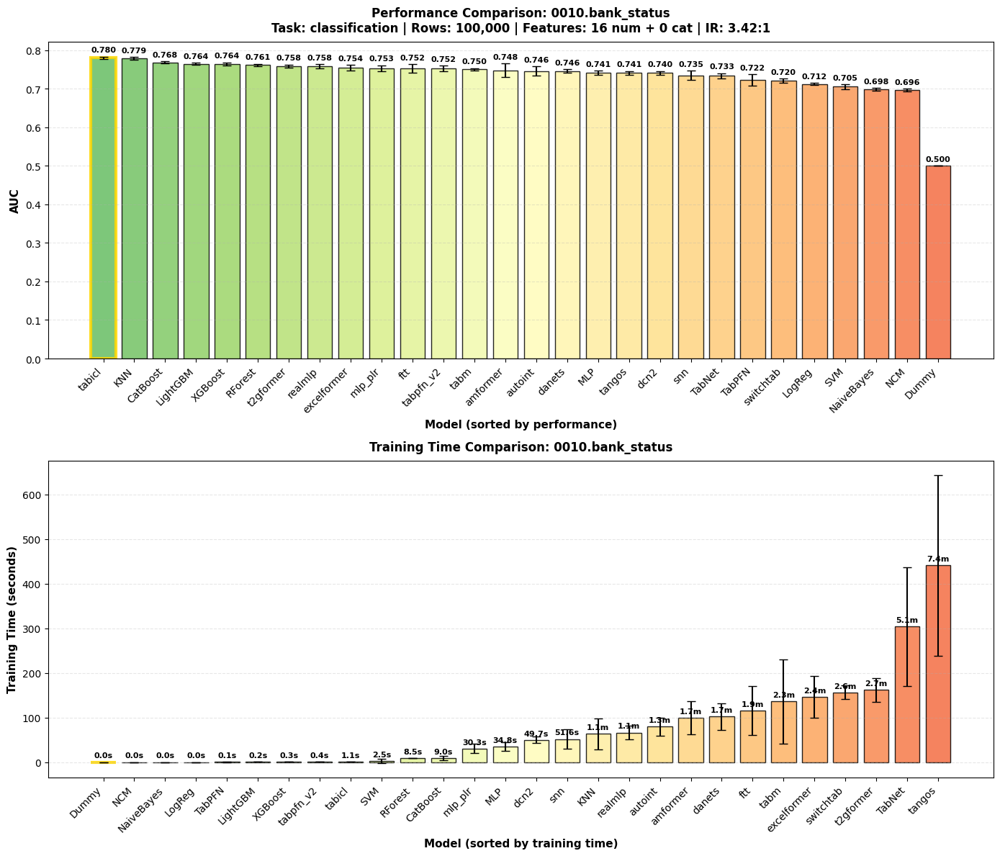



DATASET ANALYSIS: 0011.thomas

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           1,225
   # Num Features:   12
   # Cat Features:   2
   # Total Features: 14
   Imbalance Ratio:  2.79:1 (majority:minority)
   Positive Rate:    26.37%
   Class Dist:       {0: 902, 1: 323}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     knn                        0.6579     ± 0.0300         0.05     ± 0.04
2     mlp                        0.6530     ± 0.0288         0.95     ± 0.34
3     tangos                     0.6509     ± 0.0331        14.50     ± 3.78
4     tabpfn                     0.6481     ± 0.0413      

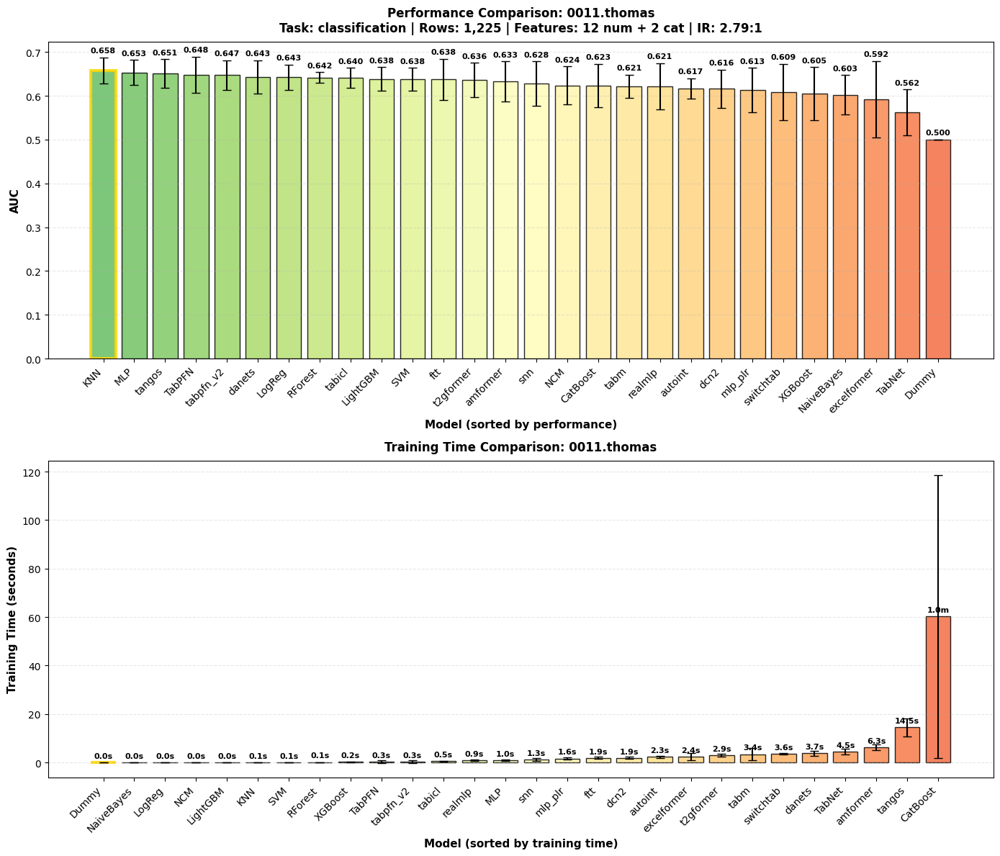



DATASET ANALYSIS: 0012.loan_default

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           105,471
   # Num Features:   759
   # Cat Features:   0
   # Total Features: 759
   Imbalance Ratio:  9.78:1 (majority:minority)
   Positive Rate:    9.28%
   Class Dist:       {0: 95688, 1: 9783}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.6470     ± 0.0082         4.56     ± 0.11
2     LogReg                     0.6393     ± 0.0065         0.07     ± 0.01
3     NCM                        0.6360     ± 0.0070         0.04     ± 0.01
4     catboost                   0.6354     ± 

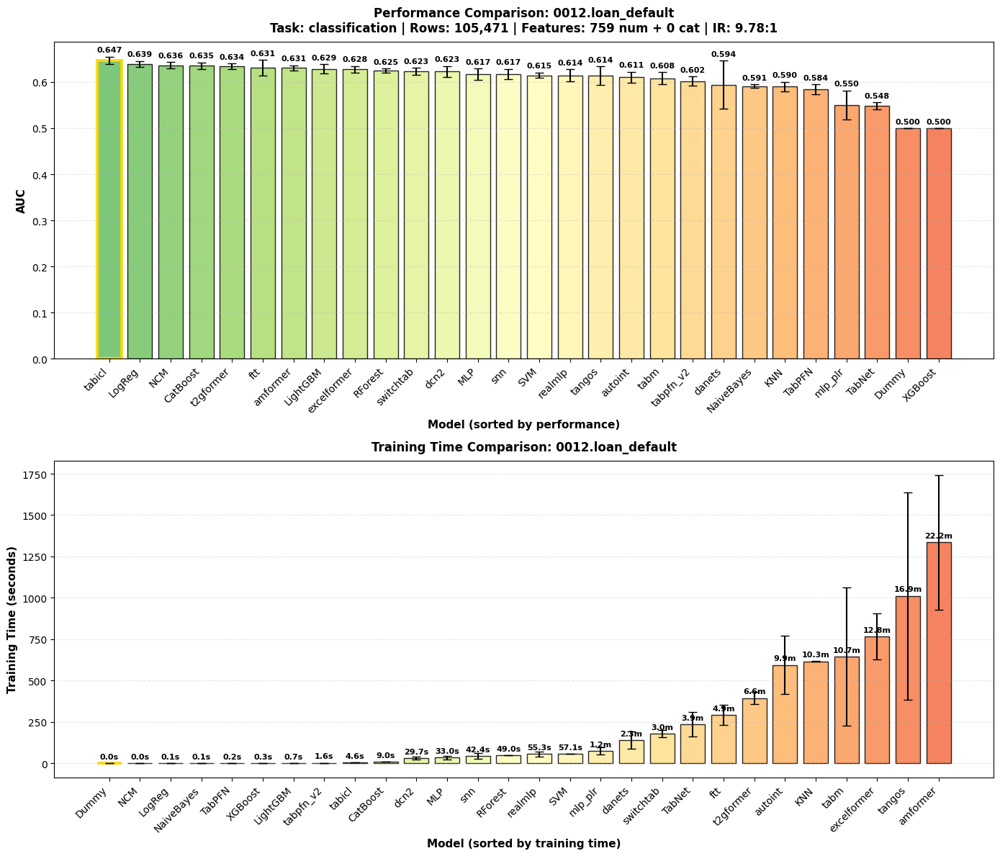



DATASET ANALYSIS: 0013.home_credit

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         25
   # CV Folds:       5
   # Rows:           307,511
   # Num Features:   104
   # Cat Features:   16
   # Total Features: 120
   Imbalance Ratio:  11.39:1 (majority:minority)
   Positive Rate:    8.07%
   Class Dist:       {0: 282686, 1: 24825}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     catboost                   0.7556     ± 0.0091        48.09    ± 35.37
2     t2gformer                  0.7523     ± 0.0059      2396.22    ± 98.42
3     lightgbm                   0.7517     ± 0.0083         1.44     ± 0.23
4     ftt                        0.7512    

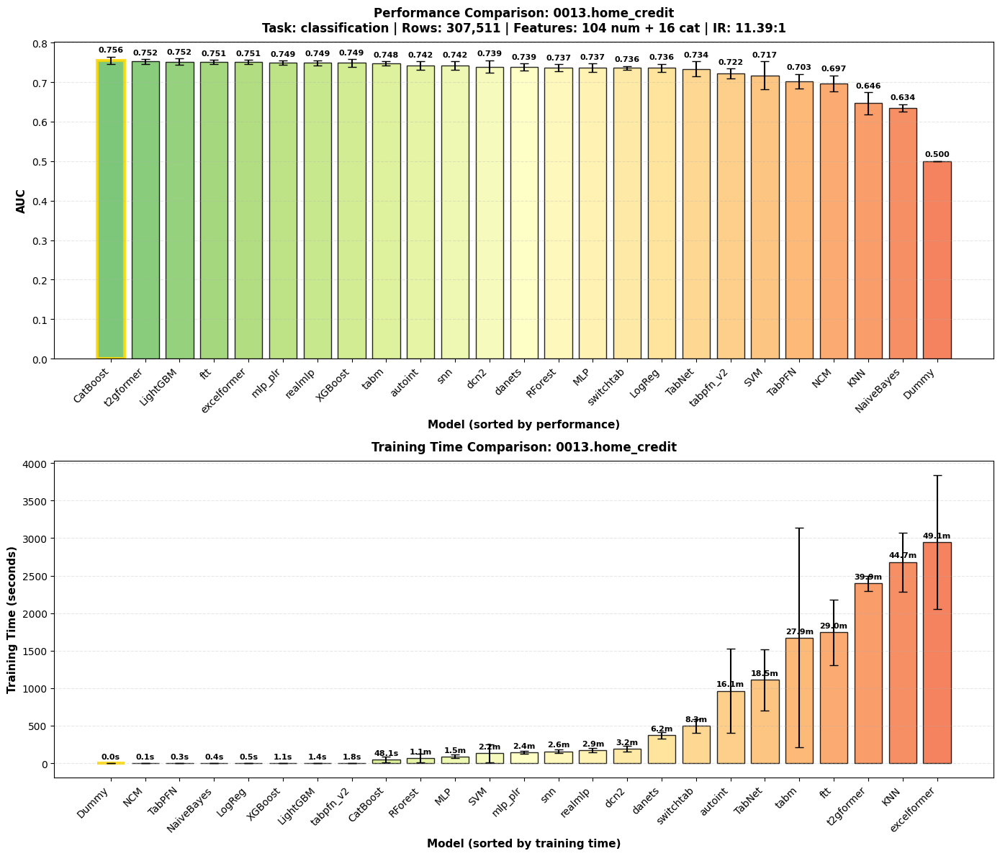



DATASET ANALYSIS: 0014.hmeq

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           5,960
   # Num Features:   10
   # Cat Features:   2
   # Total Features: 12
   Imbalance Ratio:  4.01:1 (majority:minority)
   Positive Rate:    19.95%
   Class Dist:       {0: 4771, 1: 1189}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabicl                     0.9842     ± 0.0036         0.63     ± 0.34
2     tabpfn_v2                  0.9827     ± 0.0042         0.33     ± 0.36
3     xgboost                    0.9642     ± 0.0124         0.34     ± 0.06
4     lightgbm                   0.9585     ± 0.0119      

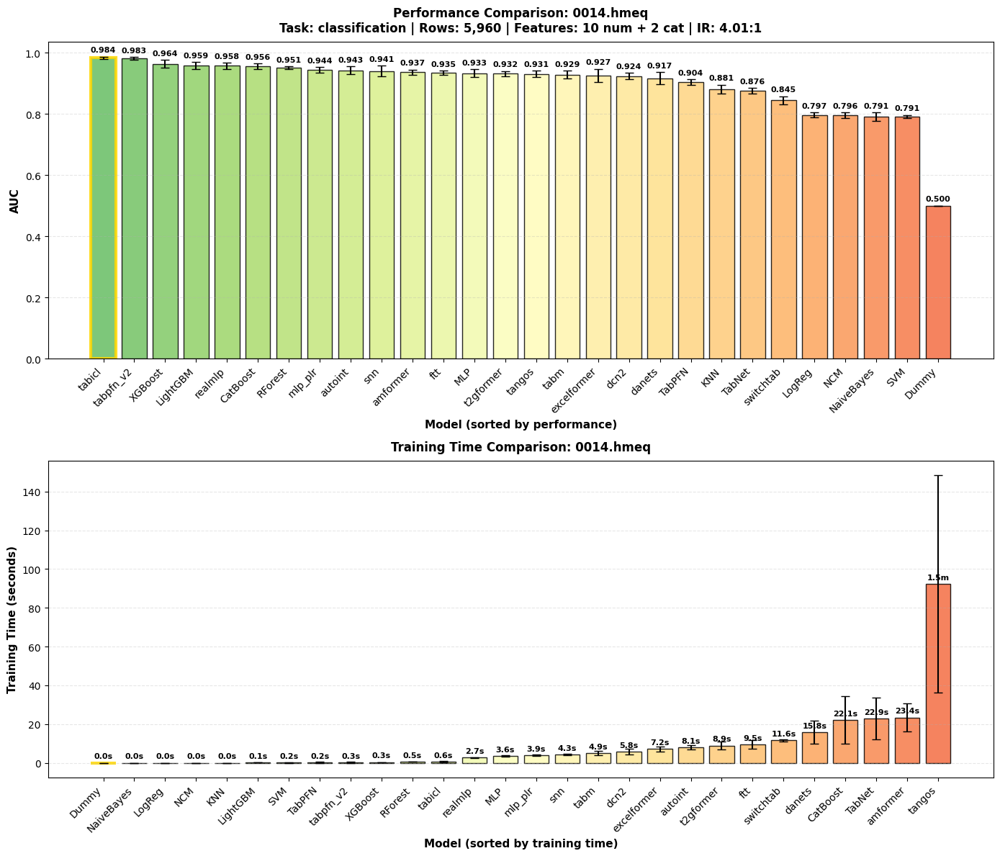



DATASET ANALYSIS: 0015.algorithmwatch

📋 DATASET METADATA:
--------------------------------------------------
   Task Type:        classification
   Primary Metric:   AUC
   Tuning Strategy:  optuna
   # Models:         28
   # CV Folds:       5
   # Rows:           158,700
   # Num Features:   2986
   # Cat Features:   0
   # Total Features: 2986
   Imbalance Ratio:  1.64:1 (majority:minority)
   Positive Rate:    37.81%
   Class Dist:       {0: 98697, 1: 60003}

📊 PERFORMANCE SUMMARY (AUC):
---------------------------------------------------------------------------
Rank  Model                        Mean        ± Std     Time (s)      ± Std
---------------------------------------------------------------------------
1     tabm                       0.6577     ± 0.0035       954.74    ± 20.06
2     ftt                        0.6564     ± 0.0030       782.99   ± 179.34
3     t2gformer                  0.6557     ± 0.0022       827.54   ± 201.71
4     mlp_plr                    0.6548 

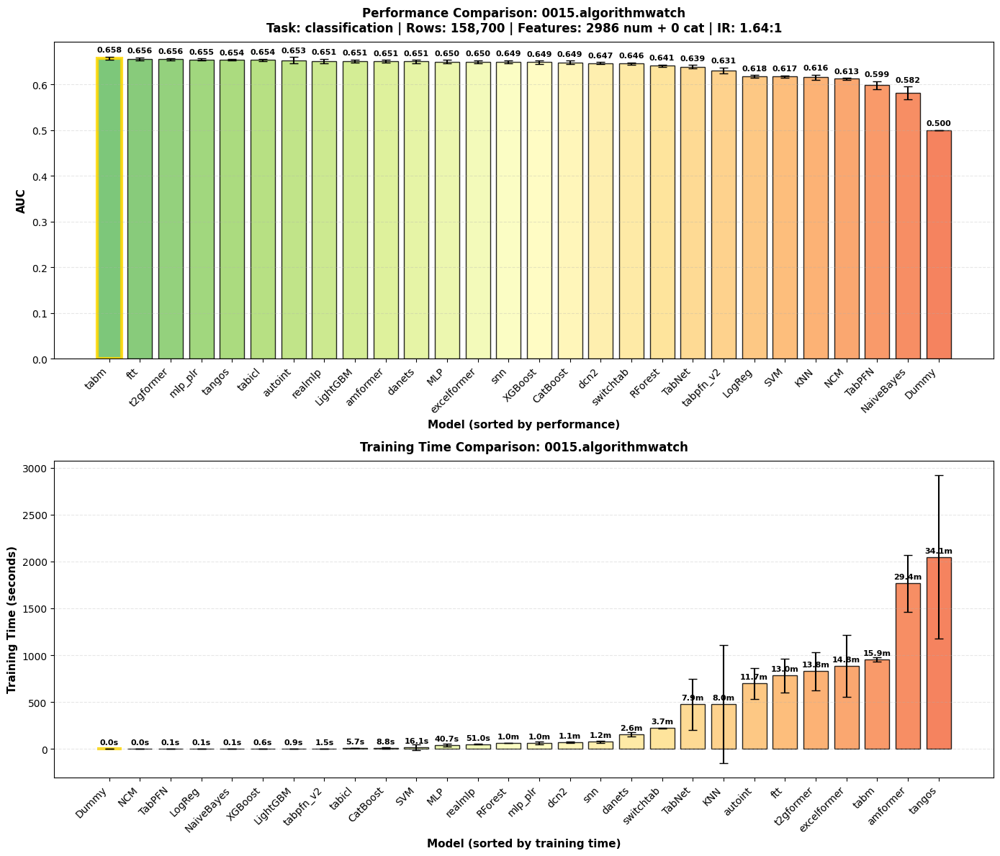

In [8]:
# =============================================================================
# ANALYZE ALL DATASETS - Generate plots for each dataset
# =============================================================================

if not UNIFIED_DF.empty:
    # Get all unique datasets
    all_datasets = sorted(UNIFIED_DF['dataset'].unique())
    
    print(f"📊 Analyzing {len(all_datasets)} datasets...\n")
    
    # Store all results
    all_analyses = {}
    
    for dataset_name in all_datasets:
        all_analyses[dataset_name] = analyze_dataset(
            df=UNIFIED_DF,
            dataset_name=dataset_name,
            tuning_strategy='optuna',
            figsize=(14, 12)
        )
        print("\n")  # Add spacing between datasets
    
else:
    print("❌ No data loaded")

## 5. PAMA Analysis (Probability of Achieving Maximal Accuracy)

In [9]:
# =============================================================================
# PAMA ANALYSIS
# =============================================================================

def compute_pama_analysis(df, task_filter=None, tuning_strategy='optuna',
                         pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                         aggregation_level='dataset', top_n=None,
                         plot=True, verbose=True):
    """
    Compute PAMA (Probability of Achieving Maximal Accuracy) analysis.
    
    PAMA measures how often each algorithm achieves the best performance
    across datasets or CV splits.
    
    Parameters:
    - df: Input DataFrame (UNIFIED_DF)
    - task_filter: 'pd', 'lgd', or None for both
    - tuning_strategy: 'default', 'optuna', or None for all
    - aggregation_level: 'dataset' or 'split'
    - top_n: Show only top N algorithms
    - plot: Whether to create visualization
    - verbose: Whether to print detailed results
    
    Returns:
    - DataFrame with PAMA results per algorithm
    """
    if verbose:
        print("=" * 80)
        print("PAMA ANALYSIS - Probability of Achieving Maximal Accuracy")
        print("=" * 80)
    
    # Prepare data
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available for PAMA analysis")
        return pd.DataFrame()
    
    # Get algorithms and datasets
    algorithms = analysis_data['model'].unique()
    datasets = analysis_data['dataset'].unique()
    
    # Calculate wins
    algorithm_wins = {alg: 0.0 for alg in algorithms}
    total_comparisons = 0
    
    for dataset in datasets:
        dataset_data = analysis_data[analysis_data['dataset'] == dataset]
        
        if aggregation_level == 'dataset':
            # Average performance per algorithm on this dataset
            perf = dataset_data.groupby('model')['perf_metric'].mean()
            if len(perf) == 0:
                continue
            
            best_perf = perf.max()
            best_algorithms = perf[perf == best_perf].index.tolist()
            
            win_value = 1.0 / len(best_algorithms)
            for alg in best_algorithms:
                algorithm_wins[alg] += win_value
            total_comparisons += 1
        
        else:  # split level
            splits = dataset_data['split'].unique()
            for split in splits:
                split_data = dataset_data[dataset_data['split'] == split]
                perf = split_data.set_index('model')['perf_metric']
                
                if len(perf) == 0:
                    continue
                
                best_perf = perf.max()
                best_algorithms = perf[perf == best_perf].index.tolist()
                
                win_value = 1.0 / len(best_algorithms)
                for alg in best_algorithms:
                    algorithm_wins[alg] += win_value
                total_comparisons += 1
    
    # Create results DataFrame
    pama_results = []
    for algorithm in algorithms:
        wins = algorithm_wins[algorithm]
        pama_prob = wins / total_comparisons if total_comparisons > 0 else 0.0
        pama_results.append({
            'algorithm': algorithm,
            'wins': wins,
            'total_comparisons': total_comparisons,
            'pama_probability': pama_prob,
            'pama_percentage': pama_prob * 100
        })
    
    pama_df = pd.DataFrame(pama_results)
    pama_df = pama_df.sort_values('pama_probability', ascending=False).reset_index(drop=True)
    
    if verbose:
        comparison_unit = "datasets" if aggregation_level == 'dataset' else "CV splits"
        print(f"\n🏆 PAMA Results ({aggregation_level.upper()} Level):")
        print("-" * 70)
        display_df = pama_df.head(top_n) if top_n else pama_df
        for _, row in display_df.iterrows():
            print(f"{row['algorithm']:<20}: {row['pama_percentage']:6.1f}% "
                  f"({row['wins']:5.1f} wins out of {row['total_comparisons']} {comparison_unit})")
    
    # Plot
    if plot:
        plt.figure(figsize=(12, 8))
        plot_data = pama_df.head(top_n) if top_n else pama_df
        
        colors = ['lightcoral' if i == 0 else 'steelblue' if i < 3 else 'lightblue'
                  for i in range(len(plot_data))]
        
        bars = plt.bar(range(len(plot_data)), plot_data['pama_percentage'],
                       color=colors, alpha=0.8, edgecolor='black', linewidth=1)
        
        plt.xlabel('Algorithm', fontsize=12, fontweight='bold')
        plt.ylabel('PAMA Probability (%)', fontsize=12, fontweight='bold')
        
        task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
        plt.title(f'PAMA Analysis: Probability of Achieving Best Performance\n'
                  f'{task_str} - {aggregation_level.title()} Level', fontsize=14, fontweight='bold')
        
        plt.xticks(range(len(plot_data)), 
                   [get_display_name(a) for a in plot_data['algorithm']], 
                   rotation=45, ha='right')
        plt.grid(True, alpha=0.3, axis='y')
        
        for i, (bar, val) in enumerate(zip(bars, plot_data['pama_percentage'])):
            plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 1,
                     f'{val:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
        
        plt.tight_layout()
        plt.show()
    
    return pama_df

print("✅ PAMA function loaded")

✅ PAMA function loaded



📊 PAMA Analysis: PD Classification (Default Hyperparameters)
PAMA ANALYSIS - Probability of Achieving Maximal Accuracy
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']

🏆 PAMA Results (SPLIT Level):
----------------------------------------------------------------------
tabicl              :   34.7% ( 26.0 wins out of 75 CV splits)
catboost            :   22.7% ( 17.0 wins out of 75 CV splits)
tabpfn              :    8.0% (  6.0 wins out of 75 CV splits)
tabr                :    6.7% (  5.0 wins out of 75 CV splits)
tabpfn_v2           :    6.7% (  5.0 wins out of 75 CV splits)
t2gformer           :    4.0% (  3.0

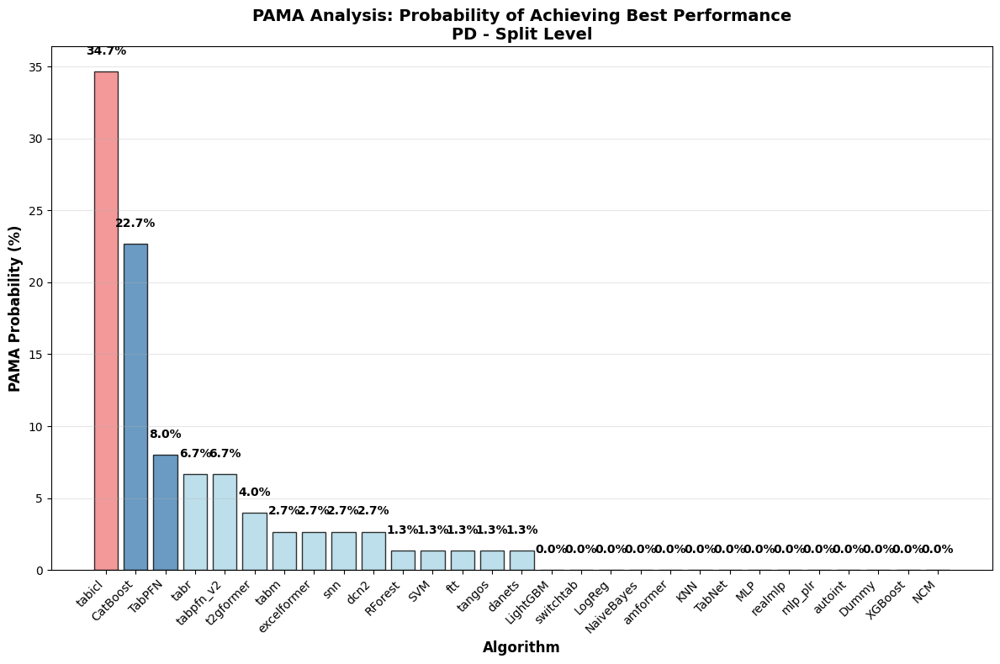


📊 PAMA Analysis: PD Classification (Tuned Hyperparameters)
PAMA ANALYSIS - Probability of Achieving Maximal Accuracy
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: optuna
   Prepared 2075 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tangos', 'xgboost']

🏆 PAMA Results (SPLIT Level):
----------------------------------------------------------------------
tabicl              :   37.3% ( 28.0 wins out of 75 CV splits)
catboost            :   12.0% (  9.0 wins out of 75 CV splits)
tabpfn              :    9.3% (  7.0 wins out of 75 CV splits)
tabm                :    8.0% (  6.0 wins out of 75 CV splits)
tabpfn_v2           :    6.7% (  5.0 wins out of 75 CV splits)
ftt                 :    6.0% (  4.5 wins out o

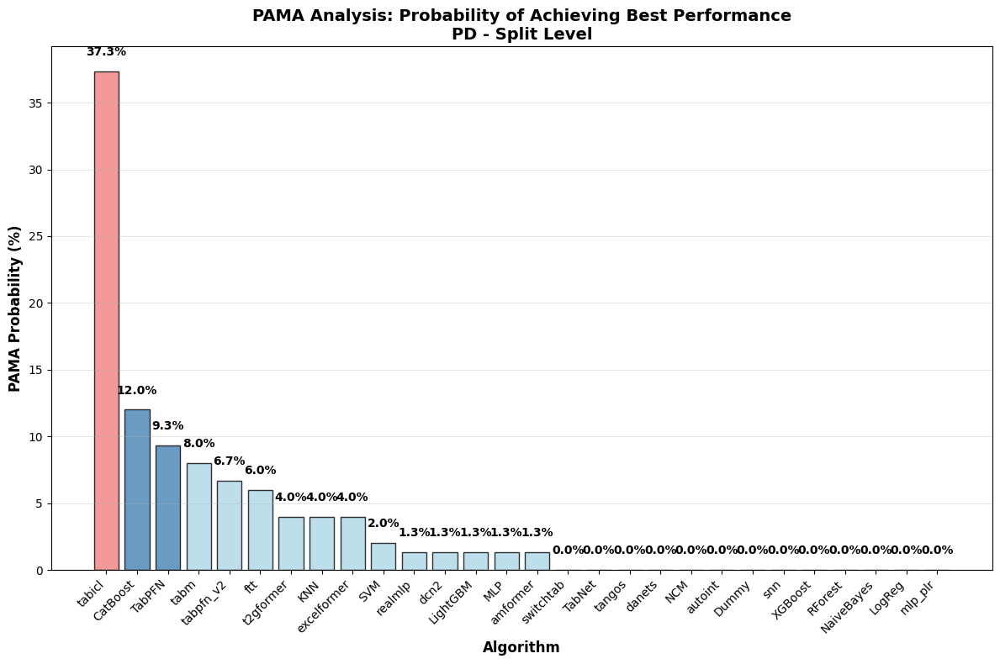


📊 PAMA Analysis: LGD Regression (Default Hyperparameters)
PAMA ANALYSIS - Probability of Achieving Maximal Accuracy
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']

🏆 PAMA Results (SPLIT Level):
----------------------------------------------------------------------
tabpfn_v2           :   42.9% ( 15.0 wins out of 35 CV splits)
modernNCA           :   14.3% (  5.0 wins out of 35 CV splits)
tabm                :    8.6% (  3.0 wins out of 35 CV splits)
catboost            :    8.6% (  3.0 wins out of 35 CV splits)
ftt                 :    5.7% (  2.0 wins out of 35 CV splits)
realmlp             :    5.7% (  2.0 wins out of 35 CV splits)
t2gformer           :    5.7% (  2

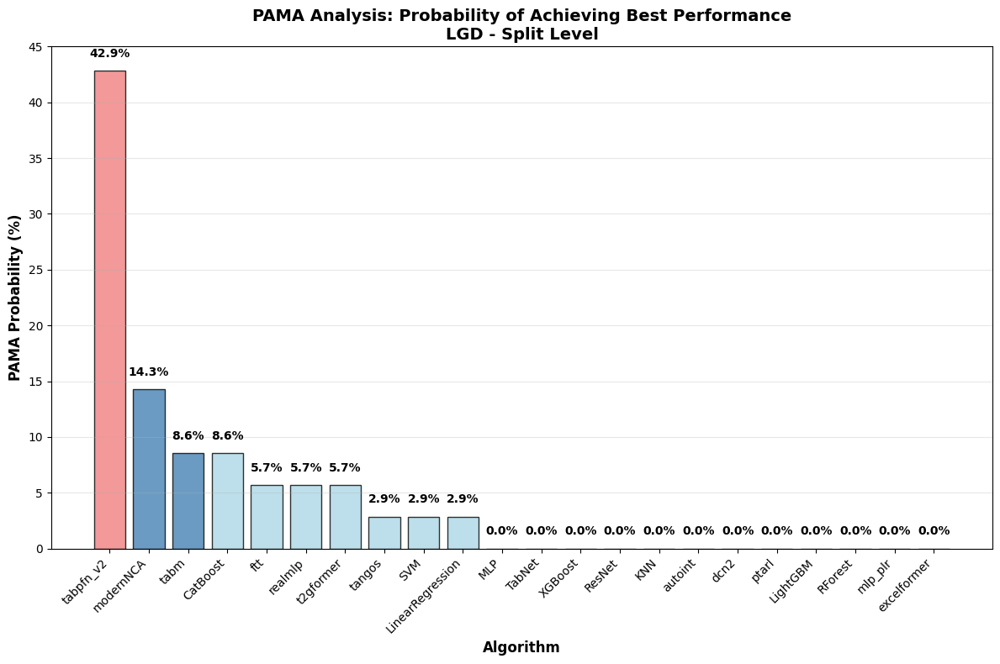


📊 PAMA Analysis: LGD Regression (Tuned Hyperparameters)
PAMA ANALYSIS - Probability of Achieving Maximal Accuracy
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: optuna
   Prepared 685 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']

🏆 PAMA Results (SPLIT Level):
----------------------------------------------------------------------
tabpfn_v2           :   45.7% ( 16.0 wins out of 35 CV splits)
modernNCA           :   14.3% (  5.0 wins out of 35 CV splits)
autoint             :    5.7% (  2.0 wins out of 35 CV splits)
realmlp             :    5.7% (  2.0 wins out of 35 CV splits)
RandomForest        :    5.7% (  2.0 wins out of 35 CV splits)
excelformer         :    5.7% (  2.0 wins out of 35 CV splits)
svm                 :    5.7% (  2.0 

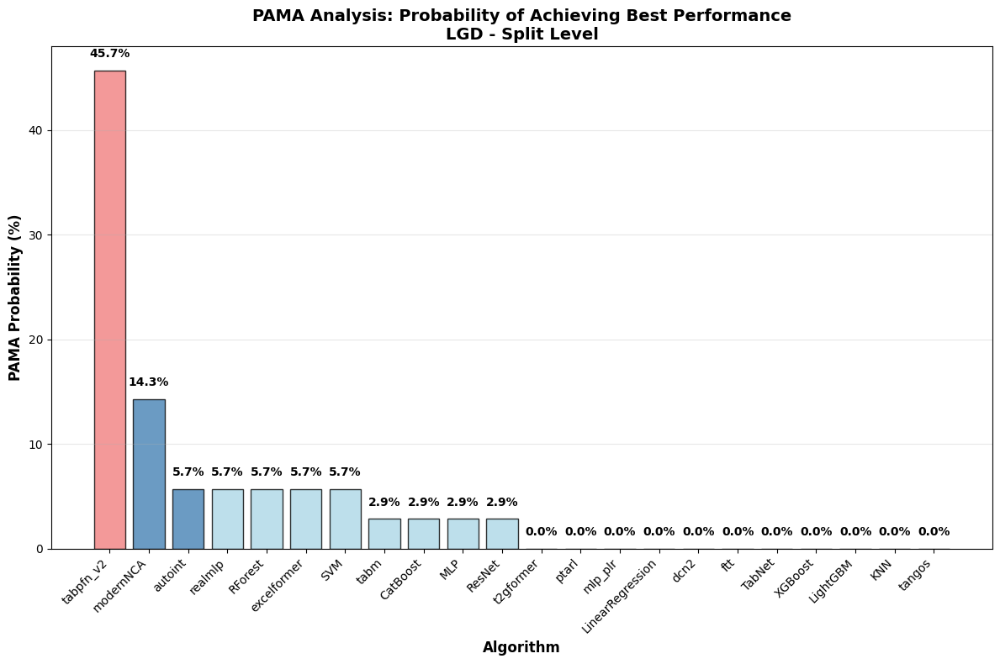

In [10]:
# =============================================================================
# PAMA EXAMPLE: PD Classification Results
# =============================================================================

if not UNIFIED_DF.empty:
    print("\n📊 PAMA Analysis: PD Classification (Default Hyperparameters)")
    pama_pd_default = compute_pama_analysis(
        df=UNIFIED_DF,
        task_filter='pd',
        tuning_strategy='default',
        aggregation_level='split',
        plot=True,
        verbose=True
    )
    print("\n📊 PAMA Analysis: PD Classification (Tuned Hyperparameters)")
    pama_pd_tuned = compute_pama_analysis(
        df=UNIFIED_DF,
        task_filter='pd',
        tuning_strategy='optuna',
        aggregation_level='split',
        plot=True,
        verbose=True
    )
    print("\n📊 PAMA Analysis: LGD Regression (Default Hyperparameters)")
    pama_lgd_default = compute_pama_analysis(
        df=UNIFIED_DF,
        task_filter='lgd',
        tuning_strategy='default',
        aggregation_level='split',
        plot=True,
        verbose=True
    )
    print("\n📊 PAMA Analysis: LGD Regression (Tuned Hyperparameters)")
    pama_lgd_tuned = compute_pama_analysis(
        df=UNIFIED_DF,
        task_filter='lgd',
        tuning_strategy='optuna',
        aggregation_level='split',
        plot=True,
        verbose=True
    )
else:
    print("❌ No data loaded")

## 6. Average Ranks Analysis

In [11]:
# =============================================================================
# AVERAGE RANKS ANALYSIS
# =============================================================================

def calculate_average_ranks(df, task_filter=None, tuning_strategy=None,
                           pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                           ranking_level='dataset', plot=True, verbose=True):
    """
    Calculate average ranks for algorithms across datasets or CV splits.
    
    Parameters:
    - df: Input DataFrame
    - task_filter: 'pd', 'lgd', or None
    - tuning_strategy: 'default', 'optuna', or None
    - ranking_level: 'dataset' or 'split'
    - plot: Create visualization
    - verbose: Print detailed results
    
    Returns:
    - DataFrame with average ranks per algorithm
    """
    if verbose:
        print("=" * 80)
        print("AVERAGE RANKS ANALYSIS")
        print("=" * 80)
    
    # Prepare data
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available for ranking analysis")
        return pd.DataFrame()
    
    algorithms = analysis_data['model'].unique()
    datasets = analysis_data['dataset'].unique()
    
    # Collect ranks
    all_ranks = {alg: [] for alg in algorithms}
    
    for dataset in datasets:
        dataset_data = analysis_data[analysis_data['dataset'] == dataset]
        
        if ranking_level == 'dataset':
            # Average performance per algorithm
            perf = dataset_data.groupby('model')['perf_metric'].mean()
            if len(perf) < 2:
                continue
            
            # Rank (1 = best, higher performance = lower rank)
            ranks = perf.rank(ascending=False, method='average')
            for alg in algorithms:
                if alg in ranks.index:
                    all_ranks[alg].append(ranks[alg])
        
        else:  # split level
            splits = dataset_data['split'].unique()
            for split in splits:
                split_data = dataset_data[dataset_data['split'] == split]
                perf = split_data.set_index('model')['perf_metric']
                
                if len(perf) < 2:
                    continue
                
                ranks = perf.rank(ascending=False, method='average')
                for alg in algorithms:
                    if alg in ranks.index:
                        all_ranks[alg].append(ranks[alg])
    
    # Calculate average ranks
    rank_results = []
    for alg in algorithms:
        if all_ranks[alg]:
            rank_results.append({
                'algorithm': alg,
                'avg_rank': np.mean(all_ranks[alg]),
                'std_rank': np.std(all_ranks[alg]),
                'n_rankings': len(all_ranks[alg])
            })
    
    ranks_df = pd.DataFrame(rank_results)
    ranks_df = ranks_df.sort_values('avg_rank').reset_index(drop=True)
    
    if verbose:
        print(f"\n🏆 Average Ranks ({ranking_level.upper()} Level):")
        print("-" * 60)
        for _, row in ranks_df.iterrows():
            print(f"{row['algorithm']:<20}: {row['avg_rank']:.3f} ± {row['std_rank']:.3f}")
    
    # Plot
    if plot and not ranks_df.empty:
        plt.figure(figsize=(12, 8))
        
        y_pos = np.arange(len(ranks_df))
        bars = plt.barh(y_pos, ranks_df['avg_rank'], xerr=ranks_df['std_rank'],
                        color='steelblue', alpha=0.8, edgecolor='black',
                        capsize=5)
        
        plt.yticks(y_pos, [get_display_name(a) for a in ranks_df['algorithm']])
        plt.xlabel('Average Rank (lower is better)', fontsize=12, fontweight='bold')
        plt.ylabel('Algorithm', fontsize=12, fontweight='bold')
        
        task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
        plt.title(f'Average Ranks Analysis\n{task_str} - {ranking_level.title()} Level',
                  fontsize=14, fontweight='bold')
        plt.grid(True, alpha=0.3, axis='x')
        plt.gca().invert_yaxis()  # Best rank at top
        
        plt.tight_layout()
        plt.show()
    
    return ranks_df

print("✅ Average Ranks function loaded")

✅ Average Ranks function loaded



📊 Average Ranks: PD Classification (Default Hyperparameters)
AVERAGE RANKS ANALYSIS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: optuna
   Prepared 2075 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tangos', 'xgboost']

🏆 Average Ranks (DATASET Level):
------------------------------------------------------------
tabicl              : 2.692 ± 2.812
catboost            : 6.733 ± 5.507
ftt                 : 7.200 ± 3.390
t2gformer           : 7.800 ± 4.969
lightgbm            : 9.067 ± 6.618
amformer            : 10.357 ± 5.313
RandomForest        : 10.733 ± 6.308
tabm                : 11.667 ± 5.793
realmlp             : 11.867 ± 6.662
excelformer         : 12.133 ± 6.469
mlp_plr             : 12.467 ± 6.662


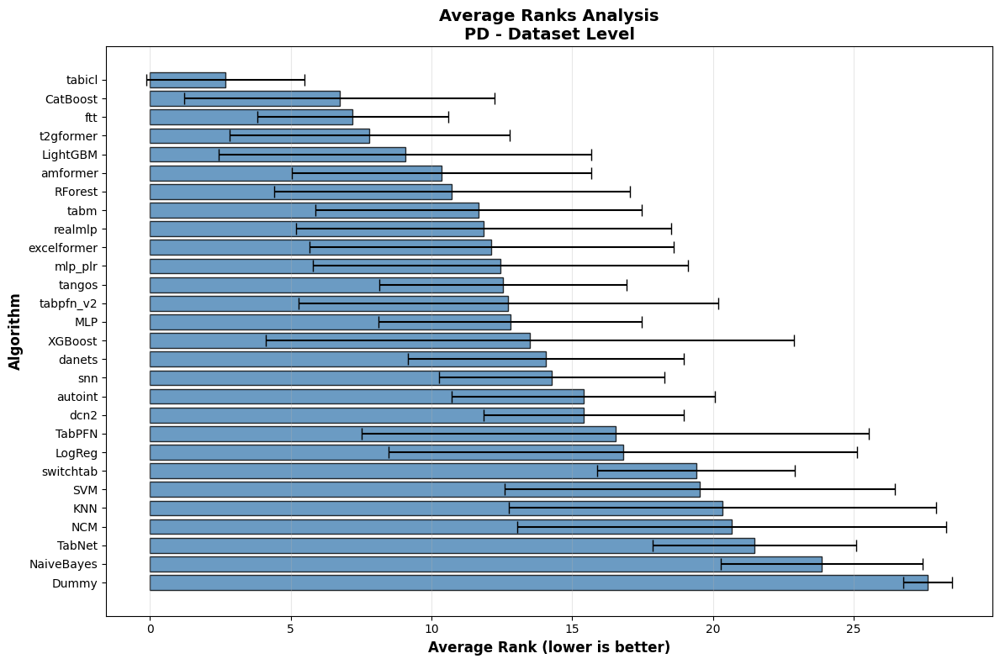


📊 Average Ranks: LGD Regression (Default Hyperparameters)
AVERAGE RANKS ANALYSIS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: optuna
   Prepared 685 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']

🏆 Average Ranks (DATASET Level):
------------------------------------------------------------
catboost            : 3.833 ± 2.734
tabpfn_v2           : 6.167 ± 7.151
realmlp             : 6.167 ± 2.478
excelformer         : 7.429 ± 4.135
lightgbm            : 7.667 ± 3.145
ptarl               : 8.500 ± 6.131
xgboost             : 8.667 ± 4.749
tabm                : 8.667 ± 6.725
t2gformer           : 9.333 ± 3.350
dcn2                : 9.667 ± 5.249
ftt                 : 10.000 ± 4.041
RandomForest        : 11.000 ± 6.481
modernNCA           :

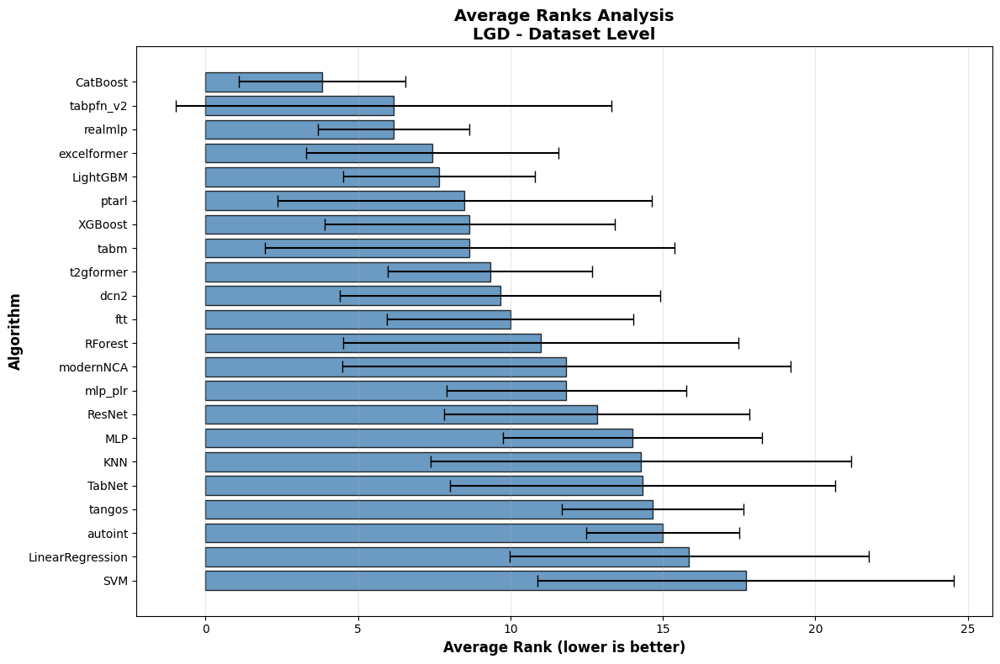

In [12]:
# =============================================================================
# AVERAGE RANKS EXAMPLE
# =============================================================================

if not UNIFIED_DF.empty:
    print("\n📊 Average Ranks: PD Classification (Default Hyperparameters)")
    ranks_pd_default = calculate_average_ranks(
        df=UNIFIED_DF,
        task_filter='pd',
        tuning_strategy='optuna',
        ranking_level='dataset',
        plot=True,
        verbose=True
    )
    print("\n📊 Average Ranks: LGD Regression (Default Hyperparameters)")
    ranks_pd_default = calculate_average_ranks(
        df=UNIFIED_DF,
        task_filter='lgd',
        tuning_strategy='optuna',
        ranking_level='dataset',
        plot=True,
        verbose=True
    )
else:
    print("❌ No data loaded")

## 7. Critical Difference Diagrams (Wilcoxon-Holm Test)

In [13]:
# =============================================================================
# STATISTICAL SIGNIFICANCE - WILCOXON-HOLM & CD DIAGRAMS
# =============================================================================

def form_cliques(p_values, algorithm_names):
    """
    Form cliques of algorithms that are not significantly different.
    Uses networkx graph theory.
    """
    m = len(algorithm_names)
    g_data = np.zeros((m, m), dtype=np.int64)
    
    for p_val_info in p_values:
        if not p_val_info[3]:  # Not significant
            i = np.where(algorithm_names == p_val_info[0])[0][0]
            j = np.where(algorithm_names == p_val_info[1])[0][0]
            min_i, max_j = min(i, j), max(i, j)
            g_data[min_i, max_j] = 1
    
    graph = nx.Graph(g_data)
    return list(nx.find_cliques(graph))


def wilcoxon_holm_analysis(df_analysis_data, alpha=0.05, verbose=True):
    """
    Apply Wilcoxon signed-rank test with Holm correction.
    
    Returns:
    - p_values: List of (alg1, alg2, p_value, is_significant)
    - average_ranks: Series with algorithm ranks
    - max_datasets: Number of comparison units
    """
    if verbose:
        print("\n🔬 WILCOXON-HOLM STATISTICAL ANALYSIS")
        print("-" * 60)
    
    # Count datasets per algorithm
    alg_counts = df_analysis_data.groupby('model')['dataset'].nunique()
    max_datasets = alg_counts.max()
    complete_algorithms = list(alg_counts[alg_counts == max_datasets].index)
    
    if len(complete_algorithms) < 2:
        print(f"❌ Need at least 2 algorithms with complete coverage")
        return [], pd.Series(), 0
    
    if verbose:
        print(f"   Using {len(complete_algorithms)} algorithms with {max_datasets} datasets")
    
    # Get algorithm performances
    filtered_data = df_analysis_data[df_analysis_data['model'].isin(complete_algorithms)]
    algorithm_performances = {}
    
    for alg in complete_algorithms:
        alg_data = filtered_data[filtered_data['model'] == alg]
        dataset_avg = alg_data.groupby('dataset')['perf_metric'].mean()
        algorithm_performances[alg] = dataset_avg.sort_index().values
    
    # Friedman test
    friedman_stat, friedman_p = friedmanchisquare(*algorithm_performances.values())
    if verbose:
        print(f"   Friedman test: stat={friedman_stat:.4f}, p={friedman_p:.6f}")
    
    # Pairwise Wilcoxon tests
    p_values = []
    m = len(complete_algorithms)
    
    for i in range(m - 1):
        for j in range(i + 1, m):
            alg1, alg2 = complete_algorithms[i], complete_algorithms[j]
            try:
                _, p_val = wilcoxon(algorithm_performances[alg1], 
                                    algorithm_performances[alg2], 
                                    zero_method='pratt')
                p_values.append((alg1, alg2, p_val, False))
            except ValueError:
                continue
    
    # Holm correction
    k = len(p_values)
    if k == 0:
        return [], pd.Series(), 0
    
    p_values.sort(key=lambda x: x[2])
    
    for i in range(k):
        corrected_alpha = alpha / (k - i)
        if p_values[i][2] <= corrected_alpha:
            p_values[i] = (p_values[i][0], p_values[i][1], p_values[i][2], True)
        else:
            break
    
    # Calculate average ranks
    perf_matrix = np.array([algorithm_performances[alg] for alg in complete_algorithms])
    df_ranks = pd.DataFrame(perf_matrix, index=complete_algorithms)
    average_ranks = df_ranks.rank(axis=0, ascending=False).mean(axis=1).sort_values()
    
    if verbose:
        sig_count = sum(1 for p in p_values if p[3])
        print(f"   Significant pairs: {sig_count}/{len(p_values)}")
    
    return p_values, average_ranks, max_datasets


def draw_cd_diagram(average_ranks, p_values, title=None, save_path=None):
    """
    Draw Critical Difference diagram.
    
    Algorithms connected by a horizontal line are NOT significantly different.
    """
    if isinstance(average_ranks, pd.Series):
        ranks_values = average_ranks.values
        names = np.array(average_ranks.index)
    else:
        return
    
    display_names = np.array([get_display_name(n) for n in names])
    
    k = len(ranks_values)
    
    # =========================================================================
    # IMPROVED SIZING - Scale based on number of algorithms
    # =========================================================================
    
    width = max(12, k * 0.8)  # Wider figure
    textspace = 2.5  # More space for algorithm names
    scalewidth = width - 2 * textspace
    
    lowv = 1
    highv = k  # Use number of algorithms as max rank
    
    # Height scales with number of algorithms
    line_height = 0.35  # Space per algorithm
    cline = 0.8  # Position of main axis from bottom
    height = cline + (math.ceil(k / 2) + 1) * line_height + 1.0
    
    fig, ax = plt.subplots(figsize=(width, height))
    fig.set_facecolor('white')
    ax.set_axis_off()
    
    def rankpos(rank):
        """Convert rank to x position."""
        return textspace + scalewidth / (highv - lowv) * (rank - lowv)
    
    # =========================================================================
    # DRAW MAIN AXIS
    # =========================================================================
    
    # Main horizontal axis line
    ax.plot([textspace, width - textspace], [cline, cline], 
            color='black', linewidth=1.5)
    
    # Tick marks and labels
    for rank in range(lowv, highv + 1):
        xpos = rankpos(rank)
        # Tick mark
        ax.plot([xpos, xpos], [cline - 0.15, cline + 0.05], 
                color='black', linewidth=1.5)
        # Rank label
        ax.text(xpos, cline - 0.25, str(rank), 
                ha='center', va='top', fontsize=11, fontweight='bold')
    
    # Axis label
    ax.text(width / 2, cline - 0.55, 'Average Rank', 
            ha='center', va='top', fontsize=12, fontweight='bold')
    
    # =========================================================================
    # DRAW ALGORITHM NAMES AND CONNECTING LINES
    # =========================================================================
    
    # Split algorithms: better ranked on left, worse on right
    n_left = math.ceil(k / 2)
    n_right = k - n_left
    
    # Left side (better ranks)
    for i in range(n_left):
        rank = ranks_values[i]
        name = display_names[i]
        
        # Vertical position (stacked from axis upward)
        y_pos = cline + 0.3 + i * line_height
        x_rank = rankpos(rank)
        
        # Draw connecting line: from rank position up, then left to name
        ax.plot([x_rank, x_rank], [cline, y_pos], 
                color='black', linewidth=1.0)
        ax.plot([x_rank, textspace - 0.1], [y_pos, y_pos], 
                color='black', linewidth=1.0)
        
        # Algorithm name (right-aligned)
        ax.text(textspace - 0.2, y_pos, name, 
                ha='right', va='center', fontsize=11, fontweight='bold')
        
        # Rank value (small, next to name)
        ax.text(textspace - 0.2, y_pos - 0.12, f'({rank:.2f})', 
                ha='right', va='center', fontsize=9, color='gray')
    
    # Right side (worse ranks)
    for i in range(n_left, k):
        rank = ranks_values[i]
        name = display_names[i]
        
        # Vertical position (stacked from axis upward, in reverse order)
        y_pos = cline + 0.3 + (k - i - 1) * line_height
        x_rank = rankpos(rank)
        
        # Draw connecting line: from rank position up, then right to name
        ax.plot([x_rank, x_rank], [cline, y_pos], 
                color='black', linewidth=1.0)
        ax.plot([x_rank, width - textspace + 0.1], [y_pos, y_pos], 
                color='black', linewidth=1.0)
        
        # Algorithm name (left-aligned)
        ax.text(width - textspace + 0.2, y_pos, name, 
                ha='left', va='center', fontsize=11, fontweight='bold')
        
        # Rank value (small, next to name)
        ax.text(width - textspace + 0.2, y_pos - 0.12, f'({rank:.2f})', 
                ha='left', va='center', fontsize=9, color='gray')
    
    # =========================================================================
    # DRAW CLIQUES (NON-SIGNIFICANT GROUPS)
    # =========================================================================
    
    cliques = form_cliques(p_values, names)
    
    # Sort cliques by span (smallest first) for better visual layering
    clique_spans = []
    for clq in cliques:
        if len(clq) <= 1:
            continue
        clq_ranks = [ranks_values[idx] for idx in clq]
        min_rank, max_rank = min(clq_ranks), max(clq_ranks)
        clique_spans.append((min_rank, max_rank, max_rank - min_rank))
    
    # Sort by span size
    clique_spans.sort(key=lambda x: x[2])
    
    # Draw clique bars below the axis
    bar_y = cline + 0.12
    bar_spacing = 0.08
    
    for min_rank, max_rank, span in clique_spans:
        x_start = rankpos(min_rank)
        x_end = rankpos(max_rank)
        
        ax.plot([x_start, x_end], [bar_y, bar_y], 
                color='black', linewidth=3, solid_capstyle='round')
        
        bar_y += bar_spacing
    
    # =========================================================================
    # TITLE AND LIMITS
    # =========================================================================
    
    if title:
        ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    
    # Set axis limits with padding
    ax.set_xlim(0, width)
    ax.set_ylim(-0.5, height)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300, facecolor='white')
        print(f"📁 Saved: {save_path}")
    
    plt.show()


def statistical_significance_analysis(df, task_filter=None, tuning_strategy=None,
                                      pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                                      aggregation_level='dataset', alpha=0.05,
                                      plot=True, title=None, save_path=None, verbose=True):
    """
    Complete statistical significance analysis with CD diagram.
    
    Returns dictionary with:
    - p_values, average_ranks, significant_pairs, etc.
    """
    if verbose:
        print("=" * 80)
        print("STATISTICAL SIGNIFICANCE ANALYSIS")
        print("=" * 80)
    
    # Prepare data
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return {}
    
    # Handle aggregation level
    if aggregation_level == 'split':
        stat_data = analysis_data.copy()
        stat_data['comparison_unit'] = stat_data['dataset'] + '_split_' + stat_data['split'].astype(str)
        stat_data = stat_data.rename(columns={'comparison_unit': 'dataset'})
    else:
        stat_data = analysis_data.groupby(['model', 'dataset'])['perf_metric'].mean().reset_index()
    
    # Run analysis
    p_values, average_ranks, max_datasets = wilcoxon_holm_analysis(
        stat_data, alpha=alpha, verbose=verbose
    )
    
    if len(p_values) == 0:
        print("❌ Analysis failed")
        return {}
    
    # Plot CD diagram
    if plot:
        if title is None:
            task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
            title = f'Critical Difference Diagram\n{task_str} - {aggregation_level.title()} Level (α={alpha})'
        draw_cd_diagram(average_ranks, p_values, title=title, save_path=save_path)
    
    results = {
        'p_values': p_values,
        'average_ranks': average_ranks,
        'max_datasets': max_datasets,
        'alpha': alpha,
        'significant_pairs': [(p[0], p[1]) for p in p_values if p[3]],
        'total_comparisons': len(p_values),
        'significant_comparisons': sum(1 for p in p_values if p[3])
    }
    
    if verbose:
        print(f"\n✅ Analysis complete")
        print(f"   Significant pairs: {results['significant_comparisons']}/{results['total_comparisons']}")
    
    return results


print("✅ Statistical significance functions loaded")

✅ Statistical significance functions loaded



📊 Statistical Significance: PD Classification (Default)
STATISTICAL SIGNIFICANCE ANALYSIS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']

🔬 WILCOXON-HOLM STATISTICAL ANALYSIS
------------------------------------------------------------
   Using 25 algorithms with 15 datasets
   Friedman test: stat=191.5422, p=0.000000
   Significant pairs: 69/300


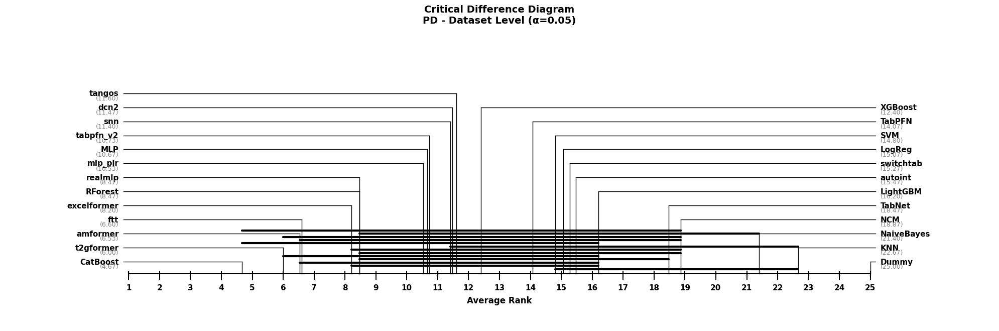


✅ Analysis complete
   Significant pairs: 69/300

📊 Statistical Significance: LGD Regression (Default)
STATISTICAL SIGNIFICANCE ANALYSIS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']

🔬 WILCOXON-HOLM STATISTICAL ANALYSIS
------------------------------------------------------------
   Using 4 algorithms with 7 datasets
   Friedman test: stat=12.0857, p=0.007095
   Significant pairs: 0/6


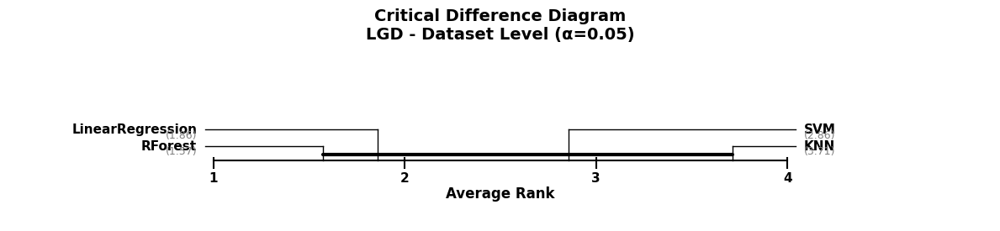


✅ Analysis complete
   Significant pairs: 0/6


In [14]:
# =============================================================================
# CRITICAL DIFFERENCE EXAMPLE
# =============================================================================

if not UNIFIED_DF.empty:
    print("\n📊 Statistical Significance: PD Classification (Default)")
    cd_results = statistical_significance_analysis(
        df=UNIFIED_DF,
        task_filter='pd',
        tuning_strategy='default',
        aggregation_level='dataset',
        alpha=0.05,
        plot=True,
        verbose=True
    )
    print("\n📊 Statistical Significance: LGD Regression (Default)")
    cd_results = statistical_significance_analysis(
        df=UNIFIED_DF,
        task_filter='lgd',
        tuning_strategy='default',
        aggregation_level='dataset',
        alpha=0.05,
        plot=True,
        verbose=True
    )
else:
    print("❌ No data loaded")

## 8. Baseline Improvement Analysis

In [15]:
# =============================================================================
# BASELINE IMPROVEMENT ANALYSIS
# =============================================================================

def compute_baseline_improvement(df, task_filter=None, tuning_strategy=None,
                                pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                                baseline_algorithm='LogReg', aggregation_level='dataset',
                                plot=True, figsize=(14, 8), verbose=True):
    """
    Compute percentage improvement of algorithms over a baseline.
    
    Parameters:
    - baseline_algorithm: Algorithm to use as baseline (default: 'LogReg')
    - aggregation_level: 'dataset' or 'split'
    
    Returns:
    - Dictionary with algorithm names as keys and improvement lists as values
    """
    if verbose:
        print("=" * 80)
        print("BASELINE IMPROVEMENT ANALYSIS")
        print("=" * 80)
        print(f"   Baseline: {baseline_algorithm}")
    
    # Prepare data
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return {}
    
    # Check baseline exists
    available_models = analysis_data['model'].unique()
    if baseline_algorithm not in available_models:
        print(f"❌ Baseline '{baseline_algorithm}' not found")
        print(f"   Available: {sorted(available_models)}")
        return {}
    
    datasets = analysis_data['dataset'].unique()
    other_algorithms = [a for a in available_models if a != baseline_algorithm]
    
    # Calculate improvements
    improvements = {alg: [] for alg in other_algorithms}
    
    for dataset in datasets:
        dataset_data = analysis_data[analysis_data['dataset'] == dataset]
        
        if aggregation_level == 'dataset':
            perf = dataset_data.groupby('model')['perf_metric'].mean()
            if baseline_algorithm not in perf.index:
                continue
            
            baseline_perf = perf[baseline_algorithm]
            
            for alg in other_algorithms:
                if alg in perf.index and baseline_perf != 0:
                    pct_imp = ((perf[alg] - baseline_perf) / abs(baseline_perf)) * 100
                    improvements[alg].append(pct_imp)
        
        else:  # split level
            splits = dataset_data['split'].unique()
            for split in splits:
                split_data = dataset_data[dataset_data['split'] == split]
                perf = split_data.set_index('model')['perf_metric']
                
                if baseline_algorithm not in perf.index:
                    continue
                
                baseline_perf = perf[baseline_algorithm]
                
                for alg in other_algorithms:
                    if alg in perf.index and baseline_perf != 0:
                        pct_imp = ((perf[alg] - baseline_perf) / abs(baseline_perf)) * 100
                        improvements[alg].append(pct_imp)
    
    # Filter algorithms with data
    improvements = {k: v for k, v in improvements.items() if v}
    
    if not improvements:
        print("❌ No improvements calculated")
        return {}
    
    # Sort by median improvement
    sorted_algs = sorted(improvements.keys(), 
                         key=lambda x: np.median(improvements[x]), 
                         reverse=True)
    
    if verbose:
        print(f"\n📊 Improvement Summary (vs {baseline_algorithm}):")
        print("-" * 60)
        for alg in sorted_algs:
            vals = improvements[alg]
            print(f"{alg:<20}: median={np.median(vals):+.2f}%, "
                  f"mean={np.mean(vals):+.2f}%, n={len(vals)}")
    
    # Plot boxplot
    if plot:
        plt.figure(figsize=figsize)
        
        data = [improvements[alg] for alg in sorted_algs]
        labels = [get_display_name(alg) for alg in sorted_algs]
        
        bp = plt.boxplot(data, labels=labels, notch=True, patch_artist=True)
        
        # Color boxes
        for i, patch in enumerate(bp['boxes']):
            median = np.median(data[i])
            if median > 0:
                patch.set_facecolor('lightgreen')
            else:
                patch.set_facecolor('lightcoral')
            patch.set_alpha(0.7)
        
        plt.axhline(y=0, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Baseline')
        
        plt.xlabel('Algorithm', fontsize=12, fontweight='bold')
        plt.ylabel(f'% Improvement over {baseline_algorithm}', fontsize=12, fontweight='bold')
        
        task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
        plt.title(f'Baseline Improvement Analysis\n{task_str} - {aggregation_level.title()} Level',
                  fontsize=14, fontweight='bold')
        
        plt.xticks(rotation=45, ha='right')
        plt.grid(True, alpha=0.3, axis='y')
        plt.legend(loc='upper right')
        
        plt.tight_layout()
        plt.show()
    
    return improvements

print("✅ Baseline improvement function loaded")

✅ Baseline improvement function loaded


Available models: ['LinearRegression', 'LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']

📊 Baseline Improvement: PD Classification (vs LogReg)
BASELINE IMPROVEMENT ANALYSIS
   Baseline: LogReg
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']

📊 Improvement Summary (vs LogReg):
------------------------------------------------------------
t

C:\Users\U0152019\AppData\Local\Temp\ipykernel_20052\3581433918.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot(data, labels=labels, notch=True, patch_artist=True)


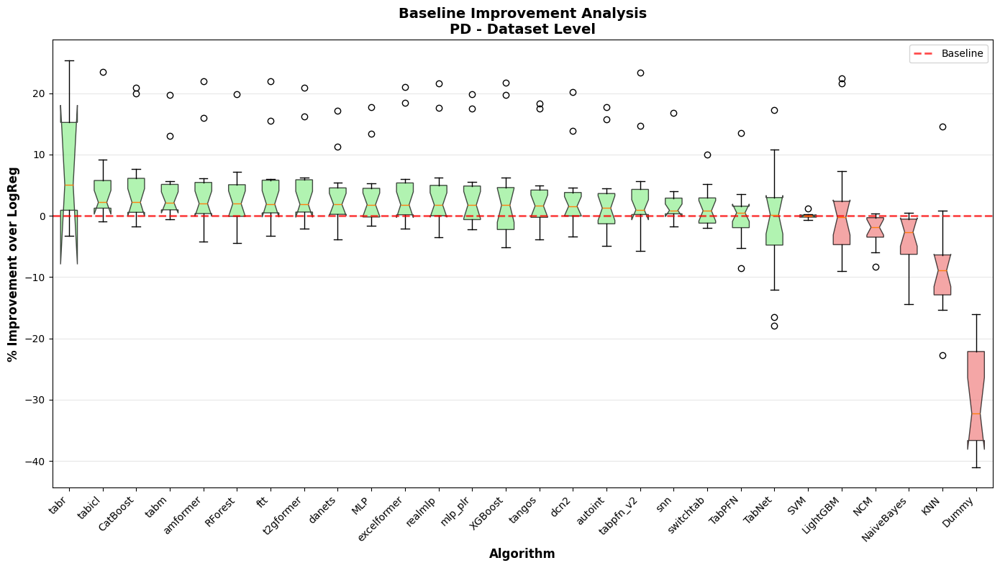

In [16]:
# =============================================================================
# BASELINE IMPROVEMENT EXAMPLE
# =============================================================================

if not UNIFIED_DF.empty:
    # Find a suitable baseline
    available_models = UNIFIED_DF['model'].unique()
    print(f"Available models: {sorted(available_models)}")
    
    # Try to find LogReg or similar baseline
    baseline = None
    for candidate in ['LogReg', 'LinearReg', 'Dummy', 'KNN']:
        if candidate in available_models:
            baseline = candidate
            break
    
    if baseline:
        print(f"\n📊 Baseline Improvement: PD Classification (vs {baseline})")
        improvements = compute_baseline_improvement(
            df=UNIFIED_DF,
            task_filter='pd',
            tuning_strategy='default',
            baseline_algorithm=baseline,
            aggregation_level='dataset',
            plot=True,
            verbose=True
        )
    else:
        print("❌ No suitable baseline found in data")
else:
    print("❌ No data loaded")

## 9. Tuning Impact Analysis

In [17]:
# =============================================================================
# TUNING IMPACT ANALYSIS
# =============================================================================

def analyze_tuning_impact(df, task_filter=None, pd_metric=MAIN_PD_METRIC, 
                         lgd_metric=MAIN_LGD_METRIC, plot=True, verbose=True):
    """
    Compare algorithm performance: Default vs Optimized (HPO).
    
    Creates overlapping bar chart showing performance gain from HPO.
    """
    if verbose:
        print("=" * 80)
        print("TUNING IMPACT ANALYSIS: Default vs HPO")
        print("=" * 80)
    
    # Prepare data for both strategies
    metric = pd_metric if task_filter == 'pd' else lgd_metric
    
    default_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        task_filter=task_filter, tuning_strategy='default'
    )
    
    hpo_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        task_filter=task_filter, tuning_strategy='optuna'
    )
    
    if default_data.empty or hpo_data.empty:
        print("❌ Missing data for one or both tuning strategies")
        return {}
    
    # Get common algorithms
    common_algs = set(default_data['model'].unique()) & set(hpo_data['model'].unique())
    
    if not common_algs:
        print("❌ No common algorithms")
        return {}
    
    # Calculate average performance
    results = {}
    for alg in common_algs:
        default_perf = default_data[default_data['model'] == alg]['perf_metric'].mean()
        hpo_perf = hpo_data[hpo_data['model'] == alg]['perf_metric'].mean()
        results[alg] = {
            'default': default_perf,
            'hpo': hpo_perf,
            'improvement': hpo_perf - default_perf,
            'improvement_pct': ((hpo_perf - default_perf) / abs(default_perf)) * 100 if default_perf != 0 else 0
        }
    
    # Sort by HPO performance
    sorted_algs = sorted(results.keys(), key=lambda x: results[x]['hpo'], reverse=True)
    
    if verbose:
        print(f"\n📊 Tuning Impact Summary:")
        print("-" * 70)
        for alg in sorted_algs:
            r = results[alg]
            print(f"{alg:<20}: Default={r['default']:.4f}, HPO={r['hpo']:.4f}, "
                  f"Δ={r['improvement']:+.4f} ({r['improvement_pct']:+.1f}%)")
    
    # Plot
    if plot:
        fig, ax = plt.subplots(figsize=(14, 8))
        
        x_pos = np.arange(len(sorted_algs))
        default_vals = [results[a]['default'] for a in sorted_algs]
        hpo_vals = [results[a]['hpo'] for a in sorted_algs]
        
        # Overlapping bars
        bars_default = ax.bar(x_pos, default_vals, width=0.8, label='Default',
                              color='lightcoral', alpha=0.9, edgecolor='darkred', linewidth=1.5)
        bars_hpo = ax.bar(x_pos, hpo_vals, width=0.7, label='HPO (Optuna)',
                          color='steelblue', alpha=0.8, edgecolor='darkblue', linewidth=1.5)
        
        ax.set_xlabel('Algorithm', fontsize=12, fontweight='bold')
        ax.set_ylabel(f'Average {metric}', fontsize=12, fontweight='bold')
        
        task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
        ax.set_title(f'Tuning Impact: Default vs HPO Performance\n{task_str}',
                     fontsize=14, fontweight='bold')
        
        ax.set_xticks(x_pos)
        ax.set_xticklabels([get_display_name(a) for a in sorted_algs], rotation=45, ha='right')
        ax.legend(loc='upper right', fontsize=12)
        ax.grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return results

print("✅ Tuning impact function loaded")

✅ Tuning impact function loaded



📊 Tuning Impact: PD Classification
TUNING IMPACT ANALYSIS: Default vs HPO
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: optuna
   Prepared 685 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']

📊 Tuning Impact Summary:
----------------------------------------------------------------------
tabm                : Default=0.4431, HPO=0.4667, Δ=+0.0235 (+5.3%)
t2gformer           : D

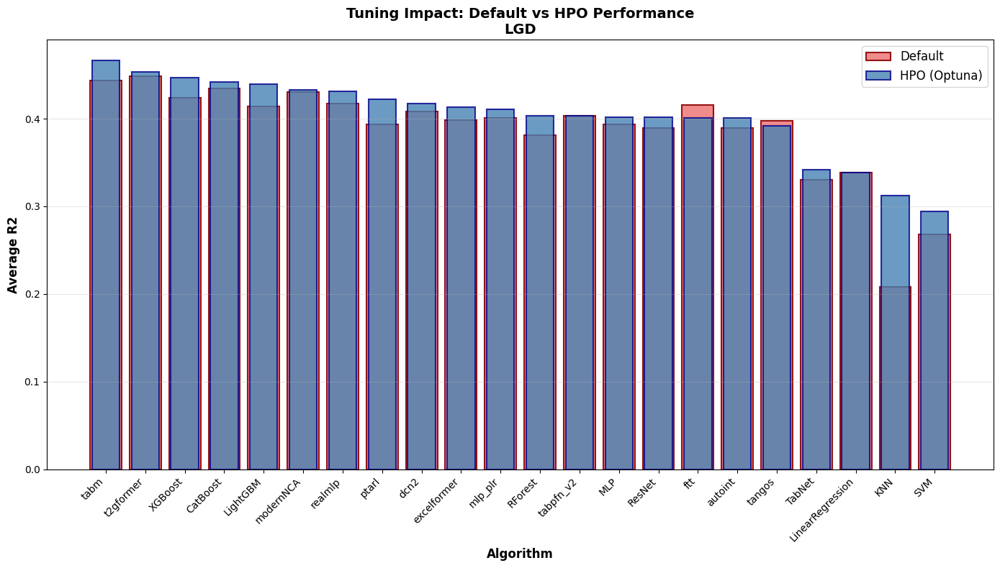


📊 Tuning Impact: PD Classification
TUNING IMPACT ANALYSIS: Default vs HPO
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: optuna
   Prepared 2075 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tangos', 'xgboost']

📊 Tuning Impact Summary:
------------------------------------------------------

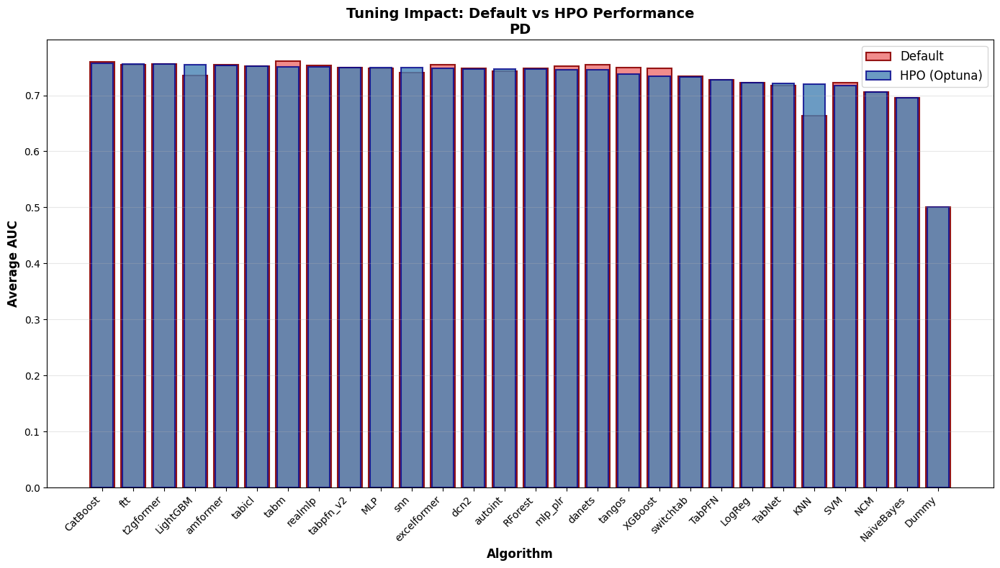

In [18]:
# =============================================================================
# TUNING IMPACT EXAMPLE
# =============================================================================

if not UNIFIED_DF.empty:
    # Check if both tuning strategies exist
    strategies = UNIFIED_DF['tuning_strategy'].unique()

    if 'default' in strategies and 'optuna' in strategies:
        print("\n📊 Tuning Impact: PD Classification")
        tuning_results = analyze_tuning_impact(
            df=UNIFIED_DF,
            task_filter='lgd',
            plot=True,
            verbose=True
        )

    if 'default' in strategies and 'optuna' in strategies:
        print("\n📊 Tuning Impact: PD Classification")
        tuning_results = analyze_tuning_impact(
            df=UNIFIED_DF,
            task_filter='pd',
            plot=True,
            verbose=True
        )
    else:
        print(f"⚠️ Both 'default' and 'optuna' strategies needed. Found: {strategies}")
else:
    print("❌ No data loaded")

## 10. Pairwise Algorithm Comparison

In [19]:
# =============================================================================
# PAIRWISE COMPARISON SCATTER PLOT
# =============================================================================

def compare_algorithms_scatter(df, algorithm1, algorithm2, task_filter=None,
                               tuning_strategy=None, pd_metric=MAIN_PD_METRIC,
                               lgd_metric=MAIN_LGD_METRIC, aggregation_level='dataset',
                               plot=True, verbose=True):
    """
    Create scatter plot comparing two algorithms.
    
    Points above diagonal: algorithm2 is better
    Points below diagonal: algorithm1 is better
    """
    if verbose:
        print("=" * 80)
        print(f"PAIRWISE COMPARISON: {algorithm1} vs {algorithm2}")
        print("=" * 80)
    
    # Prepare data
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return pd.DataFrame()
    
    # Check algorithms exist
    available = analysis_data['model'].unique()
    for alg in [algorithm1, algorithm2]:
        if alg not in available:
            print(f"❌ Algorithm '{alg}' not found. Available: {sorted(available)}")
            return pd.DataFrame()
    
    # Build comparison data
    alg1_data = analysis_data[analysis_data['model'] == algorithm1]
    alg2_data = analysis_data[analysis_data['model'] == algorithm2]
    
    comparison_rows = []
    datasets = set(alg1_data['dataset'].unique()) & set(alg2_data['dataset'].unique())
    
    for dataset in datasets:
        if aggregation_level == 'dataset':
            perf1 = alg1_data[alg1_data['dataset'] == dataset]['perf_metric'].mean()
            perf2 = alg2_data[alg2_data['dataset'] == dataset]['perf_metric'].mean()
            comparison_rows.append({
                'dataset': dataset,
                'alg1_perf': perf1,
                'alg2_perf': perf2,
                'winner': algorithm2 if perf2 > perf1 else algorithm1 if perf1 > perf2 else 'tie'
            })
        else:  # split level
            alg1_ds = alg1_data[alg1_data['dataset'] == dataset]
            alg2_ds = alg2_data[alg2_data['dataset'] == dataset]
            splits = set(alg1_ds['split'].unique()) & set(alg2_ds['split'].unique())
            
            for split in splits:
                perf1 = alg1_ds[alg1_ds['split'] == split]['perf_metric'].iloc[0]
                perf2 = alg2_ds[alg2_ds['split'] == split]['perf_metric'].iloc[0]
                comparison_rows.append({
                    'dataset': f"{dataset}_s{split}",
                    'alg1_perf': perf1,
                    'alg2_perf': perf2,
                    'winner': algorithm2 if perf2 > perf1 else algorithm1 if perf1 > perf2 else 'tie'
                })
    
    if not comparison_rows:
        print("❌ No comparison data")
        return pd.DataFrame()
    
    comparison_df = pd.DataFrame(comparison_rows)
    
    # Calculate statistics
    total = len(comparison_df)
    alg1_wins = len(comparison_df[comparison_df['winner'] == algorithm1])
    alg2_wins = len(comparison_df[comparison_df['winner'] == algorithm2])
    ties = total - alg1_wins - alg2_wins
    
    if verbose:
        print(f"\n📊 Results: {total} comparisons")
        print(f"   {algorithm1} wins: {alg1_wins} ({100*alg1_wins/total:.1f}%)")
        print(f"   {algorithm2} wins: {alg2_wins} ({100*alg2_wins/total:.1f}%)")
        print(f"   Ties: {ties} ({100*ties/total:.1f}%)")
    
    # Plot
    if plot:
        plt.figure(figsize=(10, 10))
        
        colors = ['steelblue' if w == algorithm2 else 'lightcoral' if w == algorithm1 else 'gray'
                  for w in comparison_df['winner']]
        
        plt.scatter(comparison_df['alg1_perf'], comparison_df['alg2_perf'],
                    c=colors, alpha=0.7, s=60, edgecolors='black', linewidth=0.5)
        
        # Diagonal line
        min_val = min(comparison_df['alg1_perf'].min(), comparison_df['alg2_perf'].min())
        max_val = max(comparison_df['alg1_perf'].max(), comparison_df['alg2_perf'].max())
        plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, linewidth=2)
        
        plt.xlabel(f'{get_display_name(algorithm1)} Performance', fontsize=12, fontweight='bold')
        plt.ylabel(f'{get_display_name(algorithm2)} Performance', fontsize=12, fontweight='bold')
        
        task_str = task_filter.upper() if task_filter else "Joint PD+LGD"
        plt.title(f'Algorithm Comparison: {get_display_name(algorithm1)} vs {get_display_name(algorithm2)}\n'
                  f'{task_str} - {aggregation_level.title()} Level',
                  fontsize=14, fontweight='bold')
        
        # Legend
        legend_elements = [
            Patch(facecolor='steelblue', alpha=0.7, label=f'{get_display_name(algorithm2)} wins ({alg2_wins})'),
            Patch(facecolor='lightcoral', alpha=0.7, label=f'{get_display_name(algorithm1)} wins ({alg1_wins})'),
            plt.Line2D([0], [0], color='k', linestyle='--', alpha=0.5, label='Equal')
        ]
        plt.legend(handles=legend_elements, loc='upper left')
        
        plt.grid(True, alpha=0.3)
        plt.axis('equal')
        plt.tight_layout()
        plt.show()
    
    return comparison_df

print("✅ Pairwise comparison function loaded")

✅ Pairwise comparison function loaded


In [20]:
# =============================================================================
# PAIRWISE COMPARISON EXAMPLE
# =============================================================================

if not UNIFIED_DF.empty:
    available = sorted(UNIFIED_DF['model'].unique())
    print(f"Available algorithms: {available}")
    
    if len(available) >= 2:
        # Compare first two available algorithms
        alg1, alg2 = available[0], available[1]
        
        print(f"\n📊 Comparing: {alg1} vs {alg2}")
        comparison = compare_algorithms_scatter(
            df=UNIFIED_DF,
            algorithm1=alg1,
            algorithm2=alg2,
            task_filter='pd',
            tuning_strategy='default',
            aggregation_level='split',
            plot=True,
            verbose=True
        )
else:
    print("❌ No data loaded")

Available algorithms: ['LinearRegression', 'LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']

📊 Comparing: LinearRegression vs LogReg
PAIRWISE COMPARISON: LinearRegression vs LogReg
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']
❌ Algorithm 'LinearRegression' not found. Available: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer

## 11. Even more visualisations


In [21]:
# =============================================================================
# EXTENDED VISUALIZATIONS - MEGA COLLECTION
# =============================================================================

import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# Set style for all plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

print("✅ Extended visualization libraries loaded")


# =============================================================================
# 1. PERFORMANCE HEATMAP (Datasets x Methods)
# =============================================================================

def plot_performance_heatmap(df, task_filter=None, tuning_strategy='default',
                             pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                             figsize=(16, 10), annotate=True, save_path=None):
    """
    Heatmap showing performance of each method on each dataset.
    Rows = datasets, Columns = methods, Color = performance value.
    """
    print("=" * 80)
    print("PERFORMANCE HEATMAP")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return None
    
    # Pivot to create heatmap matrix
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    # Sort columns by average performance
    col_order = pivot.mean().sort_values(ascending=False).index
    pivot = pivot[col_order]
    
    # Rename columns for display
    pivot.columns = [get_display_name(c) for c in pivot.columns]
    
    # Determine if higher is better
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    fig, ax = plt.subplots(figsize=figsize)
    
    cmap = 'RdYlGn' if higher_is_better else 'RdYlGn_r'
    
    sns.heatmap(pivot, annot=annotate, fmt='.3f', cmap=cmap,
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': metric_col, 'shrink': 0.8},
                annot_kws={'size': 9}, ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Performance Heatmap: {task_str}\n'
                 f'Metric: {metric_col} | Tuning: {tuning_strategy}',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return pivot


# =============================================================================
# 2. RANK HEATMAP (Datasets x Methods)
# =============================================================================

def plot_rank_heatmap(df, task_filter=None, tuning_strategy='default',
                      pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                      figsize=(16, 10), annotate=True, save_path=None):
    """
    Heatmap showing rank of each method on each dataset.
    Rank 1 = best, higher = worse.
    """
    print("=" * 80)
    print("RANK HEATMAP")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return None
    
    # Pivot to create performance matrix
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    # Convert to ranks (1 = best)
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    rank_pivot = pivot.rank(axis=1, ascending=not higher_is_better)
    
    # Sort columns by average rank
    col_order = rank_pivot.mean().sort_values().index
    rank_pivot = rank_pivot[col_order]
    
    # Rename columns for display
    rank_pivot.columns = [get_display_name(c) for c in rank_pivot.columns]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Custom colormap: green (rank 1) to red (worst rank)
    sns.heatmap(rank_pivot, annot=annotate, fmt='.0f', cmap='RdYlGn_r',
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Rank (1=Best)', 'shrink': 0.8},
                annot_kws={'size': 10, 'weight': 'bold'}, ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Rank Heatmap: {task_str}\n'
                 f'Metric: {metric_col} | Tuning: {tuning_strategy}',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Method (sorted by avg rank)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return rank_pivot


# =============================================================================
# 3. VIOLIN PLOTS - Performance Distribution
# =============================================================================

def plot_performance_violins(df, task_filter=None, tuning_strategy='default',
                             pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                             figsize=(16, 8), save_path=None):
    """
    Violin plots showing the distribution of performance for each method.
    """
    print("=" * 80)
    print("PERFORMANCE VIOLIN PLOTS")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Sort models by median performance
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    model_order = (analysis_data.groupby('model')['perf_metric']
                   .median()
                   .sort_values(ascending=not higher_is_better)
                   .index.tolist())
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create violin plot
    parts = ax.violinplot([analysis_data[analysis_data['model'] == m]['perf_metric'].values 
                           for m in model_order],
                          positions=range(len(model_order)),
                          showmeans=True, showmedians=True, showextrema=True)
    
    # Color the violins
    colors = plt.cm.RdYlGn(np.linspace(0.8, 0.2, len(model_order)))
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_alpha(0.7)
    
    # Style the mean/median lines
    parts['cmeans'].set_color('black')
    parts['cmedians'].set_color('red')
    parts['cbars'].set_color('gray')
    
    ax.set_xticks(range(len(model_order)))
    ax.set_xticklabels([get_display_name(m) for m in model_order], rotation=45, ha='right')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Performance Distribution: {task_str}\n'
                 f'Metric: {metric_col} | Tuning: {tuning_strategy}',
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel(metric_col, fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')
    
    # Legend
    legend_elements = [Line2D([0], [0], color='black', linewidth=2, label='Mean'),
                       Line2D([0], [0], color='red', linewidth=2, label='Median')]
    ax.legend(handles=legend_elements, loc='lower left')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 4. PERFORMANCE PROFILES (Cumulative Distribution)
# =============================================================================

def plot_performance_profiles(df, task_filter=None, tuning_strategy='default',
                              pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                              figsize=(12, 8), save_path=None):
    """
    Performance profile showing cumulative distribution of performance ratios.
    Shows how often each method is within τ factor of the best.
    """
    print("=" * 80)
    print("PERFORMANCE PROFILES")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot table
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Calculate performance ratios
    if higher_is_better:
        best_per_dataset = pivot.max(axis=1)
        # Ratio = best / current (so 1 = best, >1 = worse)
        ratios = pivot.div(best_per_dataset, axis=0)
        ratios = 1 / ratios  # Invert so higher is better
    else:
        best_per_dataset = pivot.min(axis=1)
        ratios = pivot.div(best_per_dataset, axis=0)
    
    # Create performance profile
    tau_values = np.linspace(1.0, 2.0, 100)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = plt.cm.tab20(np.linspace(0, 1, len(pivot.columns)))
    
    for i, method in enumerate(pivot.columns):
        method_ratios = ratios[method].dropna()
        profile = [(method_ratios <= tau).mean() for tau in tau_values]
        ax.plot(tau_values, profile, label=get_display_name(method), 
                linewidth=2, color=colors[i])
    
    ax.set_xlabel('Performance Ratio τ', fontsize=12, fontweight='bold')
    ax.set_ylabel('Fraction of Datasets', fontsize=12, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Performance Profiles: {task_str}\n'
                 f'(Higher curve = better)', fontsize=14, fontweight='bold')
    
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(1.0, 2.0)
    ax.set_ylim(0, 1.05)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 5. RADAR/SPIDER CHART - Top Methods Comparison
# =============================================================================

def plot_radar_chart(df, task_filter=None, tuning_strategy='default',
                     top_n=6, metrics=None, figsize=(10, 10), save_path=None):
    """
    Radar chart comparing top N methods across multiple metrics.
    """
    print("=" * 80)
    print("RADAR CHART - MULTI-METRIC COMPARISON")
    print("=" * 80)
    
    working_df = df.copy()
    
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    if tuning_strategy:
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
    
    # Define metrics based on task
    if metrics is None:
        if task_filter == 'pd':
            metrics = ['AUC', 'Gini', 'KS', 'Accuracy', 'F1', 'MCC']
        else:
            metrics = ['R2', 'RMSE', 'MAE', 'Spearman_Corr']
    
    # Filter to available metrics
    available_metrics = [m for m in metrics if m in working_df.columns]
    if len(available_metrics) < 3:
        print(f"❌ Need at least 3 metrics. Available: {available_metrics}")
        return
    
    # Get top N methods by primary metric
    primary_metric = available_metrics[0]
    top_methods = (working_df.groupby('model')[primary_metric]
                   .mean()
                   .sort_values(ascending=False)
                   .head(top_n)
                   .index.tolist())
    
    # Calculate mean performance per method per metric
    radar_data = {}
    for method in top_methods:
        method_df = working_df[working_df['model'] == method]
        radar_data[method] = [method_df[m].mean() for m in available_metrics]
    
    # Normalize to 0-1 scale for each metric
    normalized_data = {}
    for method in top_methods:
        normalized_data[method] = []
        for i, metric in enumerate(available_metrics):
            all_vals = [radar_data[m][i] for m in top_methods]
            min_val, max_val = min(all_vals), max(all_vals)
            if max_val - min_val > 0:
                # Check if lower is better
                if metric in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']:
                    norm = 1 - (radar_data[method][i] - min_val) / (max_val - min_val)
                else:
                    norm = (radar_data[method][i] - min_val) / (max_val - min_val)
            else:
                norm = 1.0
            normalized_data[method].append(norm)
    
    # Create radar chart
    angles = np.linspace(0, 2 * np.pi, len(available_metrics), endpoint=False).tolist()
    angles += angles[:1]  # Complete the loop
    
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(polar=True))
    
    colors = plt.cm.Set2(np.linspace(0, 1, len(top_methods)))
    
    for i, method in enumerate(top_methods):
        values = normalized_data[method] + normalized_data[method][:1]
        ax.plot(angles, values, 'o-', linewidth=2, label=get_display_name(method), color=colors[i])
        ax.fill(angles, values, alpha=0.15, color=colors[i])
    
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(available_metrics, fontsize=11)
    ax.set_ylim(0, 1.1)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Multi-Metric Comparison: Top {top_n} Methods\n{task_str}',
                 fontsize=14, fontweight='bold', pad=20)
    
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 6. WIN/TIE/LOSS MATRIX
# =============================================================================

def plot_win_tie_loss_matrix(df, task_filter=None, tuning_strategy='default',
                             pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                             figsize=(14, 12), save_path=None):
    """
    Matrix showing pairwise win/tie/loss counts between all methods.
    """
    print("=" * 80)
    print("WIN/TIE/LOSS MATRIX")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return None
    
    # Get pivot table
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    models = pivot.columns.tolist()
    n_models = len(models)
    
    # Calculate win matrix
    win_matrix = np.zeros((n_models, n_models), dtype=int)
    
    for i, model1 in enumerate(models):
        for j, model2 in enumerate(models):
            if i != j:
                wins = (pivot[model1] > pivot[model2]).sum()
                win_matrix[i, j] = wins
    
    # Create DataFrame
    win_df = pd.DataFrame(win_matrix, 
                          index=[get_display_name(m) for m in models],
                          columns=[get_display_name(m) for m in models])
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Custom colormap
    cmap = sns.diverging_palette(10, 130, as_cmap=True)
    
    n_datasets = len(pivot)
    
    sns.heatmap(win_df, annot=True, fmt='d', cmap=cmap,
                center=n_datasets/2, linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Number of Wins', 'shrink': 0.8},
                annot_kws={'size': 10}, ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Win Matrix: {task_str}\n'
                 f'Cell (i,j) = number of datasets where row i beats column j\n'
                 f'Total datasets: {n_datasets}',
                 fontsize=13, fontweight='bold', pad=15)
    ax.set_xlabel('Opponent', fontsize=12, fontweight='bold')
    ax.set_ylabel('Method', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return win_df


# =============================================================================
# 7. PERFORMANCE GAP TO BEST
# =============================================================================

def plot_gap_to_best(df, task_filter=None, tuning_strategy='default',
                     pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                     figsize=(14, 8), save_path=None):
    """
    Boxplot showing the performance gap between each method and the best method per dataset.
    """
    print("=" * 80)
    print("PERFORMANCE GAP TO BEST")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot table
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Calculate gap to best
    if higher_is_better:
        best_per_dataset = pivot.max(axis=1)
        gap = best_per_dataset.values.reshape(-1, 1) - pivot.values
    else:
        best_per_dataset = pivot.min(axis=1)
        gap = pivot.values - best_per_dataset.values.reshape(-1, 1)
    
    gap_df = pd.DataFrame(gap, columns=pivot.columns, index=pivot.index)
    
    # Sort by median gap
    median_gaps = gap_df.median().sort_values()
    gap_df = gap_df[median_gaps.index]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create boxplot
    bp = ax.boxplot([gap_df[col].dropna().values for col in gap_df.columns],
                    labels=[get_display_name(c) for c in gap_df.columns],
                    patch_artist=True, notch=True)
    
    # Color boxes by median gap
    colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(gap_df.columns)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    ax.axhline(y=0, color='green', linestyle='--', linewidth=2, label='Best')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Performance Gap to Best Method: {task_str}\n'
                 f'(Lower = closer to best on each dataset)',
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel(f'Gap in {metric_col}', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 8. METHOD CORRELATION MATRIX
# =============================================================================

def plot_method_correlation(df, task_filter=None, tuning_strategy='default',
                            pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                            figsize=(14, 12), save_path=None):
    """
    Correlation matrix showing how similar method performances are across datasets.
    High correlation = methods perform similarly on same datasets.
    """
    print("=" * 80)
    print("METHOD CORRELATION MATRIX")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return None
    
    # Get pivot table
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    # Calculate correlation
    corr = pivot.corr()
    
    # Rename for display
    corr.index = [get_display_name(m) for m in corr.index]
    corr.columns = [get_display_name(m) for m in corr.columns]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    
    sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='RdYlBu_r',
                center=0, vmin=-1, vmax=1,
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Pearson Correlation', 'shrink': 0.8},
                annot_kws={'size': 9}, ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Method Performance Correlation: {task_str}\n'
                 f'(High correlation = similar behavior across datasets)',
                 fontsize=14, fontweight='bold', pad=15)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return corr


# =============================================================================
# 9. TIME HEATMAP
# =============================================================================

def plot_time_heatmap(df, task_filter=None, tuning_strategy='default',
                      figsize=(16, 10), log_scale=True, save_path=None):
    """
    Heatmap showing training time of each method on each dataset.
    """
    print("=" * 80)
    print("TRAINING TIME HEATMAP")
    print("=" * 80)
    
    working_df = df.copy()
    
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    if tuning_strategy:
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
    
    # Pivot to create heatmap matrix
    pivot = working_df.groupby(['dataset', 'model'])['train_time'].mean().unstack()
    
    # Sort columns by average time
    col_order = pivot.mean().sort_values().index
    pivot = pivot[col_order]
    
    # Rename columns for display
    pivot.columns = [get_display_name(c) for c in pivot.columns]
    
    # Log transform if requested
    if log_scale:
        plot_data = np.log10(pivot + 1)  # +1 to avoid log(0)
        cbar_label = 'log10(Time + 1)'
    else:
        plot_data = pivot
        cbar_label = 'Time (seconds)'
    
    fig, ax = plt.subplots(figsize=figsize)
    
    sns.heatmap(plot_data, annot=False, cmap='YlOrRd',
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': cbar_label, 'shrink': 0.8},
                ax=ax)
    
    # Add text annotations with actual time values
    for i in range(len(pivot.index)):
        for j in range(len(pivot.columns)):
            val = pivot.iloc[i, j]
            if pd.notna(val):
                if val >= 3600:
                    text = f'{val/3600:.1f}h'
                elif val >= 60:
                    text = f'{val/60:.1f}m'
                else:
                    text = f'{val:.1f}s'
                ax.text(j + 0.5, i + 0.5, text, ha='center', va='center', 
                       fontsize=8, color='black' if plot_data.iloc[i, j] < plot_data.values.max() * 0.7 else 'white')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Training Time Heatmap: {task_str}\nTuning: {tuning_strategy}',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Method (sorted by avg time)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    return pivot


# =============================================================================
# 10. PARETO FRONTIER (Performance vs Time)
# =============================================================================

def plot_pareto_frontier(df, task_filter=None, tuning_strategy='default',
                         pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                         figsize=(12, 10), log_time=True, save_path=None):
    """
    Scatter plot with Pareto frontier showing performance vs training time trade-off.
    """
    print("=" * 80)
    print("PARETO FRONTIER: PERFORMANCE VS TIME")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    working_df = df.copy()
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    if tuning_strategy:
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    
    # Calculate mean performance and time per method
    stats = working_df.groupby('model').agg({
        metric_col: ['mean', 'std'],
        'train_time': ['mean', 'std']
    })
    stats.columns = ['perf_mean', 'perf_std', 'time_mean', 'time_std']
    stats = stats.reset_index()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Scatter plot with error bars
    colors = plt.cm.tab20(np.linspace(0, 1, len(stats)))
    
    for i, row in stats.iterrows():
        time_val = np.log10(row['time_mean'] + 1) if log_time else row['time_mean']
        
        ax.scatter(time_val, row['perf_mean'], s=200, c=[colors[i]], 
                   edgecolors='black', linewidth=1.5, zorder=3, alpha=0.8)
        
        # Error bars
        ax.errorbar(time_val, row['perf_mean'], 
                    yerr=row['perf_std'] if pd.notna(row['perf_std']) else 0,
                    fmt='none', color=colors[i], capsize=3, alpha=0.6)
        
        # Label
        ax.annotate(get_display_name(row['model']), 
                    (time_val, row['perf_mean']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=9, fontweight='bold')
    
    # Find and plot Pareto frontier
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Sort by time and find Pareto-optimal points
    stats_sorted = stats.sort_values('time_mean')
    pareto_points = []
    current_best_perf = -np.inf if higher_is_better else np.inf
    
    for _, row in stats_sorted.iterrows():
        if (higher_is_better and row['perf_mean'] > current_best_perf) or \
           (not higher_is_better and row['perf_mean'] < current_best_perf):
            pareto_points.append(row)
            current_best_perf = row['perf_mean']
    
    if pareto_points:
        pareto_df = pd.DataFrame(pareto_points)
        pareto_times = np.log10(pareto_df['time_mean'] + 1) if log_time else pareto_df['time_mean']
        ax.plot(pareto_times, pareto_df['perf_mean'], 'r--', linewidth=2, 
                label='Pareto Frontier', alpha=0.7, zorder=2)
    
    xlabel = 'log10(Training Time + 1)' if log_time else 'Training Time (seconds)'
    ax.set_xlabel(xlabel, fontsize=12, fontweight='bold')
    ax.set_ylabel(metric_col, fontsize=12, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Pareto Frontier: {task_str}\n'
                 f'(Top-left = fast & good, Bottom-right = slow & bad)',
                 fontsize=14, fontweight='bold')
    
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 11. RANK DISTRIBUTION BOXPLOTS
# =============================================================================

def plot_rank_distribution(df, task_filter=None, tuning_strategy='default',
                           pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                           figsize=(14, 8), save_path=None):
    """
    Boxplots showing the distribution of ranks for each method across datasets.
    """
    print("=" * 80)
    print("RANK DISTRIBUTION")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot and calculate ranks
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    ranks = pivot.rank(axis=1, ascending=not higher_is_better)
    
    # Sort by median rank
    median_ranks = ranks.median().sort_values()
    ranks = ranks[median_ranks.index]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    bp = ax.boxplot([ranks[col].dropna().values for col in ranks.columns],
                    labels=[get_display_name(c) for c in ranks.columns],
                    patch_artist=True, notch=True)
    
    # Color by median rank
    colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(ranks.columns)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Add average rank line
    for i, col in enumerate(ranks.columns):
        avg_rank = ranks[col].mean()
        ax.scatter(i + 1, avg_rank, marker='D', s=100, c='blue', zorder=5, 
                   edgecolors='white', linewidth=1)
    
    ax.axhline(y=1, color='green', linestyle='--', linewidth=1.5, alpha=0.7)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Rank Distribution: {task_str}\n'
                 f'(Lower = better, Diamond = mean rank)',
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel('Rank (1 = Best)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 12. BUMP CHART (Rank Progression Across Datasets)
# =============================================================================

def plot_bump_chart(df, task_filter=None, tuning_strategy='default',
                    pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                    figsize=(16, 10), top_n=10, save_path=None):
    """
    Bump chart showing how ranks change across different datasets.
    """
    print("=" * 80)
    print("BUMP CHART - RANK PROGRESSION")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot and calculate ranks
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    ranks = pivot.rank(axis=1, ascending=not higher_is_better)
    
    # Select top N methods by average rank
    avg_ranks = ranks.mean().sort_values()
    top_methods = avg_ranks.head(top_n).index.tolist()
    ranks = ranks[top_methods]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(top_methods)))
    
    for i, method in enumerate(top_methods):
        method_ranks = ranks[method].values
        x_positions = range(len(method_ranks))
        
        ax.plot(x_positions, method_ranks, 'o-', linewidth=2.5, markersize=8,
                label=get_display_name(method), color=colors[i], alpha=0.8)
    
    ax.set_xticks(range(len(ranks.index)))
    ax.set_xticklabels(ranks.index, rotation=45, ha='right', fontsize=9)
    
    ax.set_ylim(0.5, len(pivot.columns) + 0.5)
    ax.invert_yaxis()  # Rank 1 at top
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Rank Progression Across Datasets: {task_str}\n'
                 f'Top {top_n} Methods by Average Rank',
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Dataset', fontsize=12, fontweight='bold')
    ax.set_ylabel('Rank (1 = Best)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 13. METHOD FAMILY COMPARISON
# =============================================================================

def plot_method_family_comparison(df, task_filter=None, tuning_strategy='default',
                                  pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                                  figsize=(14, 8), save_path=None):
    """
    Compare performance across method families: Classical, Deep Learning, Foundation Models.
    """
    print("=" * 80)
    print("METHOD FAMILY COMPARISON")
    print("=" * 80)
    
    # Define method families
    families = {
        'Classical ML': ['xgboost', 'lightgbm', 'catboost', 'randomforest', 'logreg', 
                         'knn', 'svm', 'naivebayes', 'ncm', 'linearregression'],
        'Deep Learning': ['mlp', 'resnet', 'tabnet', 'saint', 'fttransformer', 
                          'node', 'tabtransformer', 'autoint', 'dcn2'],
        'Foundation Models': ['tabpfn', 'tabpfn_v2', 'tabpfnv2']
    }
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Assign family to each method
    def get_family(model_name):
        model_lower = model_name.lower()
        for family, methods in families.items():
            if model_lower in methods:
                return family
        return 'Other'
    
    analysis_data['family'] = analysis_data['model'].apply(get_family)
    
    # Remove 'Other' if empty
    if (analysis_data['family'] == 'Other').sum() == 0:
        pass
    
    # Create grouped boxplot
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Performance by family
    ax1 = axes[0]
    family_order = ['Classical ML', 'Deep Learning', 'Foundation Models', 'Other']
    family_order = [f for f in family_order if f in analysis_data['family'].unique()]
    
    colors = {'Classical ML': '#3498db', 'Deep Learning': '#e74c3c', 
              'Foundation Models': '#2ecc71', 'Other': '#95a5a6'}
    
    bp1 = analysis_data.boxplot(column='perf_metric', by='family', ax=ax1,
                                 positions=range(len(family_order)),
                                 patch_artist=True, return_type='dict')
    
    for patch, family in zip(bp1['perf_metric']['boxes'], family_order):
        patch.set_facecolor(colors.get(family, 'gray'))
        patch.set_alpha(0.7)
    
    ax1.set_xticklabels(family_order, rotation=45, ha='right')
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    ax1.set_ylabel(metric_col, fontsize=12, fontweight='bold')
    ax1.set_xlabel('Method Family', fontsize=12, fontweight='bold')
    ax1.set_title('Performance by Family', fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='y')
    plt.suptitle('')
    
    # Average rank by family
    ax2 = axes[1]
    
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    ranks = pivot.rank(axis=1, ascending=not higher_is_better)
    
    family_ranks = {}
    for family in family_order:
        family_methods = [m for m in ranks.columns if get_family(m) == family]
        if family_methods:
            family_ranks[family] = ranks[family_methods].values.flatten()
            family_ranks[family] = family_ranks[family][~np.isnan(family_ranks[family])]
    
    bp2 = ax2.boxplot([family_ranks[f] for f in family_order if f in family_ranks],
                      labels=[f for f in family_order if f in family_ranks],
                      patch_artist=True, notch=True)
    
    for patch, family in zip(bp2['boxes'], [f for f in family_order if f in family_ranks]):
        patch.set_facecolor(colors.get(family, 'gray'))
        patch.set_alpha(0.7)
    
    ax2.set_ylabel('Rank (1 = Best)', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Method Family', fontsize=12, fontweight='bold')
    ax2.set_title('Rank Distribution by Family', fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')
    plt.xticks(rotation=45, ha='right')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    fig.suptitle(f'Method Family Comparison: {task_str}', fontsize=15, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 14. HPO BENEFIT HEATMAP
# =============================================================================

def plot_hpo_benefit_heatmap(df, task_filter=None,
                             pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                             figsize=(16, 10), save_path=None):
    """
    Heatmap showing the benefit of HPO (optuna - default) for each method on each dataset.
    """
    print("=" * 80)
    print("HPO BENEFIT HEATMAP")
    print("=" * 80)
    
    working_df = df.copy()
    
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    
    if metric_col not in working_df.columns:
        print(f"❌ Metric {metric_col} not found")
        return None
    
    # Get default and optuna performance
    default_df = working_df[working_df['tuning_strategy'] == 'default']
    optuna_df = working_df[working_df['tuning_strategy'] == 'optuna']
    
    default_pivot = default_df.groupby(['dataset', 'model'])[metric_col].mean().unstack()
    optuna_pivot = optuna_df.groupby(['dataset', 'model'])[metric_col].mean().unstack()
    
    # Calculate benefit
    common_methods = list(set(default_pivot.columns) & set(optuna_pivot.columns))
    common_datasets = list(set(default_pivot.index) & set(optuna_pivot.index))
    
    if not common_methods or not common_datasets:
        print("❌ No common methods/datasets between default and optuna")
        return None
    
    benefit = optuna_pivot.loc[common_datasets, common_methods] - default_pivot.loc[common_datasets, common_methods]
    
    # Sort by average benefit
    col_order = benefit.mean().sort_values(ascending=False).index
    benefit = benefit[col_order]
    benefit.columns = [get_display_name(c) for c in benefit.columns]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Center colormap at 0
    vmax = max(abs(benefit.values.min()), abs(benefit.values.max()))
    
    sns.heatmap(benefit, annot=True, fmt='.3f', cmap='RdYlGn',
                center=0, vmin=-vmax, vmax=vmax,
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': f'Δ {metric_col} (HPO - Default)', 'shrink': 0.8},
                annot_kws={'size': 9}, ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'HPO Benefit: {task_str}\n'
                 f'Green = HPO improves, Red = HPO hurts',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Method (sorted by avg benefit)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary
    print(f"\n📊 HPO Benefit Summary:")
    print("-" * 50)
    avg_benefit = benefit.mean()
    for method in avg_benefit.sort_values(ascending=False).index:
        val = avg_benefit[method]
        emoji = "✅" if val > 0 else "❌"
        print(f"   {emoji} {method:<20}: {val:+.4f}")
    
    return benefit


# =============================================================================
# 15. MULTI-METRIC SCATTER MATRIX
# =============================================================================

def plot_multi_metric_scatter(df, task_filter=None, tuning_strategy='default',
                              metrics=None, figsize=(16, 16), save_path=None):
    """
    Scatter matrix showing relationships between different metrics.
    """
    print("=" * 80)
    print("MULTI-METRIC SCATTER MATRIX")
    print("=" * 80)
    
    working_df = df.copy()
    
    if task_filter:
        working_df = working_df[working_df['task'] == task_filter]
    if tuning_strategy:
        working_df = working_df[working_df['tuning_strategy'] == tuning_strategy]
    
    if metrics is None:
        if task_filter == 'pd':
            metrics = ['AUC', 'Gini', 'KS', 'Brier', 'Accuracy', 'F1']
        else:
            metrics = ['R2', 'RMSE', 'MAE', 'Spearman_Corr']
    
    # Filter to available metrics
    available_metrics = [m for m in metrics if m in working_df.columns]
    
    if len(available_metrics) < 2:
        print(f"❌ Need at least 2 metrics. Available: {available_metrics}")
        return
    
    # Aggregate per model
    agg_df = working_df.groupby('model')[available_metrics].mean().reset_index()
    
    # Create scatter matrix
    fig, axes = plt.subplots(len(available_metrics), len(available_metrics), figsize=figsize)
    
    colors = plt.cm.tab20(np.linspace(0, 1, len(agg_df)))
    
    for i, m1 in enumerate(available_metrics):
        for j, m2 in enumerate(available_metrics):
            ax = axes[i, j]
            
            if i == j:
                # Diagonal: histogram
                ax.hist(agg_df[m1], bins=10, color='steelblue', alpha=0.7, edgecolor='black')
                ax.set_ylabel('Count' if j == 0 else '')
            else:
                # Off-diagonal: scatter
                for k, row in agg_df.iterrows():
                    ax.scatter(row[m2], row[m1], c=[colors[k]], s=80, 
                               edgecolors='black', linewidth=0.5, alpha=0.8)
                
                # Add correlation
                corr = agg_df[m1].corr(agg_df[m2])
                ax.annotate(f'r={corr:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
                            fontsize=9, fontweight='bold', va='top')
            
            if i == len(available_metrics) - 1:
                ax.set_xlabel(m2, fontsize=10, fontweight='bold')
            if j == 0:
                ax.set_ylabel(m1, fontsize=10, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    fig.suptitle(f'Multi-Metric Relationships: {task_str}', fontsize=16, fontweight='bold', y=1.01)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 16. PERFORMANCE STABILITY (Mean vs Std)
# =============================================================================

def plot_performance_stability(df, task_filter=None, tuning_strategy='default',
                               pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                               figsize=(12, 10), save_path=None):
    """
    Scatter plot showing mean performance vs standard deviation.
    Ideal: high mean, low std (top-left corner).
    """
    print("=" * 80)
    print("PERFORMANCE STABILITY (MEAN VS STD)")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Calculate mean and std per method
    stats = analysis_data.groupby('model')['perf_metric'].agg(['mean', 'std']).reset_index()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = plt.cm.tab20(np.linspace(0, 1, len(stats)))
    
    for i, row in stats.iterrows():
        ax.scatter(row['std'], row['mean'], s=200, c=[colors[i]], 
                   edgecolors='black', linewidth=1.5, alpha=0.8, zorder=3)
        ax.annotate(get_display_name(row['model']), 
                    (row['std'], row['mean']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=10, fontweight='bold')
    
    # Add quadrant lines
    median_mean = stats['mean'].median()
    median_std = stats['std'].median()
    ax.axhline(y=median_mean, color='gray', linestyle='--', alpha=0.5)
    ax.axvline(x=median_std, color='gray', linestyle='--', alpha=0.5)
    
    # Quadrant labels
    ax.text(0.02, 0.98, 'High & Stable\n(IDEAL)', transform=ax.transAxes,
            fontsize=10, va='top', ha='left', color='green', fontweight='bold')
    ax.text(0.98, 0.98, 'High & Variable', transform=ax.transAxes,
            fontsize=10, va='top', ha='right', color='orange', fontweight='bold')
    ax.text(0.02, 0.02, 'Low & Stable', transform=ax.transAxes,
            fontsize=10, va='bottom', ha='left', color='orange', fontweight='bold')
    ax.text(0.98, 0.02, 'Low & Variable\n(WORST)', transform=ax.transAxes,
            fontsize=10, va='bottom', ha='right', color='red', fontweight='bold')
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    ax.set_xlabel(f'Standard Deviation of {metric_col}', fontsize=12, fontweight='bold')
    ax.set_ylabel(f'Mean {metric_col}', fontsize=12, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Performance Stability: {task_str}\n'
                 f'(Top-left = consistent high performance)',
                 fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 17. FOLD VARIANCE ANALYSIS
# =============================================================================

def plot_fold_variance(df, task_filter=None, tuning_strategy='default',
                       pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                       figsize=(16, 8), save_path=None):
    """
    Analyze variance across CV folds per method and dataset.
    """
    print("=" * 80)
    print("FOLD VARIANCE ANALYSIS")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Calculate variance per method per dataset
    variance_df = analysis_data.groupby(['model', 'dataset'])['perf_metric'].std().reset_index()
    variance_df.columns = ['model', 'dataset', 'fold_std']
    
    # Get average variance per method
    avg_variance = variance_df.groupby('model')['fold_std'].mean().sort_values()
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Bar plot of average fold variance
    ax1 = axes[0]
    colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(avg_variance)))
    
    bars = ax1.barh(range(len(avg_variance)), avg_variance.values, color=colors)
    ax1.set_yticks(range(len(avg_variance)))
    ax1.set_yticklabels([get_display_name(m) for m in avg_variance.index])
    ax1.set_xlabel('Average Fold Std', fontsize=12, fontweight='bold')
    ax1.set_title('Average Fold Variance by Method\n(Lower = more stable)', fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='x')
    
    # Heatmap of fold variance per dataset
    ax2 = axes[1]
    
    pivot_var = variance_df.pivot(index='dataset', columns='model', values='fold_std')
    pivot_var.columns = [get_display_name(c) for c in pivot_var.columns]
    
    # Sort by average variance
    col_order = [get_display_name(m) for m in avg_variance.index]
    pivot_var = pivot_var[[c for c in col_order if c in pivot_var.columns]]
    
    sns.heatmap(pivot_var, annot=True, fmt='.3f', cmap='YlOrRd',
                linewidths=0.5, linecolor='white',
                cbar_kws={'label': 'Fold Std', 'shrink': 0.8},
                annot_kws={'size': 8}, ax=ax2)
    
    ax2.set_title('Fold Variance by Dataset × Method', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    plt.sca(ax2)
    plt.xticks(rotation=45, ha='right')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    fig.suptitle(f'Fold Variance Analysis: {task_str}', fontsize=15, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 18. TOP-K FREQUENCY ANALYSIS
# =============================================================================

def plot_topk_frequency(df, task_filter=None, tuning_strategy='default',
                        pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                        max_k=5, figsize=(14, 8), save_path=None):
    """
    Bar chart showing how often each method appears in top-K.
    """
    print("=" * 80)
    print("TOP-K FREQUENCY ANALYSIS")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot and calculate ranks
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    ranks = pivot.rank(axis=1, ascending=not higher_is_better)
    
    # Count top-K occurrences
    n_datasets = len(ranks)
    methods = ranks.columns.tolist()
    
    topk_counts = {k: {} for k in range(1, max_k + 1)}
    
    for method in methods:
        for k in range(1, max_k + 1):
            topk_counts[k][method] = (ranks[method] <= k).sum()
    
    # Create grouped bar chart
    fig, ax = plt.subplots(figsize=figsize)
    
    x = np.arange(len(methods))
    width = 0.8 / max_k
    
    colors = plt.cm.Blues(np.linspace(0.3, 0.9, max_k))
    
    for i, k in enumerate(range(1, max_k + 1)):
        counts = [topk_counts[k][m] for m in methods]
        offset = (i - max_k / 2 + 0.5) * width
        bars = ax.bar(x + offset, counts, width, label=f'Top-{k}', color=colors[i], edgecolor='black')
    
    ax.set_xticks(x)
    ax.set_xticklabels([get_display_name(m) for m in methods], rotation=45, ha='right')
    ax.set_ylabel('Number of Datasets', fontsize=12, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Top-K Frequency: {task_str}\n'
                 f'(How often each method is in top-K out of {n_datasets} datasets)',
                 fontsize=14, fontweight='bold')
    
    ax.legend(title='Position', loc='upper right')
    ax.grid(True, alpha=0.3, axis='y')
    ax.axhline(y=n_datasets, color='red', linestyle='--', alpha=0.5, label=f'Max ({n_datasets})')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 19. DATASET DIFFICULTY ANALYSIS
# =============================================================================

def plot_dataset_difficulty(df, task_filter=None, tuning_strategy='default',
                            pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                            figsize=(14, 8), save_path=None):
    """
    Analyze dataset difficulty based on best achievable performance.
    """
    print("=" * 80)
    print("DATASET DIFFICULTY ANALYSIS")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Calculate best and worst performance per dataset
    stats = analysis_data.groupby('dataset')['perf_metric'].agg(['max', 'min', 'mean', 'std'])
    stats['range'] = stats['max'] - stats['min']
    
    # Sort by best performance (difficulty)
    if higher_is_better:
        stats = stats.sort_values('max', ascending=False)
    else:
        stats = stats.sort_values('min', ascending=True)
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Bar chart with range
    ax1 = axes[0]
    
    y_pos = range(len(stats))
    
    # Plot bars showing range
    for i, (dataset, row) in enumerate(stats.iterrows()):
        ax1.barh(i, row['max'] - row['min'], left=row['min'], 
                 color='steelblue', alpha=0.6, edgecolor='black')
        ax1.scatter(row['mean'], i, color='red', s=80, zorder=5, marker='D')
        ax1.scatter(row['max'], i, color='green', s=60, zorder=5, marker='^')
        ax1.scatter(row['min'], i, color='orange', s=60, zorder=5, marker='v')
    
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(stats.index)
    ax1.set_xlabel(metric_col, fontsize=12, fontweight='bold')
    ax1.set_ylabel('Dataset', fontsize=12, fontweight='bold')
    ax1.set_title('Performance Range by Dataset\n(Bar = range, ◆ = mean, ▲ = best, ▼ = worst)',
                  fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='x')
    
    # Variance bar chart
    ax2 = axes[1]
    
    colors = plt.cm.YlOrRd(stats['std'] / stats['std'].max())
    ax2.barh(range(len(stats)), stats['std'], color=colors, edgecolor='black')
    ax2.set_yticks(range(len(stats)))
    ax2.set_yticklabels(stats.index)
    ax2.set_xlabel(f'Std of {metric_col}', fontsize=12, fontweight='bold')
    ax2.set_title('Performance Variance by Dataset\n(Higher = more method-dependent)',
                  fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    fig.suptitle(f'Dataset Difficulty Analysis: {task_str}', fontsize=15, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 20. CUMULATIVE WINS PLOT
# =============================================================================

def plot_cumulative_wins(df, task_filter=None, tuning_strategy='default',
                         pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                         top_n=8, figsize=(14, 8), save_path=None):
    """
    Line plot showing cumulative wins as we progress through datasets.
    """
    print("=" * 80)
    print("CUMULATIVE WINS PLOT")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Determine winner per dataset
    if higher_is_better:
        winners = pivot.idxmax(axis=1)
    else:
        winners = pivot.idxmin(axis=1)
    
    # Select top N methods by total wins
    win_counts = winners.value_counts()
    top_methods = win_counts.head(top_n).index.tolist()
    
    # Calculate cumulative wins
    cumulative_wins = {m: [0] for m in top_methods}
    
    for dataset in pivot.index:
        winner = winners[dataset]
        for method in top_methods:
            prev = cumulative_wins[method][-1]
            if method == winner:
                cumulative_wins[method].append(prev + 1)
            else:
                cumulative_wins[method].append(prev)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(top_methods)))
    
    for i, method in enumerate(top_methods):
        ax.plot(range(len(cumulative_wins[method])), cumulative_wins[method],
                'o-', linewidth=2.5, markersize=6, label=get_display_name(method),
                color=colors[i], alpha=0.8)
    
    ax.set_xticks(range(len(pivot.index) + 1))
    ax.set_xticklabels(['Start'] + list(pivot.index), rotation=45, ha='right', fontsize=9)
    
    ax.set_xlabel('Dataset', fontsize=12, fontweight='bold')
    ax.set_ylabel('Cumulative Wins', fontsize=12, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Cumulative Wins Progression: {task_str}\n'
                 f'Top {top_n} Methods',
                 fontsize=14, fontweight='bold')
    
    ax.legend(loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 21. METHOD SIMILARITY DENDROGRAM
# =============================================================================

def plot_method_dendrogram(df, task_filter=None, tuning_strategy='default',
                           pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                           figsize=(14, 8), save_path=None):
    """
    Hierarchical clustering dendrogram showing method similarity.
    """
    print("=" * 80)
    print("METHOD SIMILARITY DENDROGRAM")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    # Transpose so methods are rows
    method_perf = pivot.T.fillna(pivot.T.mean())
    
    # Calculate linkage
    linkage_matrix = linkage(method_perf.values, method='ward')
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create dendrogram
    dendro = dendrogram(linkage_matrix,
                        labels=[get_display_name(m) for m in method_perf.index],
                        leaf_rotation=45,
                        leaf_font_size=11,
                        ax=ax)
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    ax.set_title(f'Method Similarity Dendrogram: {task_str}\n'
                 f'(Closer methods behave more similarly across datasets)',
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Method', fontsize=12, fontweight='bold')
    ax.set_ylabel('Distance (Ward)', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


# =============================================================================
# 22. WINNER PIE CHART PER DATASET
# =============================================================================

def plot_winner_distribution(df, task_filter=None, tuning_strategy='default',
                             pd_metric=MAIN_PD_METRIC, lgd_metric=MAIN_LGD_METRIC,
                             figsize=(12, 8), save_path=None):
    """
    Pie chart showing distribution of winning methods across datasets.
    """
    print("=" * 80)
    print("WINNER DISTRIBUTION")
    print("=" * 80)
    
    analysis_data = prepare_analysis_data(
        df, pd_metric=pd_metric, lgd_metric=lgd_metric,
        tuning_strategy=tuning_strategy, task_filter=task_filter
    )
    
    if analysis_data.empty:
        print("❌ No data available")
        return
    
    # Get pivot
    pivot = analysis_data.groupby(['dataset', 'model'])['perf_metric'].mean().unstack()
    
    metric_col = pd_metric if task_filter == 'pd' else lgd_metric
    higher_is_better = metric_col not in ['MSE', 'RMSE', 'MAE', 'Brier', 'LogLoss', 'MAPE']
    
    # Determine winner per dataset
    if higher_is_better:
        winners = pivot.idxmax(axis=1)
    else:
        winners = pivot.idxmin(axis=1)
    
    win_counts = winners.value_counts()
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Pie chart
    ax1 = axes[0]
    colors = plt.cm.Set3(np.linspace(0, 1, len(win_counts)))
    
    wedges, texts, autotexts = ax1.pie(win_counts.values, 
                                        labels=[get_display_name(m) for m in win_counts.index],
                                        autopct='%1.1f%%',
                                        colors=colors,
                                        explode=[0.05] * len(win_counts),
                                        shadow=True,
                                        startangle=90)
    
    ax1.set_title('Distribution of Winners\n(by dataset count)', fontsize=13, fontweight='bold')
    
    # Bar chart
    ax2 = axes[1]
    
    bars = ax2.barh(range(len(win_counts)), win_counts.values, color=colors, edgecolor='black')
    ax2.set_yticks(range(len(win_counts)))
    ax2.set_yticklabels([get_display_name(m) for m in win_counts.index])
    ax2.set_xlabel('Number of Datasets Won', fontsize=12, fontweight='bold')
    ax2.set_title('Win Count per Method', fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for bar, val in zip(bars, win_counts.values):
        ax2.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2,
                 str(val), va='center', fontsize=10, fontweight='bold')
    
    task_str = task_filter.upper() if task_filter else "All Tasks"
    fig.suptitle(f'Winner Distribution: {task_str}', fontsize=15, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


print("✅ ALL EXTENDED VISUALIZATION FUNCTIONS LOADED")
print(f"   Total new visualizations: 22")

✅ Extended visualization libraries loaded
✅ ALL EXTENDED VISUALIZATION FUNCTIONS LOADED
   Total new visualizations: 22


🎨 ============================================================================
🎨 RUNNING ALL VISUALIZATIONS FOR PD TASK
🎨 ============================================================================
PERFORMANCE HEATMAP
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


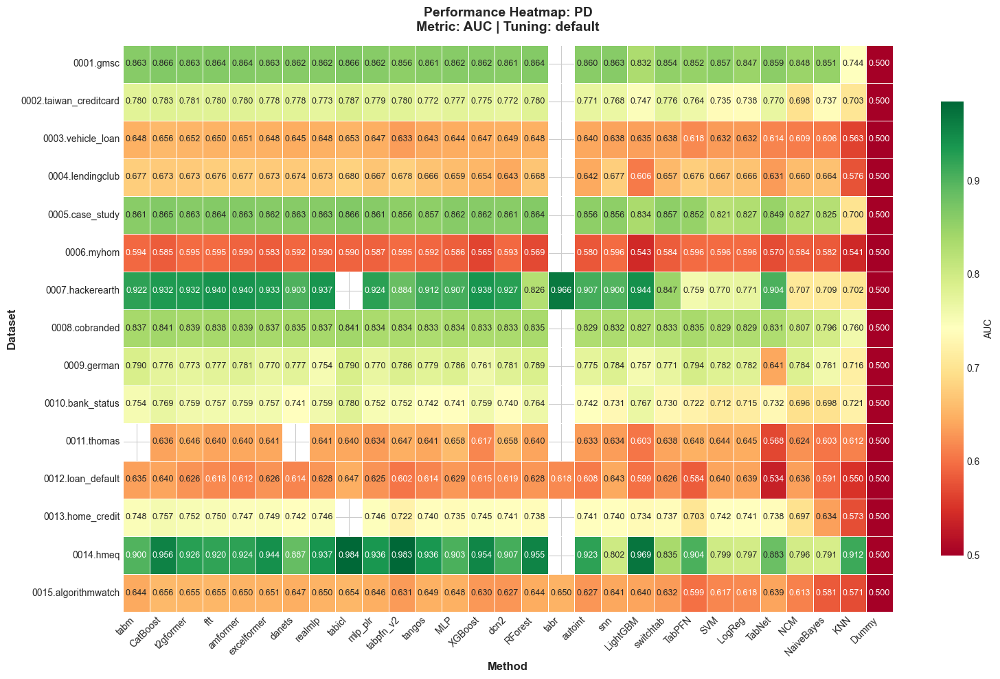

RANK HEATMAP
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


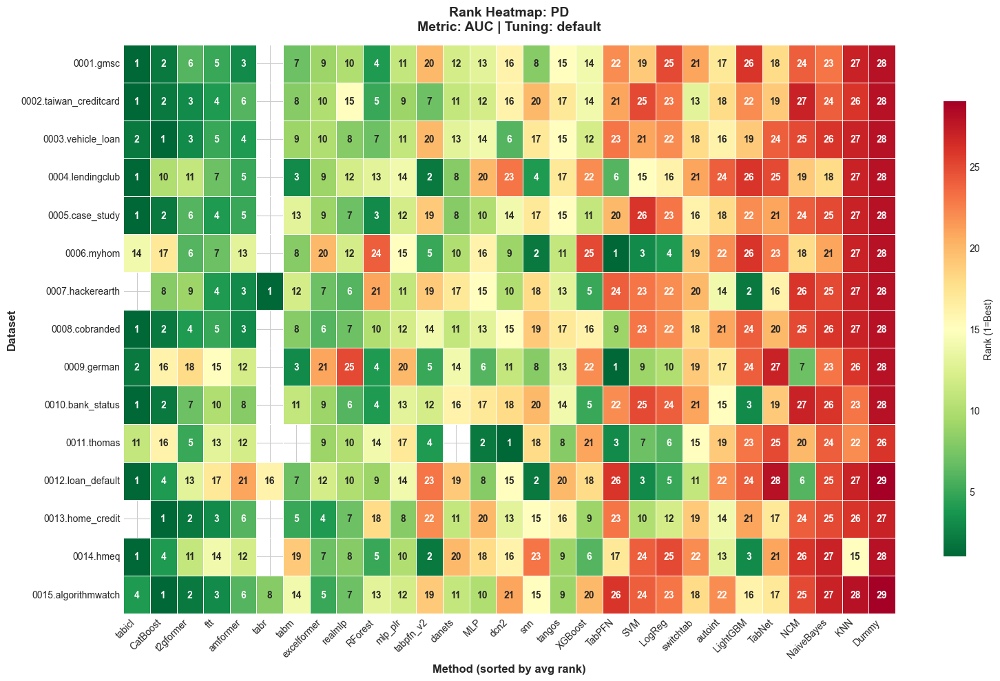

PERFORMANCE VIOLIN PLOTS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


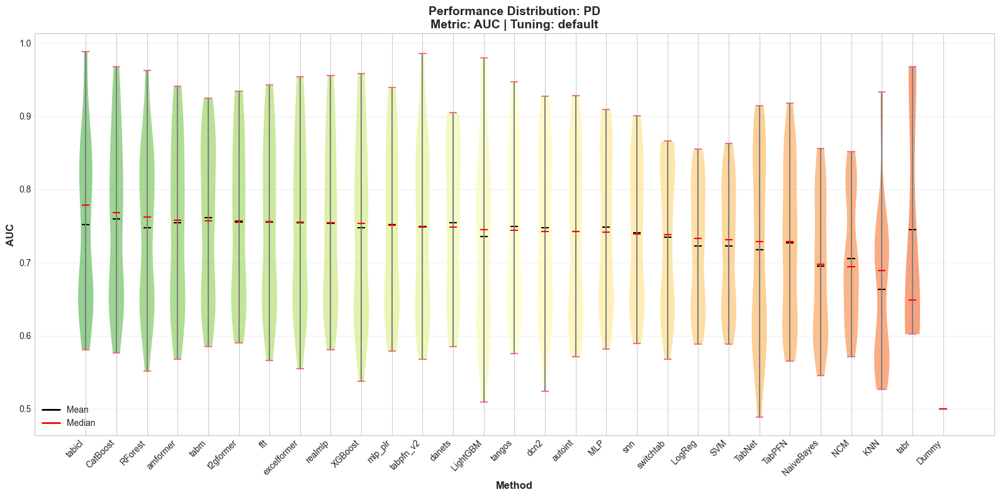

PERFORMANCE PROFILES
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


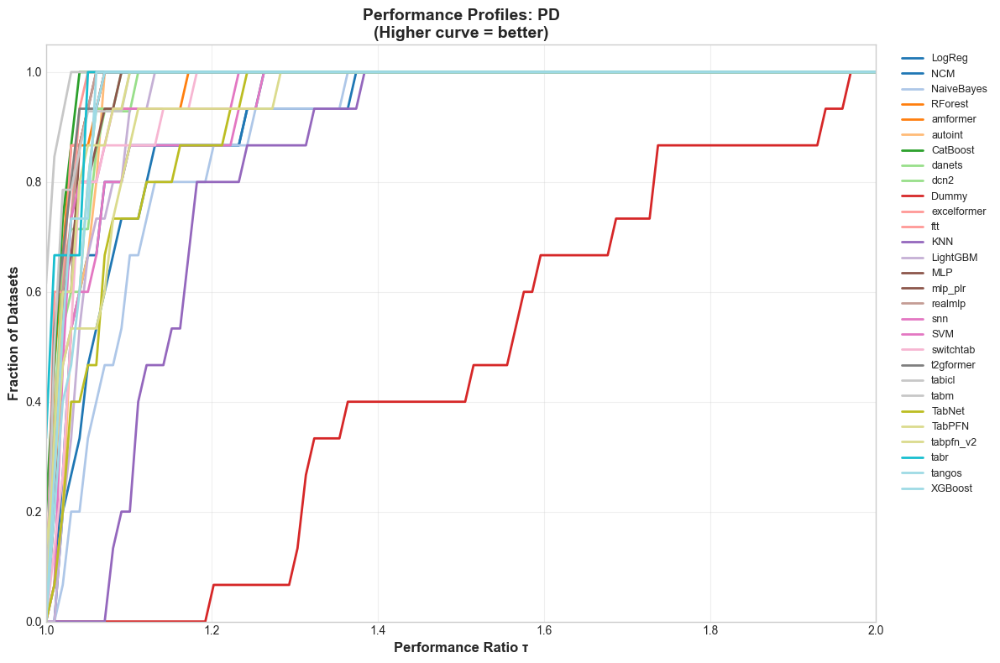

RADAR CHART - MULTI-METRIC COMPARISON


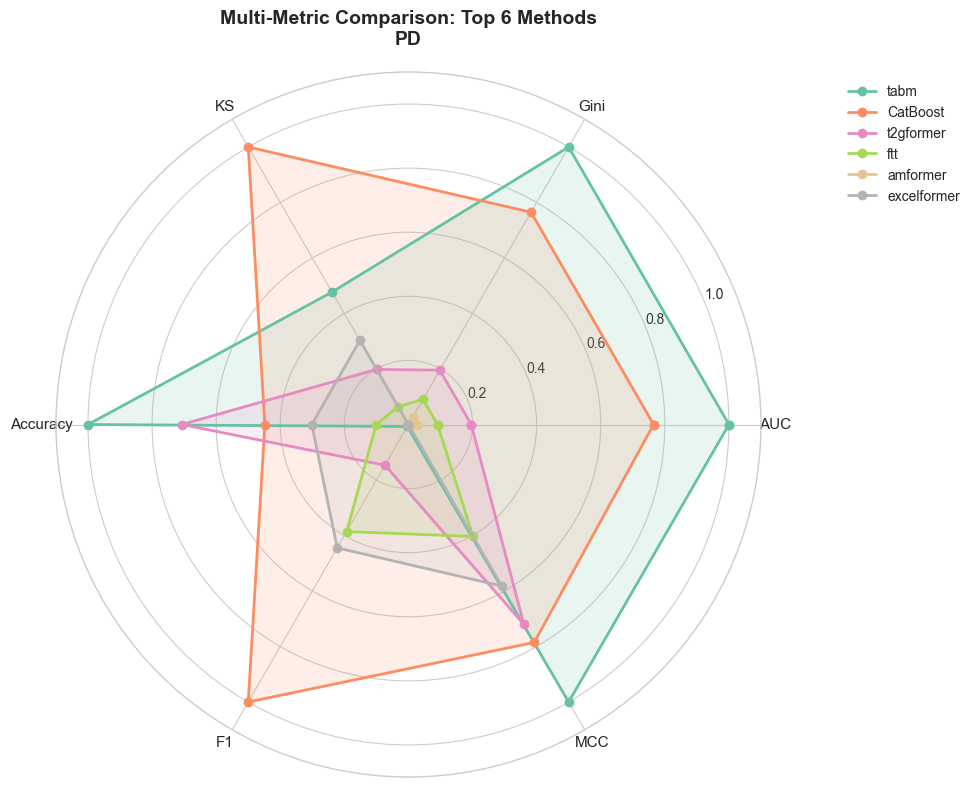

WIN/TIE/LOSS MATRIX
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


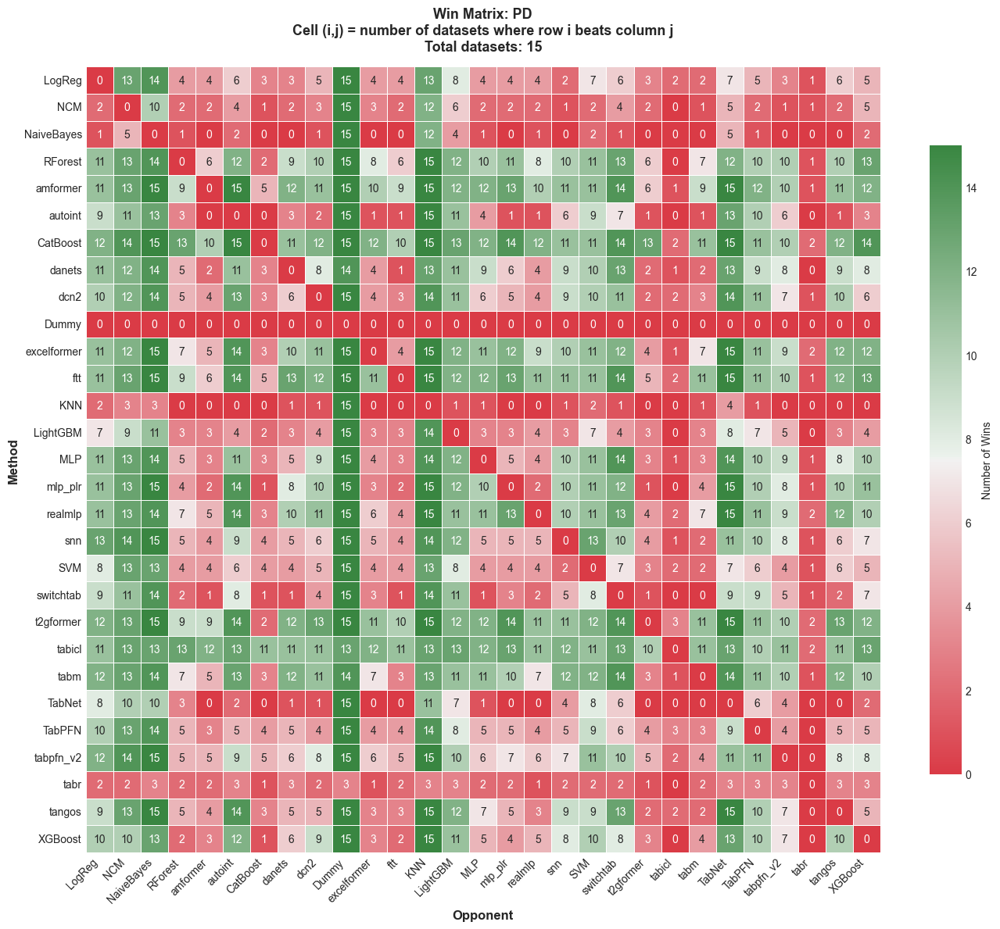

PERFORMANCE GAP TO BEST
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


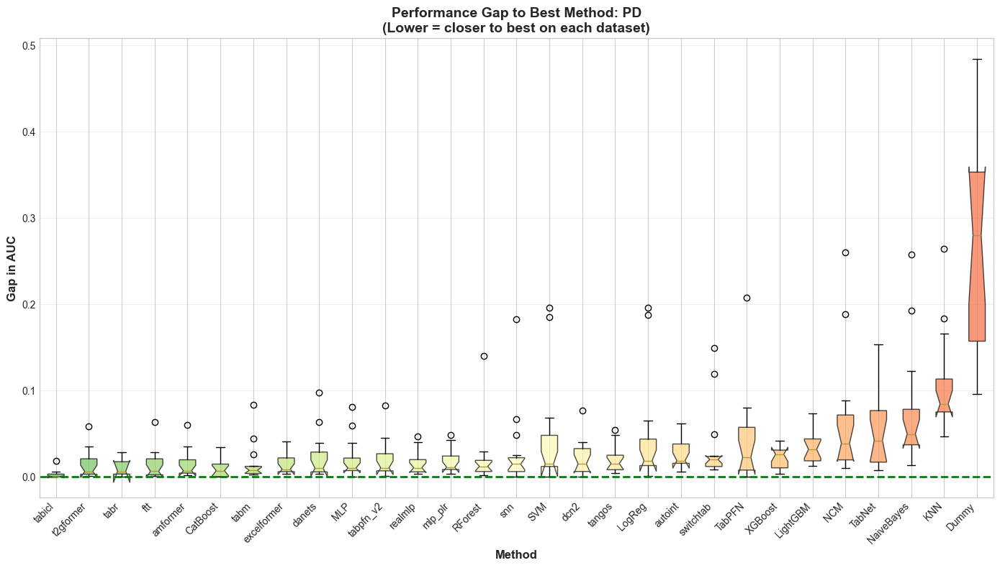

METHOD CORRELATION MATRIX
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


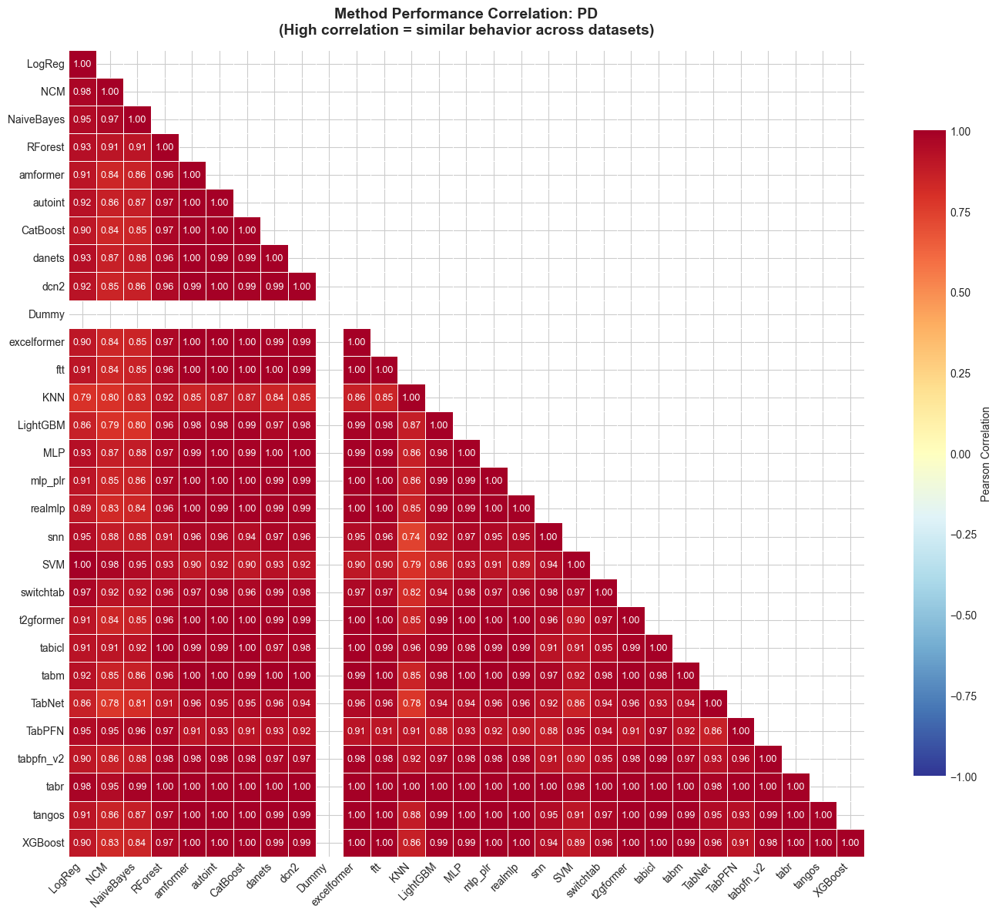

TRAINING TIME HEATMAP


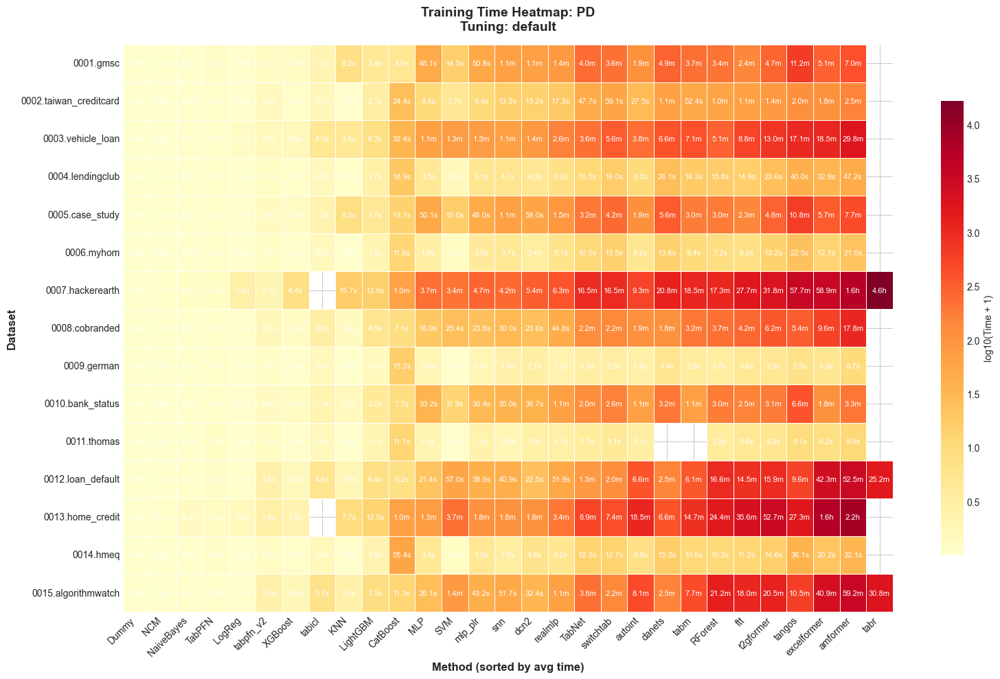

PARETO FRONTIER: PERFORMANCE VS TIME
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


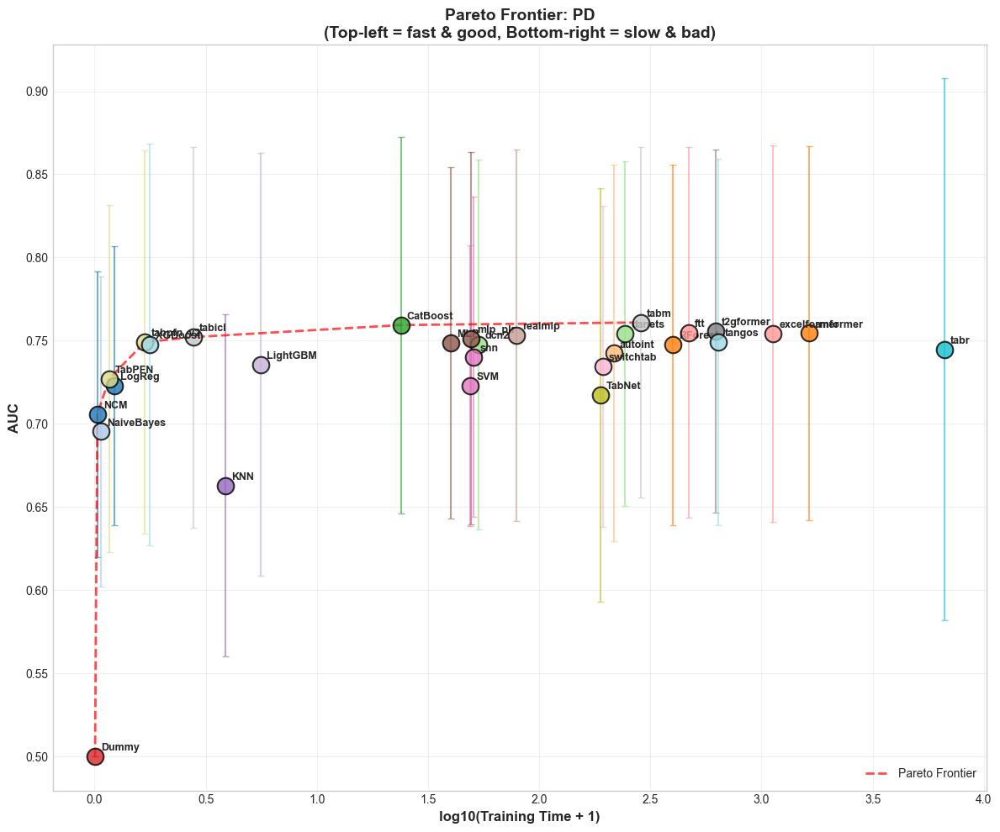

RANK DISTRIBUTION
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


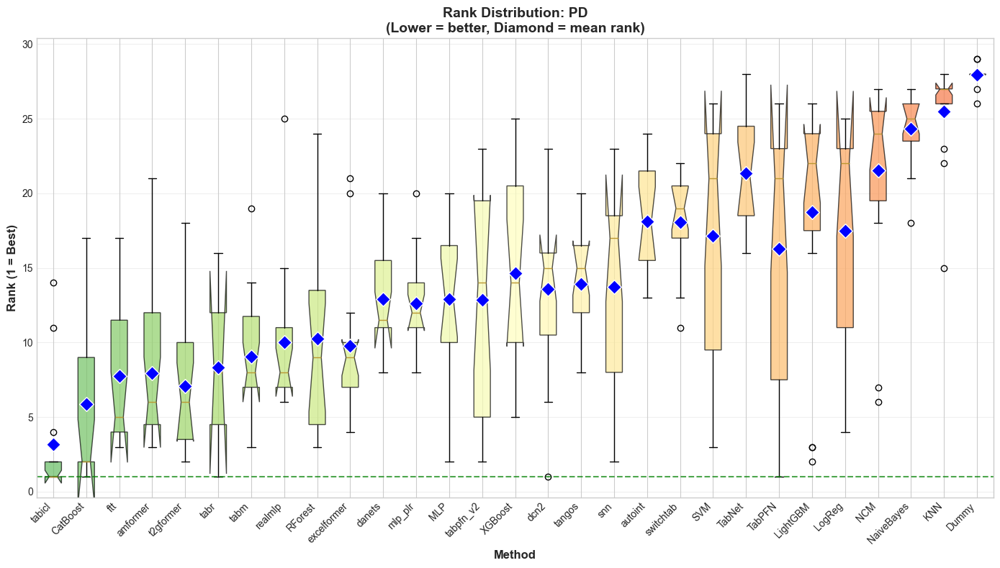

BUMP CHART - RANK PROGRESSION
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


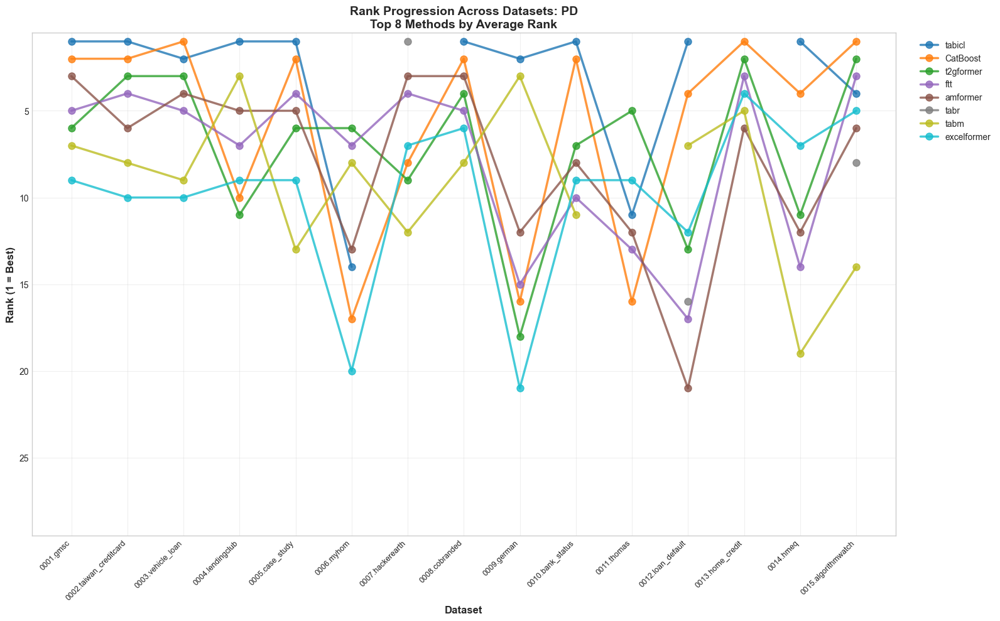

METHOD FAMILY COMPARISON
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


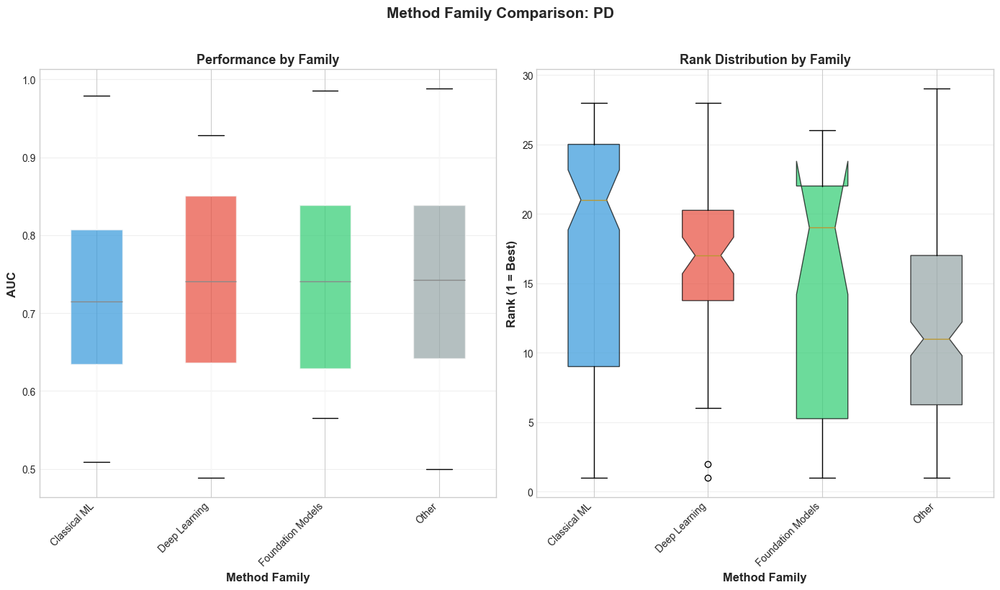

HPO BENEFIT HEATMAP


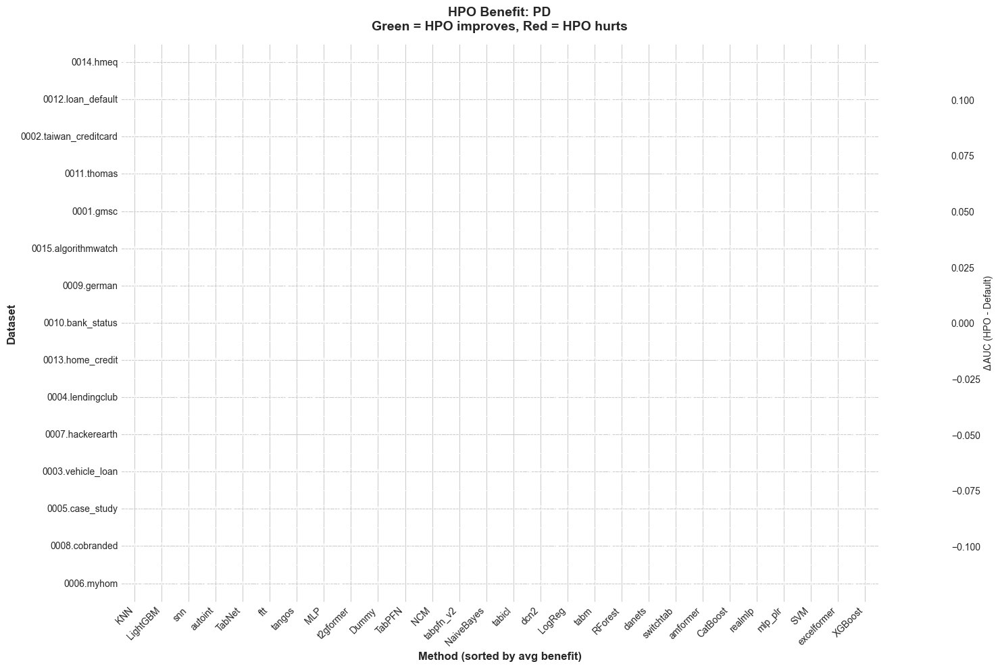


📊 HPO Benefit Summary:
--------------------------------------------------
   ✅ KNN                 : +0.0569
   ✅ LightGBM            : +0.0188
   ✅ snn                 : +0.0086
   ✅ autoint             : +0.0049
   ✅ TabNet              : +0.0036
   ✅ ftt                 : +0.0009
   ✅ tangos              : +0.0004
   ✅ MLP                 : +0.0003
   ✅ t2gformer           : +0.0001
   ❌ tabpfn_v2           : +0.0000
   ❌ NaiveBayes          : +0.0000
   ❌ tabicl              : +0.0000
   ❌ NCM                 : +0.0000
   ❌ TabPFN              : +0.0000
   ❌ Dummy               : +0.0000
   ❌ dcn2                : -0.0002
   ❌ LogReg              : -0.0006
   ❌ tabm                : -0.0006
   ❌ RForest             : -0.0010
   ❌ danets              : -0.0015
   ❌ switchtab           : -0.0019
   ❌ amformer            : -0.0020
   ❌ CatBoost            : -0.0023
   ❌ realmlp             : -0.0030
   ❌ mlp_plr             : -0.0053
   ❌ SVM                 : -0.0062
   ❌ excelforme

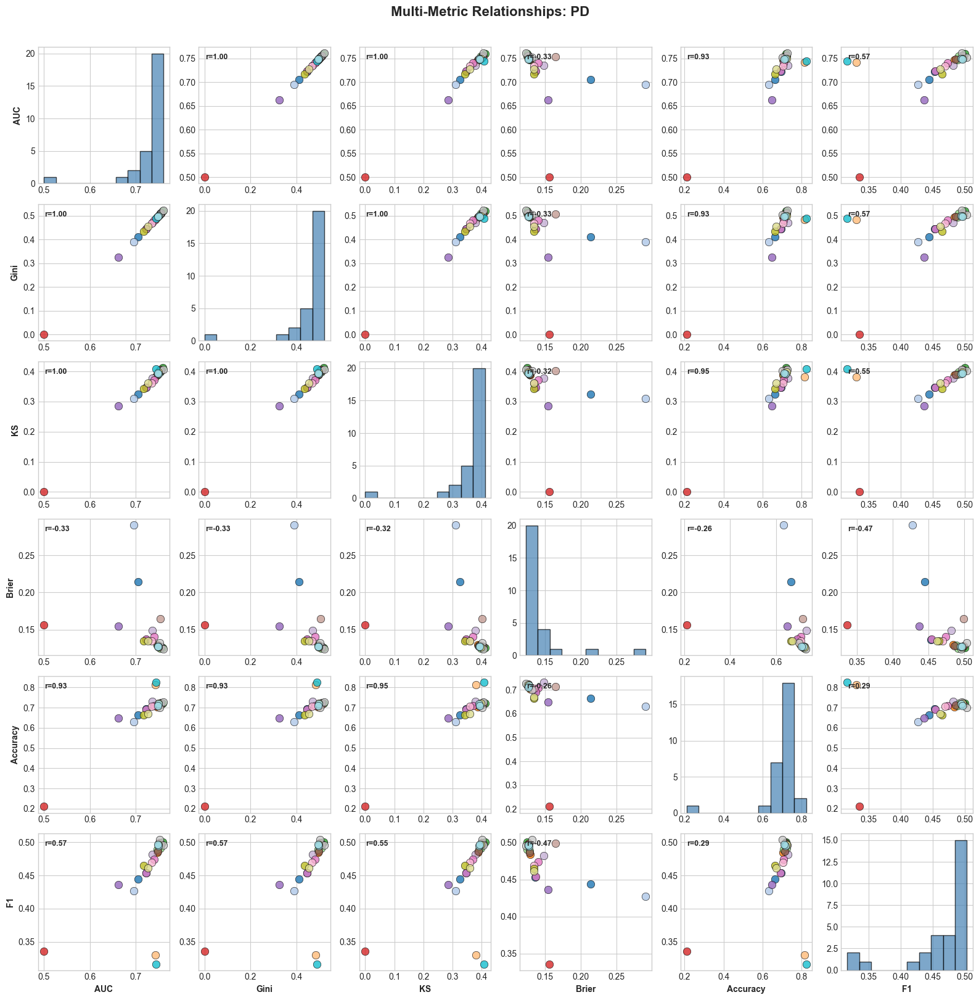

PERFORMANCE STABILITY (MEAN VS STD)
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


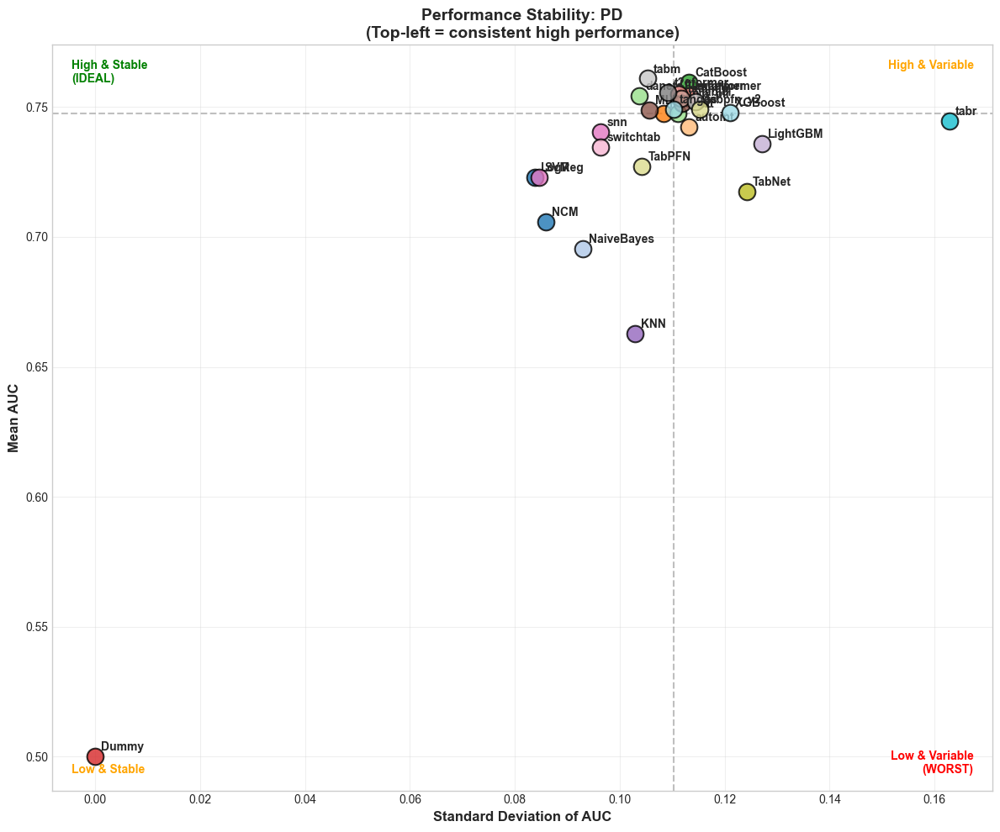

FOLD VARIANCE ANALYSIS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


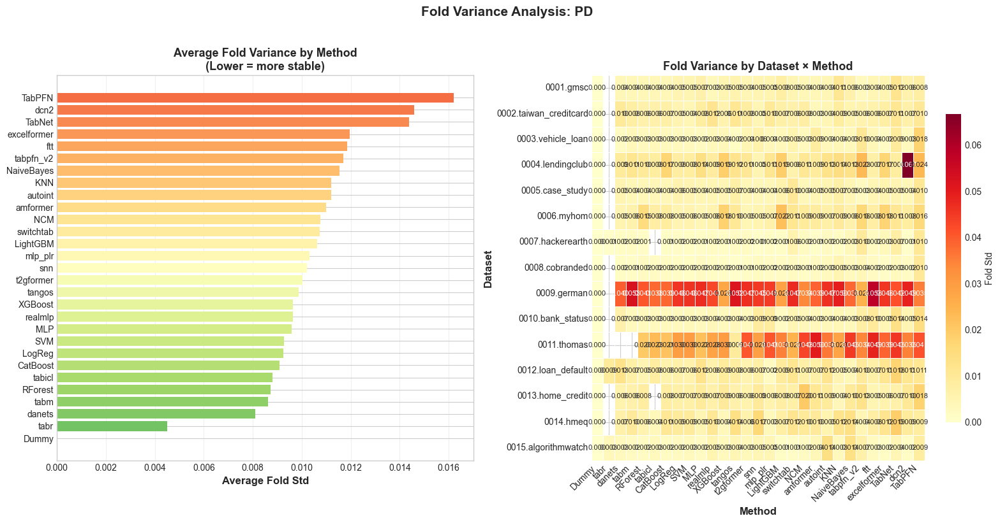

TOP-K FREQUENCY ANALYSIS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


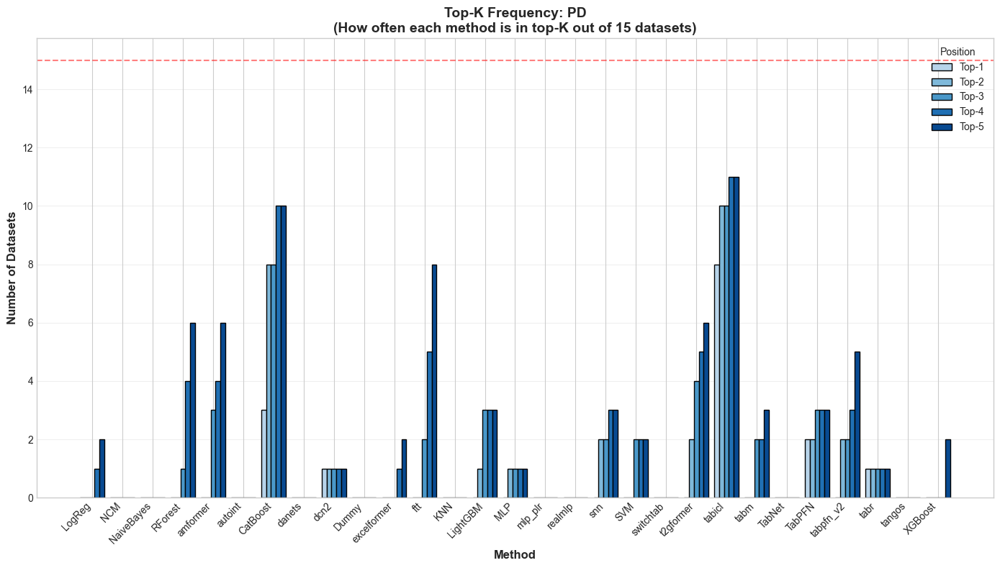

DATASET DIFFICULTY ANALYSIS
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


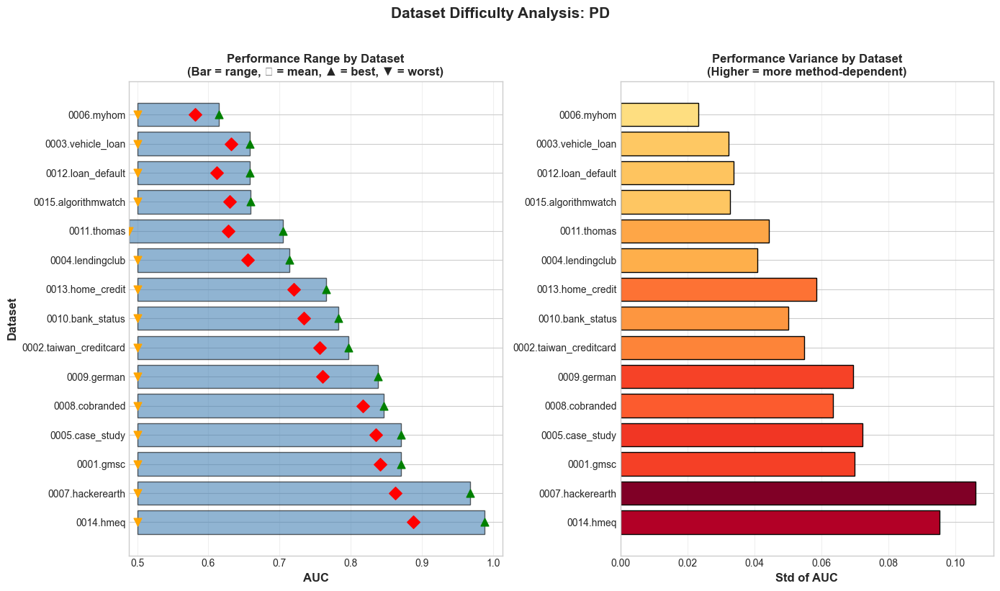

CUMULATIVE WINS PLOT
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


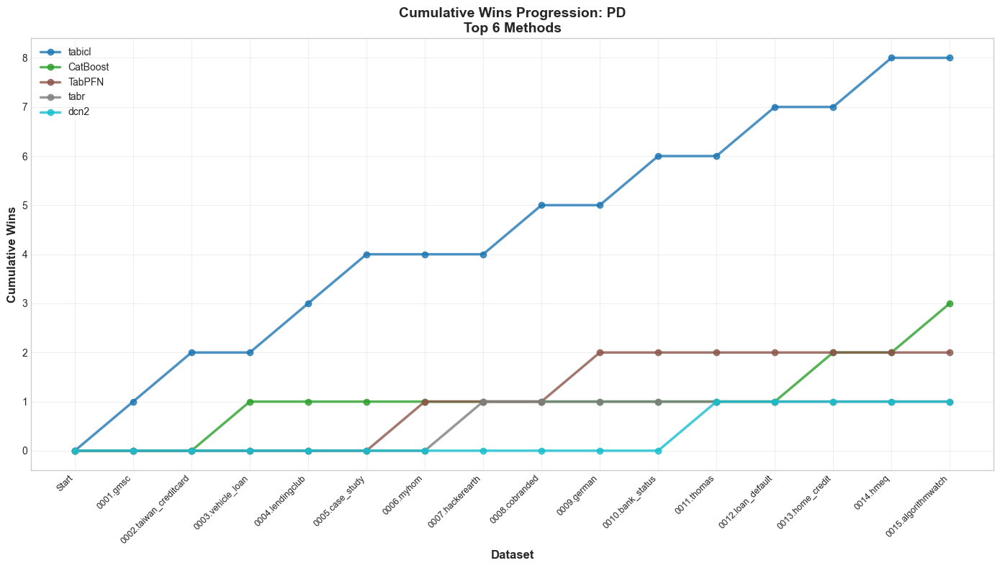

METHOD SIMILARITY DENDROGRAM
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


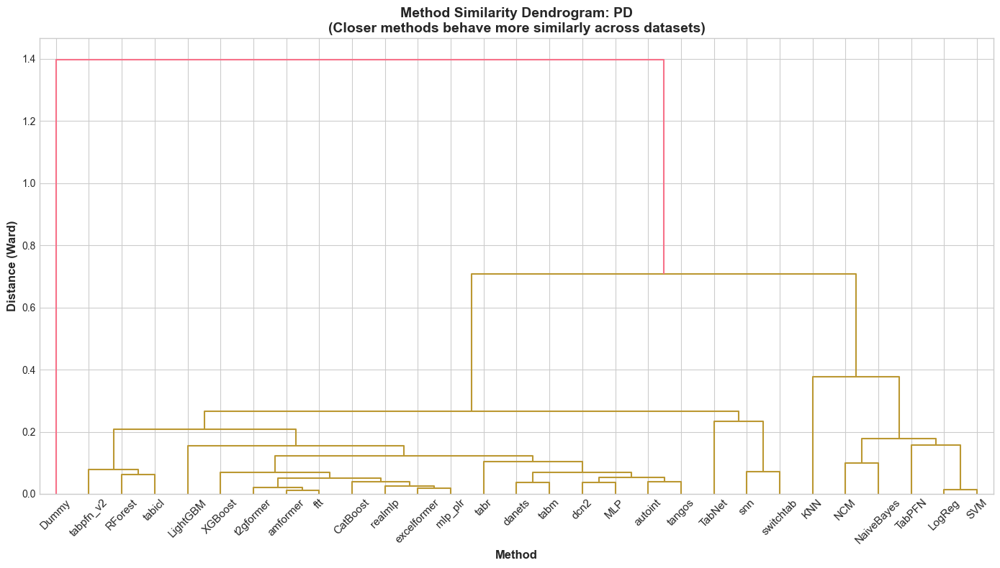

WINNER DISTRIBUTION
📊 Filtered data for task: PD
📊 Filtered data for tuning strategy: default
   Prepared 2095 data points for analysis
   Models: ['LogReg', 'NCM', 'NaiveBayes', 'RandomForest', 'amformer', 'autoint', 'catboost', 'danets', 'dcn2', 'dummy', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'realmlp', 'snn', 'svm', 'switchtab', 't2gformer', 'tabicl', 'tabm', 'tabnet', 'tabpfn', 'tabpfn_v2', 'tabr', 'tangos', 'xgboost']


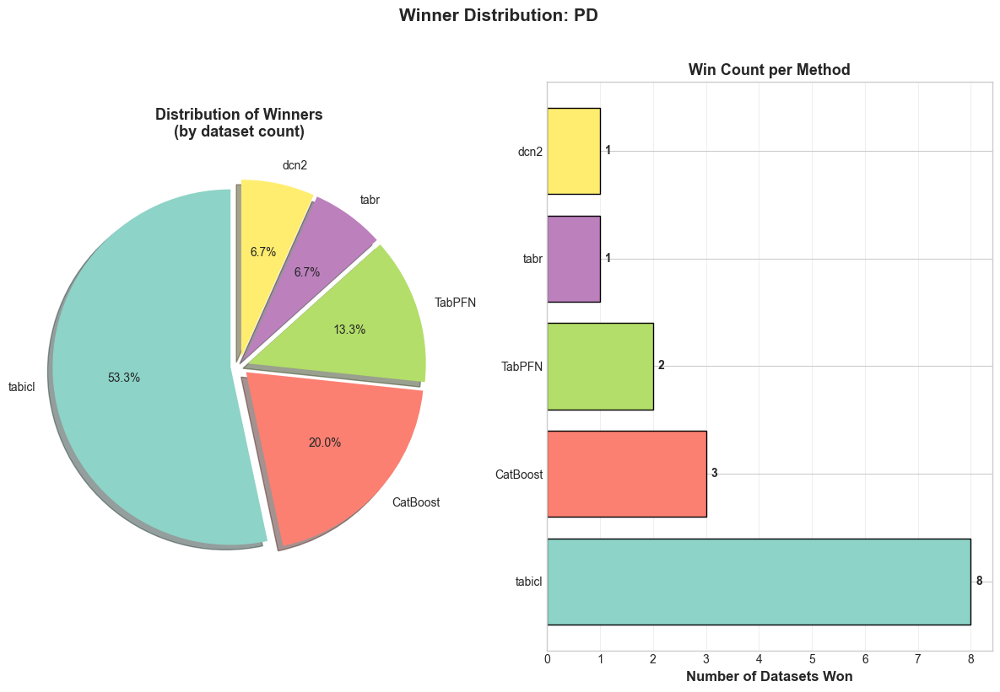


✅ ALL 22 VISUALIZATIONS COMPLETE!


In [22]:
# =============================================================================
# RUN ALL VISUALIZATIONS - PD TASK
# =============================================================================

if not UNIFIED_DF.empty:
    task = 'pd'
    tuning = 'default'
    
    print("🎨 " + "=" * 76)
    print("🎨 RUNNING ALL VISUALIZATIONS FOR PD TASK")
    print("🎨 " + "=" * 76)
    
    # 1. Performance Heatmap
    plot_performance_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 2. Rank Heatmap
    plot_rank_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 3. Violin Plots
    plot_performance_violins(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 4. Performance Profiles
    plot_performance_profiles(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 5. Radar Chart
    plot_radar_chart(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=6)
    
    # 6. Win/Tie/Loss Matrix
    plot_win_tie_loss_matrix(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 7. Gap to Best
    plot_gap_to_best(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 8. Method Correlation
    plot_method_correlation(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 9. Time Heatmap
    plot_time_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 10. Pareto Frontier
    plot_pareto_frontier(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 11. Rank Distribution
    plot_rank_distribution(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 12. Bump Chart
    plot_bump_chart(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=8)
    
    # 13. Method Family Comparison
    plot_method_family_comparison(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 14. HPO Benefit Heatmap
    plot_hpo_benefit_heatmap(UNIFIED_DF, task_filter=task)
    
    # 15. Multi-Metric Scatter
    plot_multi_metric_scatter(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 16. Performance Stability
    plot_performance_stability(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 17. Fold Variance
    plot_fold_variance(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 18. Top-K Frequency
    plot_topk_frequency(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, max_k=5)
    
    # 19. Dataset Difficulty
    plot_dataset_difficulty(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 20. Cumulative Wins
    plot_cumulative_wins(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=6)
    
    # 21. Method Dendrogram
    plot_method_dendrogram(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    # 22. Winner Distribution
    plot_winner_distribution(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    print("\n✅ ALL 22 VISUALIZATIONS COMPLETE!")

else:
    print("❌ No data loaded")

🎨 ============================================================================
🎨 RUNNING ALL VISUALIZATIONS FOR LGD TASK
🎨 ============================================================================
PERFORMANCE HEATMAP
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


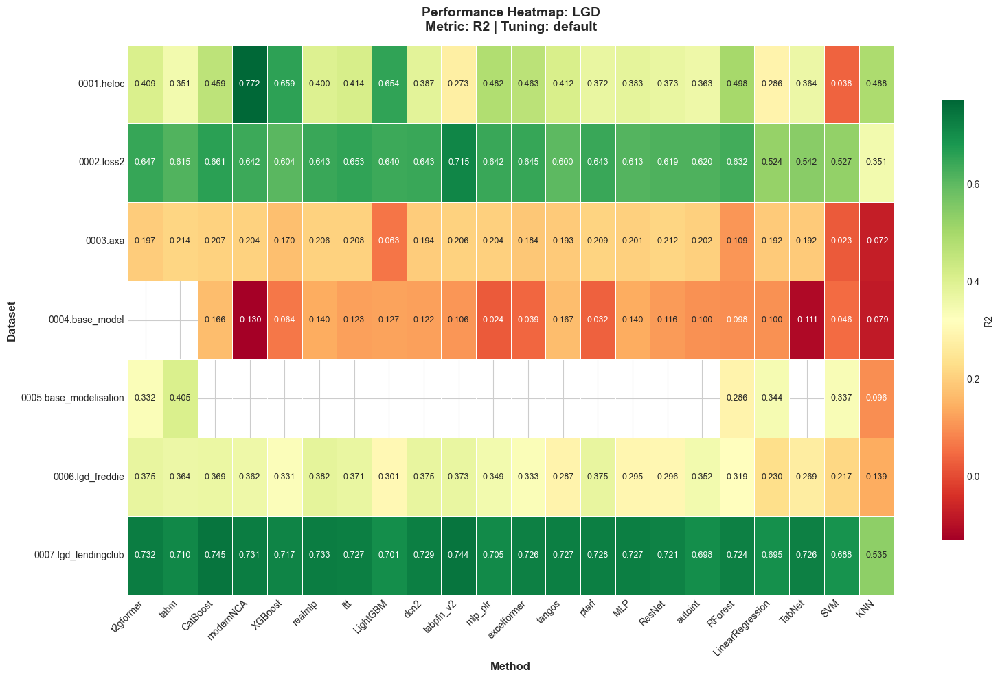

RANK HEATMAP
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


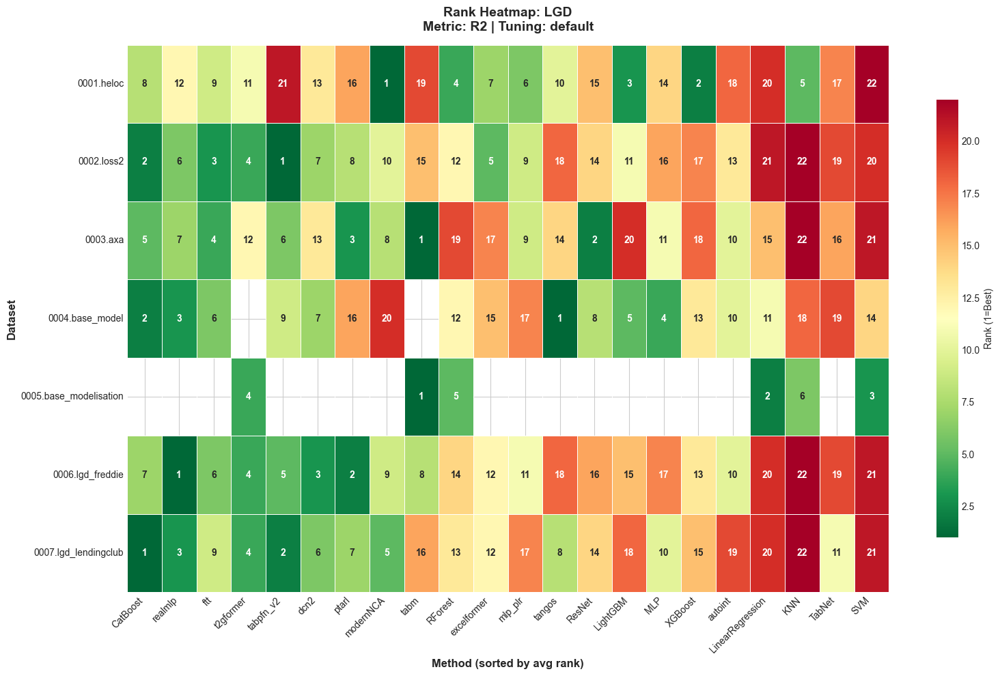

PERFORMANCE VIOLIN PLOTS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


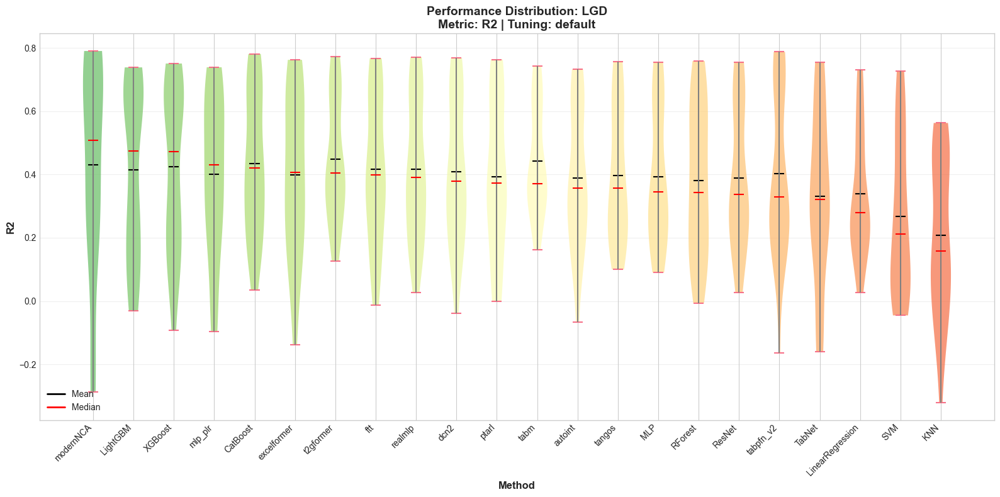

PERFORMANCE PROFILES
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


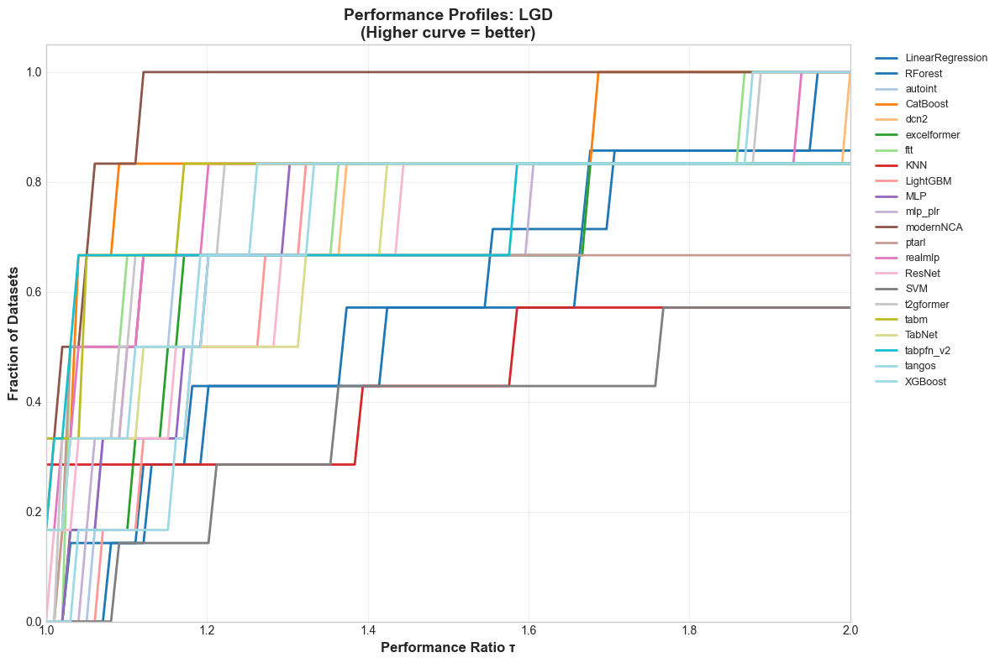

RADAR CHART - MULTI-METRIC COMPARISON


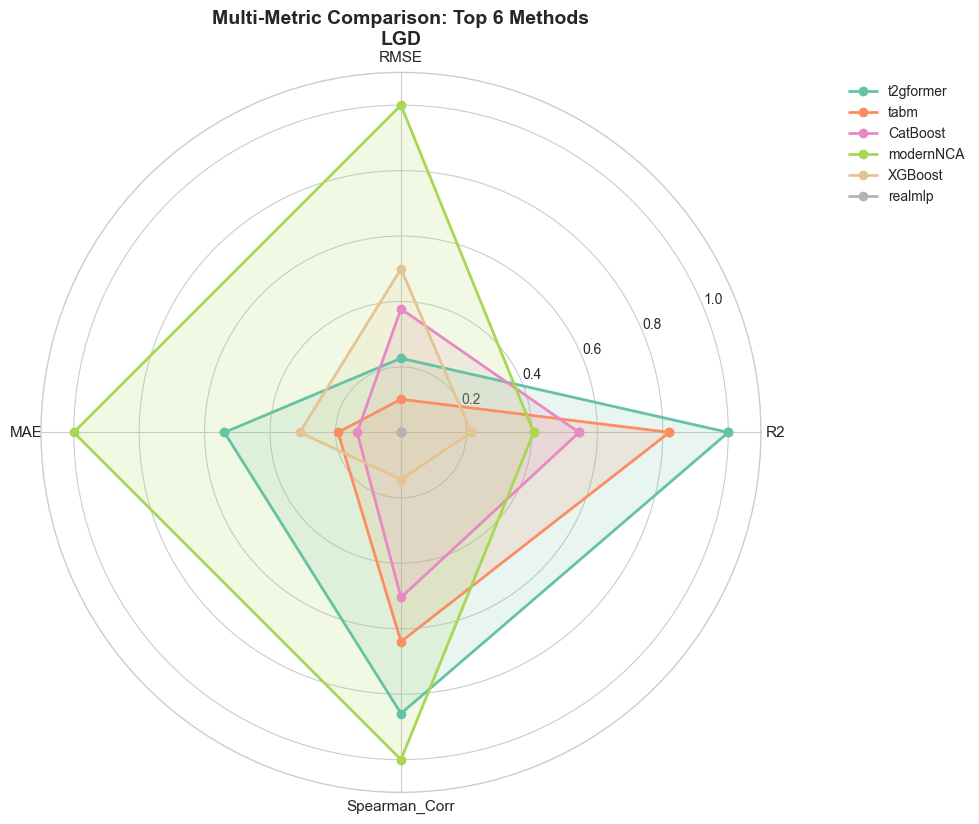

WIN/TIE/LOSS MATRIX
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


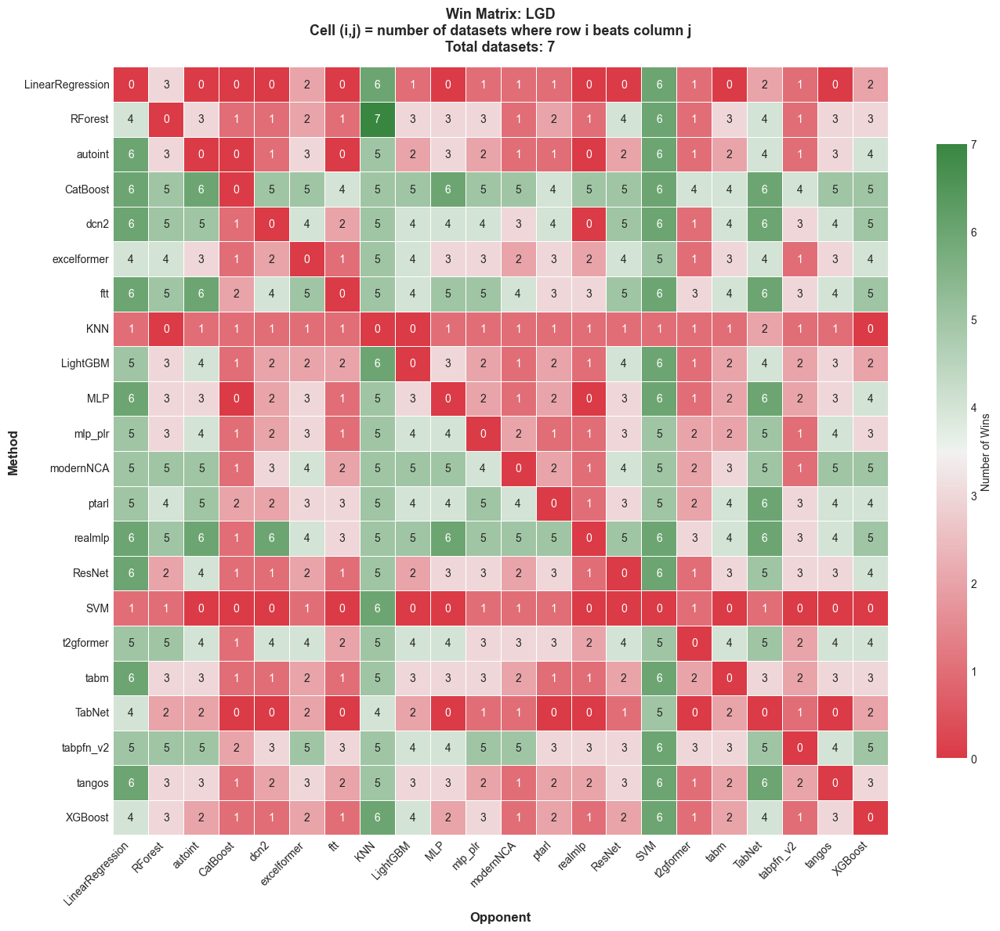

PERFORMANCE GAP TO BEST
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


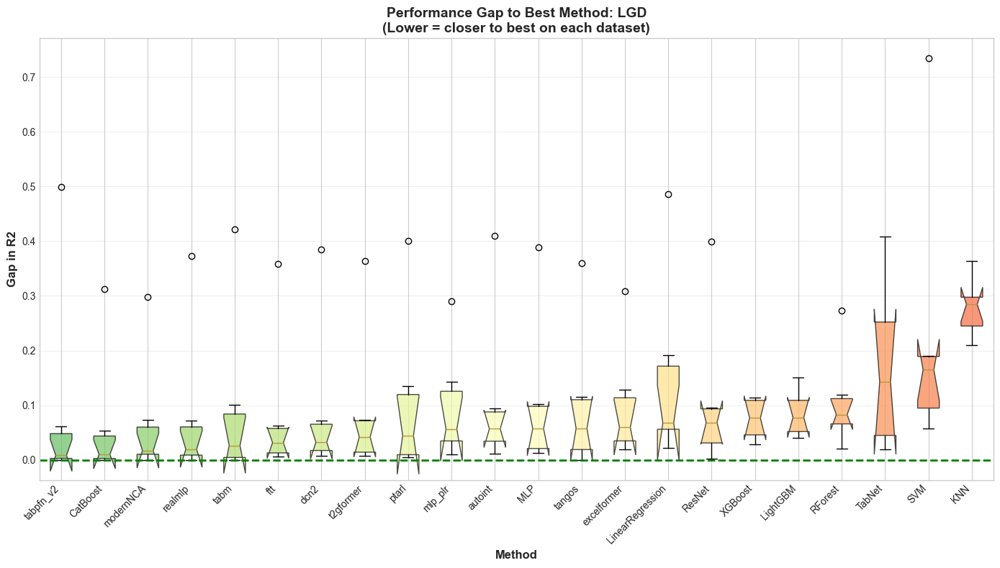

METHOD CORRELATION MATRIX
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


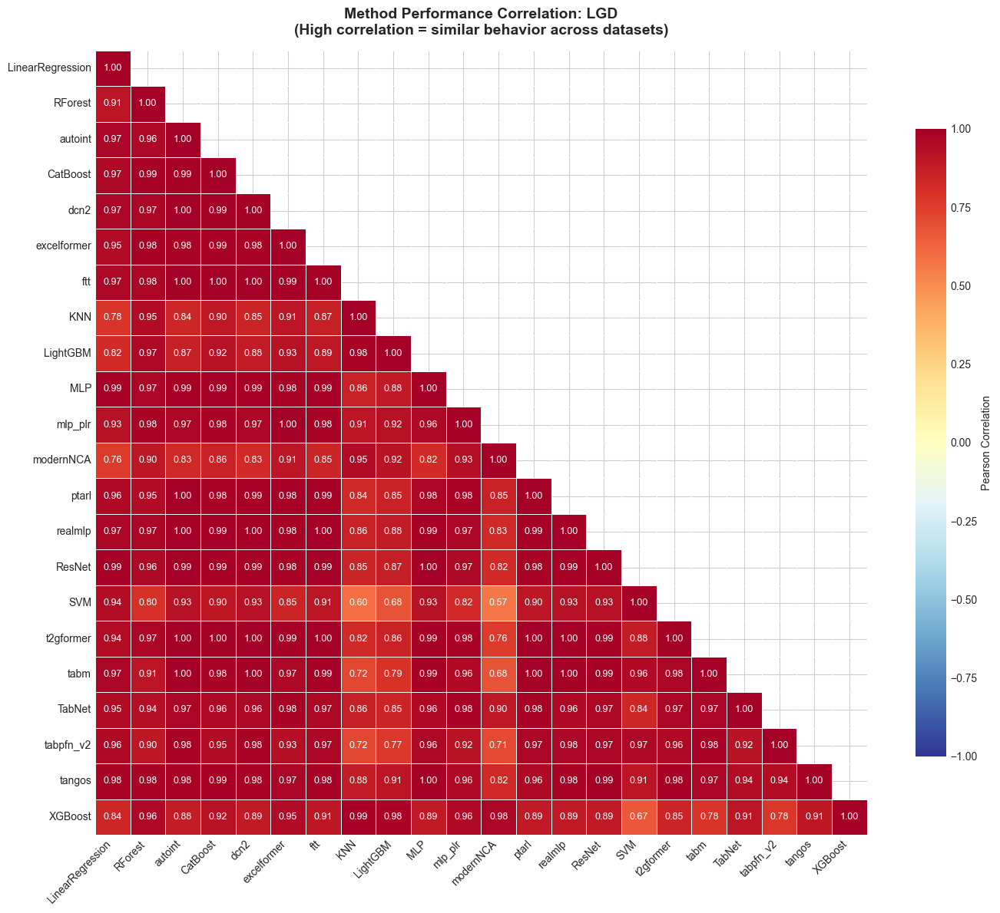

TRAINING TIME HEATMAP


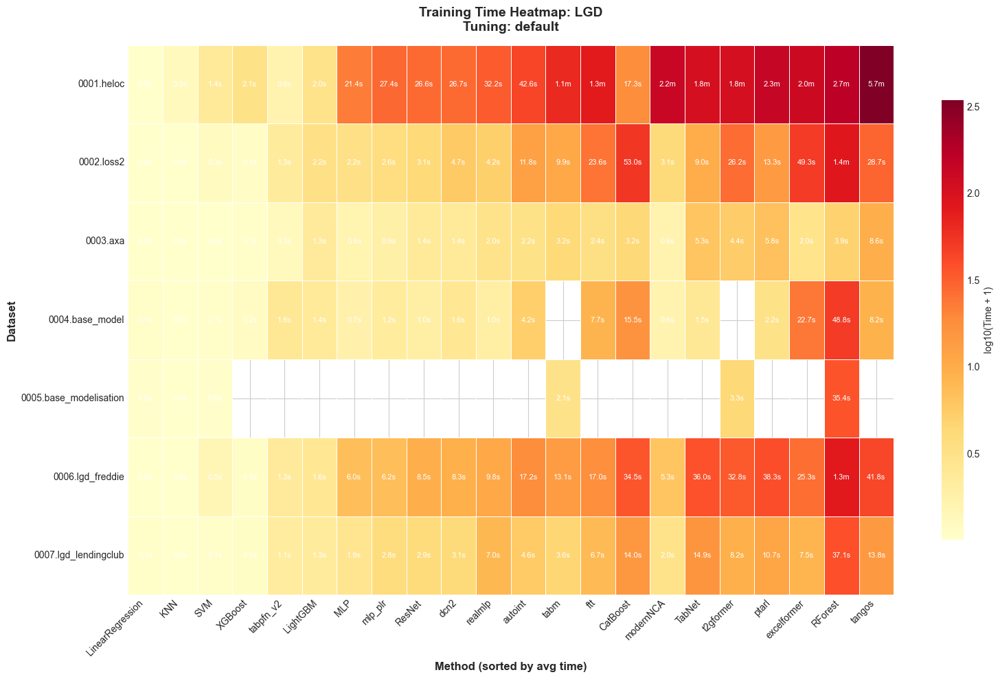

PARETO FRONTIER: PERFORMANCE VS TIME
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


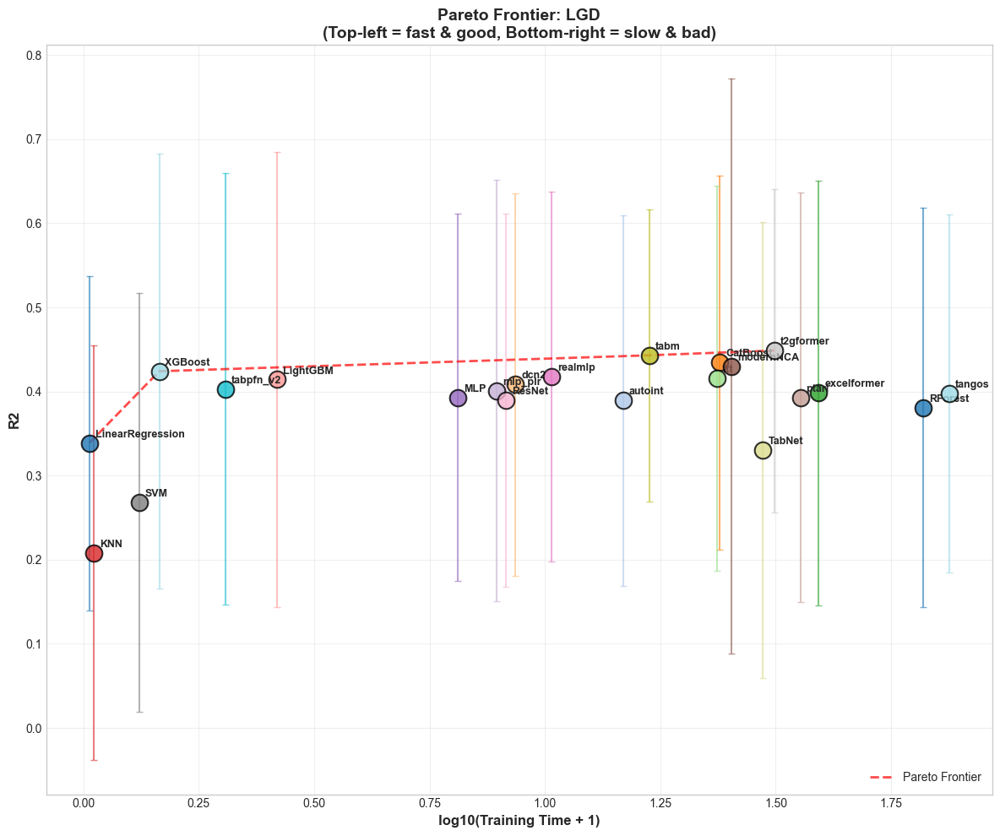

RANK DISTRIBUTION
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


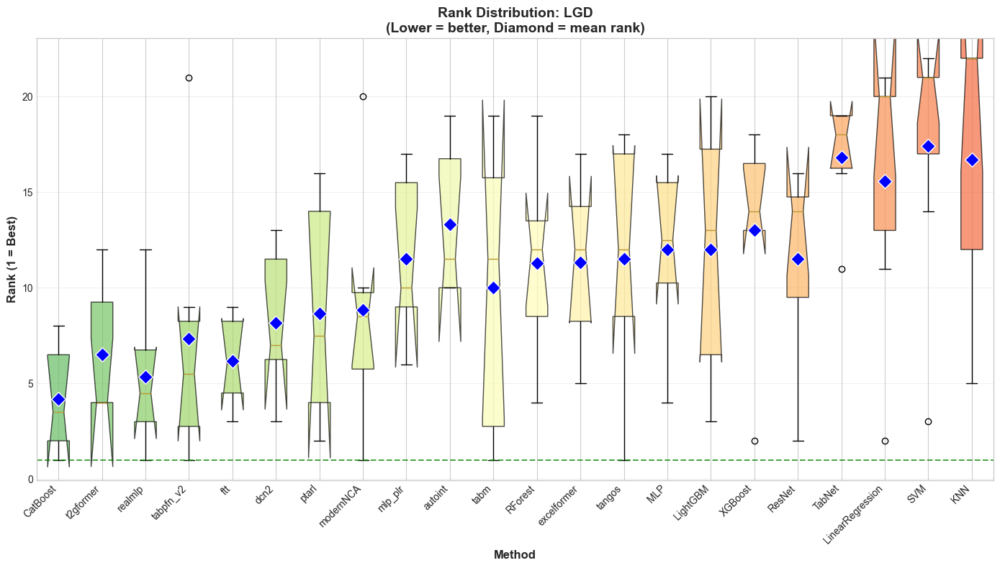

BUMP CHART - RANK PROGRESSION
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


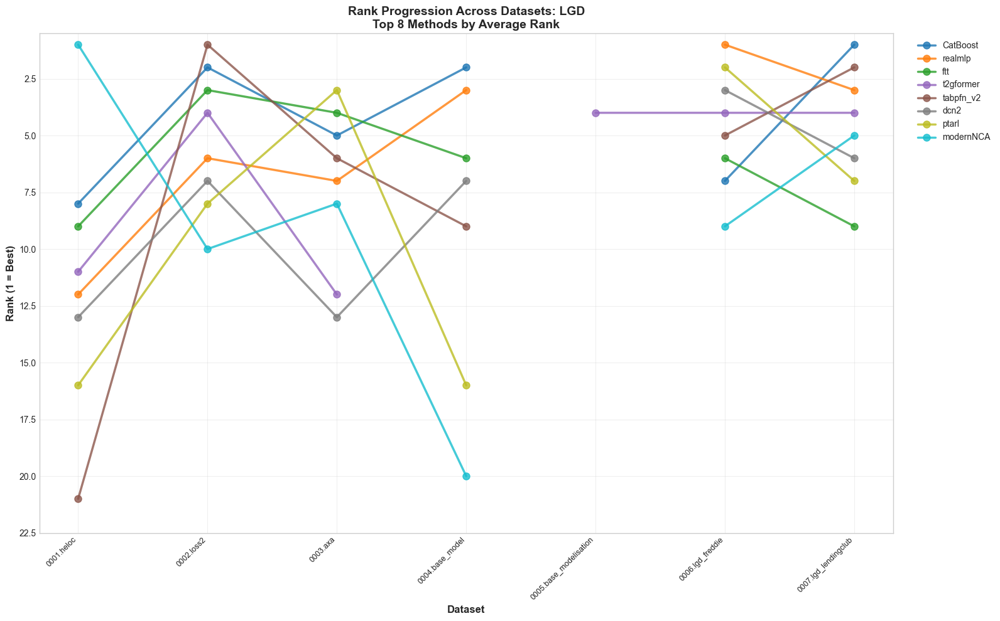

METHOD FAMILY COMPARISON
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


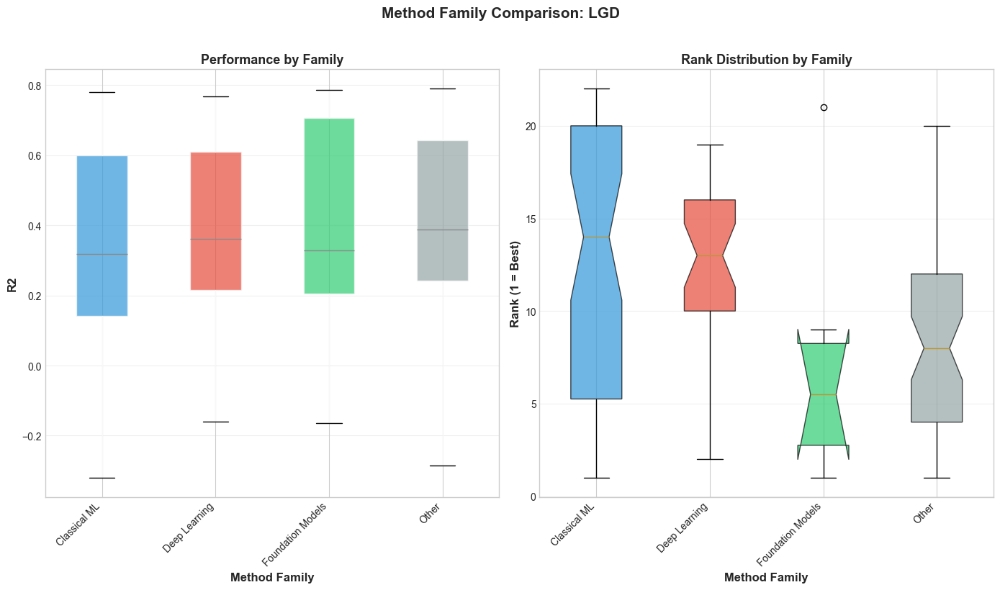

HPO BENEFIT HEATMAP


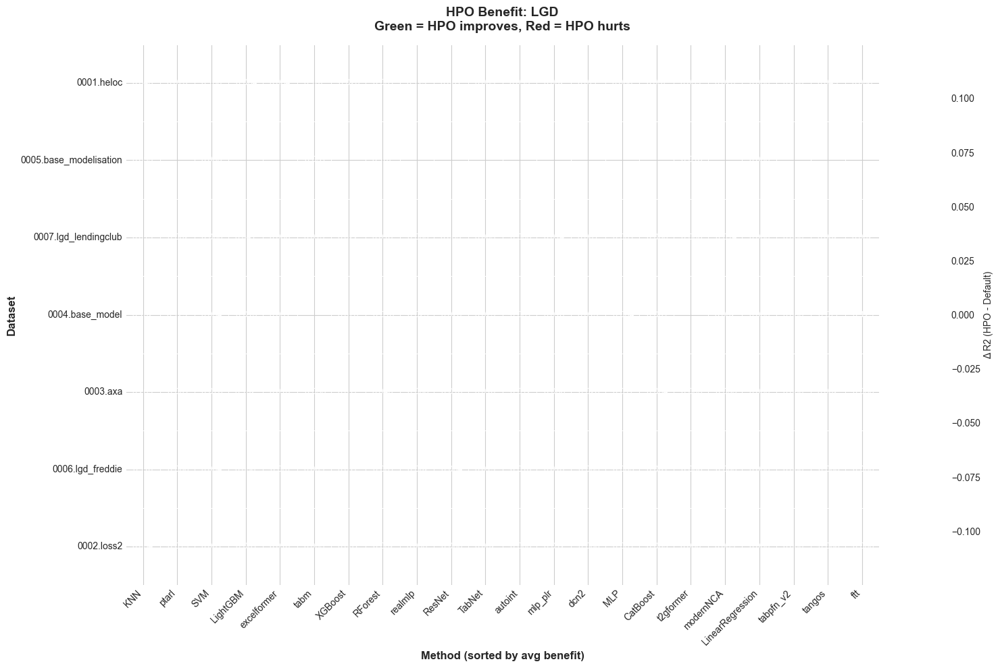


📊 HPO Benefit Summary:
--------------------------------------------------
   ✅ KNN                 : +0.1038
   ✅ ptarl               : +0.0291
   ✅ SVM                 : +0.0261
   ✅ LightGBM            : +0.0252
   ✅ excelformer         : +0.0245
   ✅ tabm                : +0.0235
   ✅ XGBoost             : +0.0228
   ✅ RForest             : +0.0224
   ✅ realmlp             : +0.0139
   ✅ ResNet              : +0.0123
   ✅ TabNet              : +0.0116
   ✅ autoint             : +0.0113
   ✅ mlp_plr             : +0.0098
   ✅ dcn2                : +0.0091
   ✅ MLP                 : +0.0087
   ✅ CatBoost            : +0.0077
   ✅ t2gformer           : +0.0049
   ✅ modernNCA           : +0.0023
   ❌ LinearRegression    : +0.0000
   ❌ tabpfn_v2           : +0.0000
   ❌ tangos              : -0.0056
   ❌ ftt                 : -0.0151
MULTI-METRIC SCATTER MATRIX


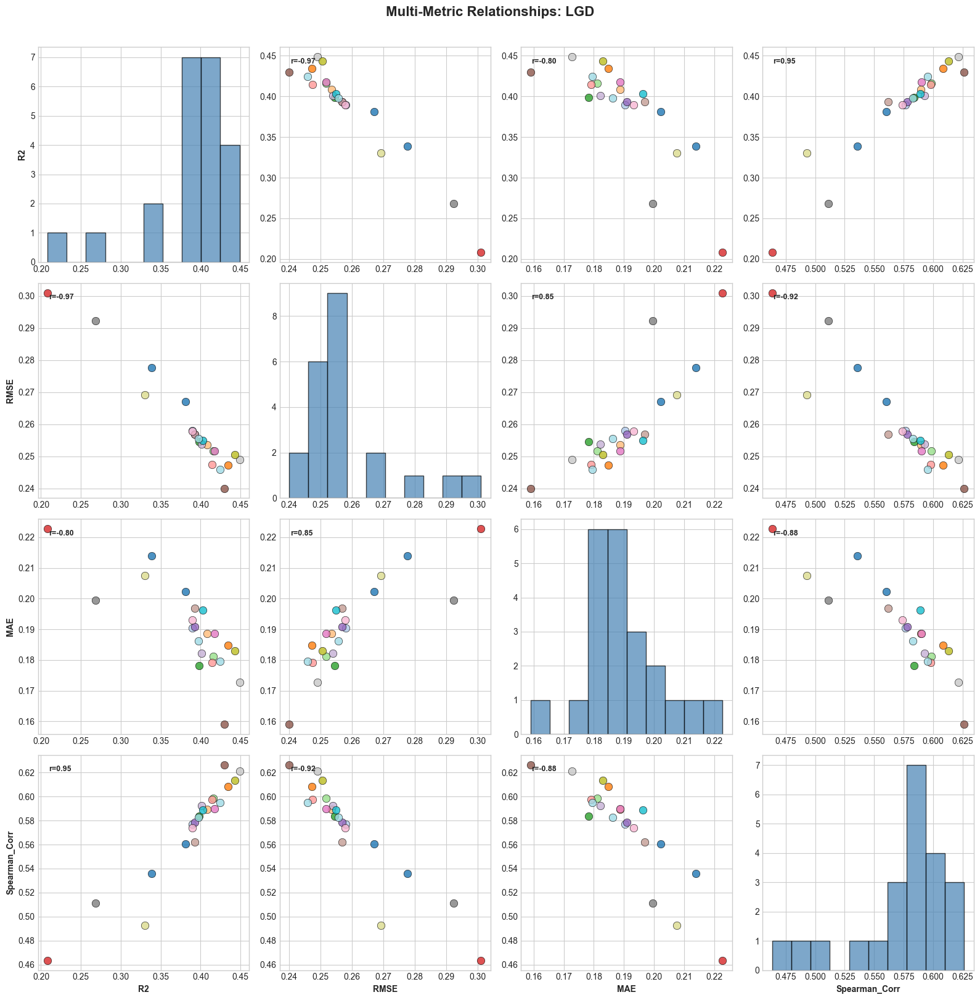

PERFORMANCE STABILITY (MEAN VS STD)
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


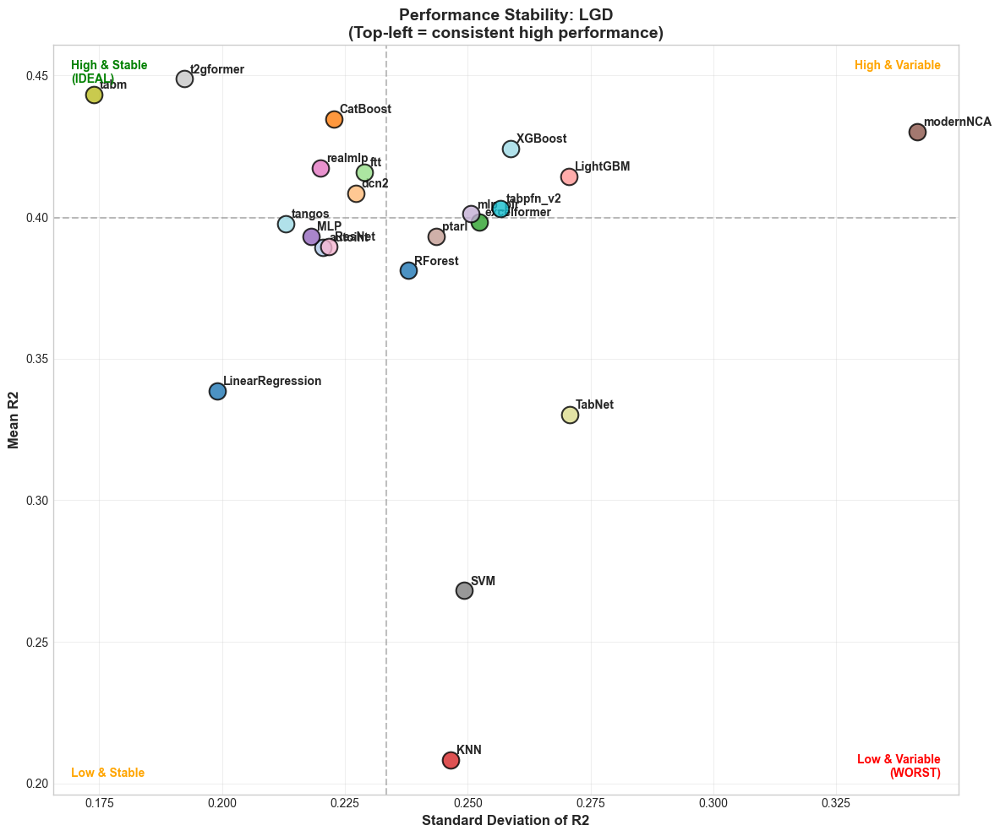

FOLD VARIANCE ANALYSIS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


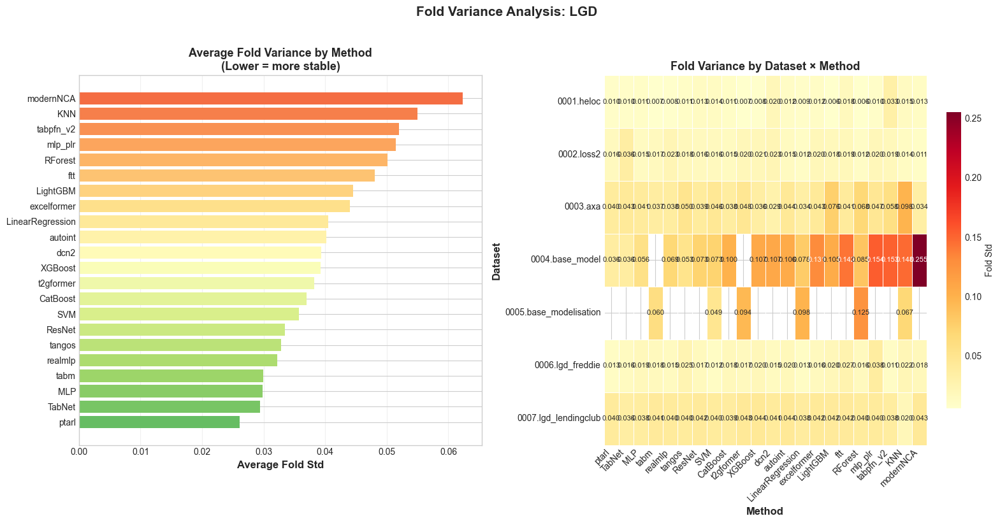

TOP-K FREQUENCY ANALYSIS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


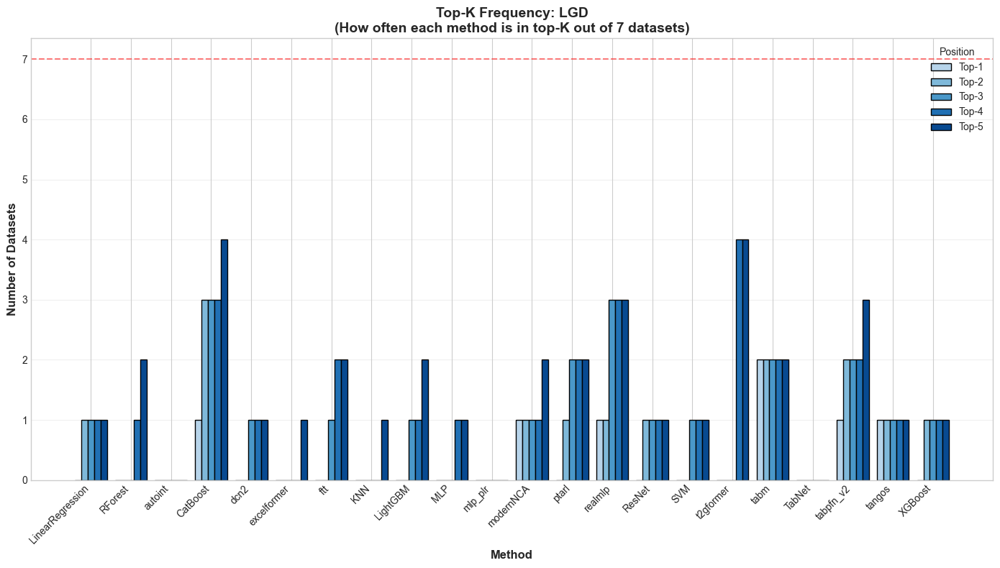

DATASET DIFFICULTY ANALYSIS
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


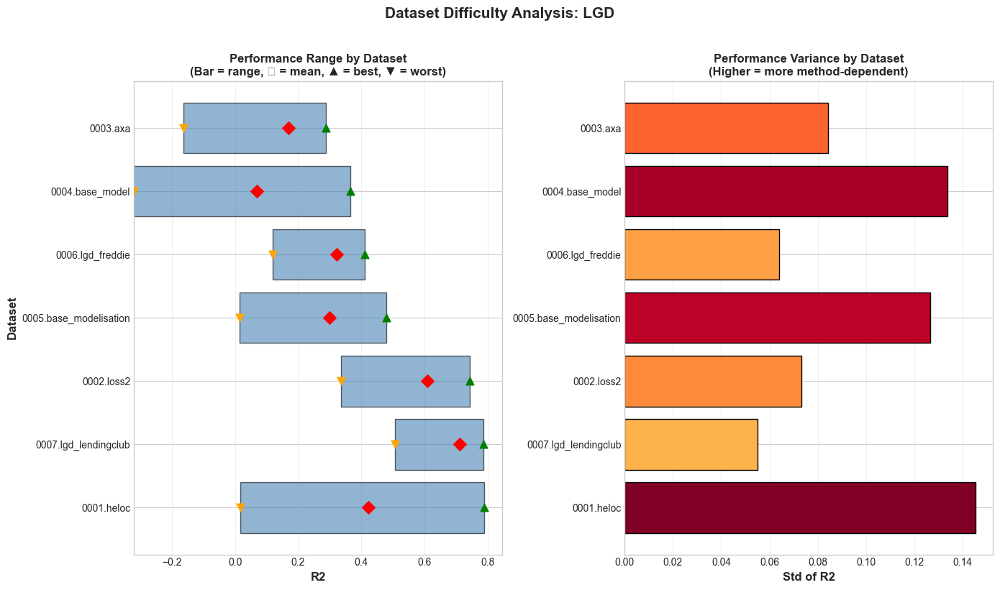

CUMULATIVE WINS PLOT
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


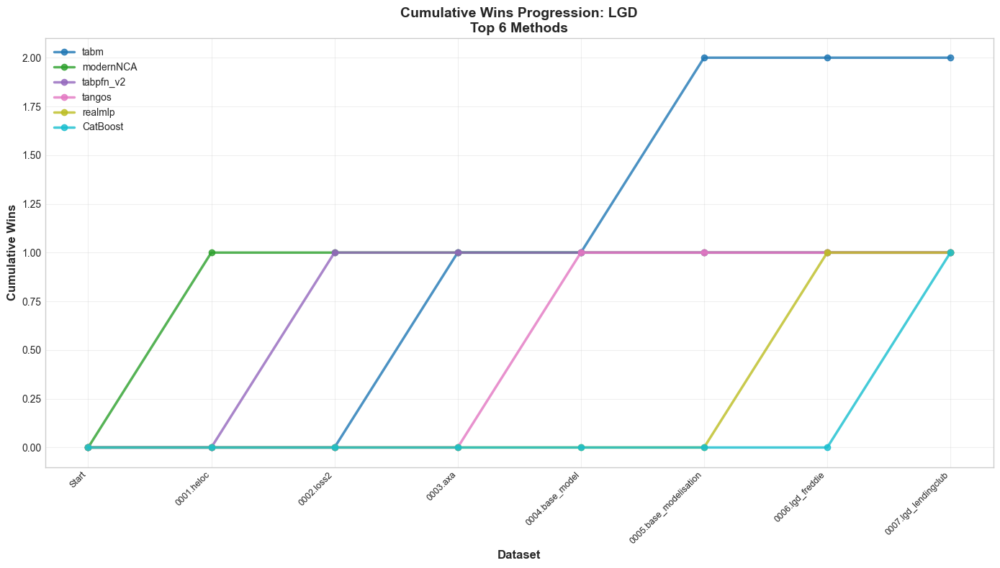

METHOD SIMILARITY DENDROGRAM
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


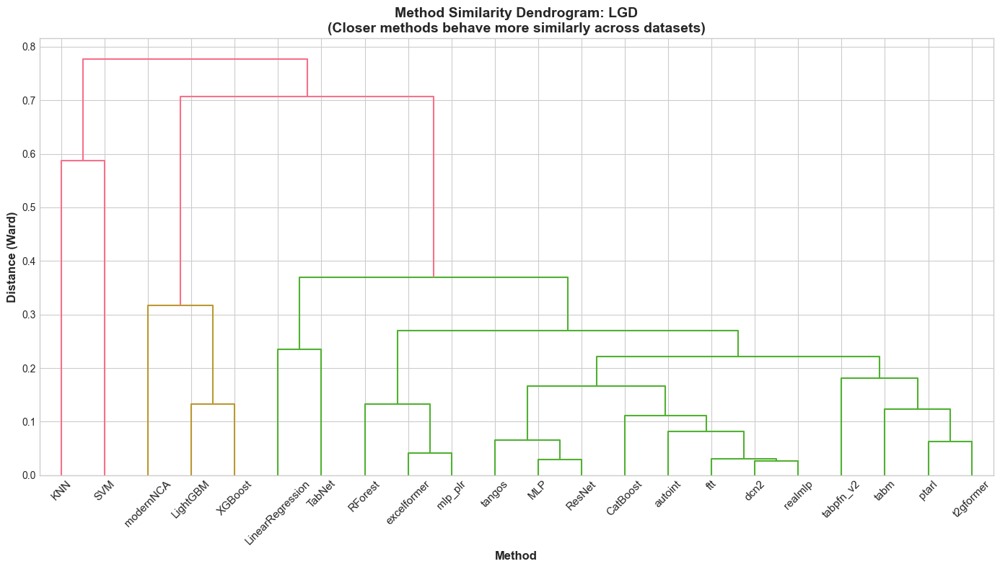

WINNER DISTRIBUTION
📊 Filtered data for task: LGD
📊 Filtered data for tuning strategy: default
   Prepared 680 data points for analysis
   Models: ['LinearRegression', 'RandomForest', 'autoint', 'catboost', 'dcn2', 'excelformer', 'ftt', 'knn', 'lightgbm', 'mlp', 'mlp_plr', 'modernNCA', 'ptarl', 'realmlp', 'resnet', 'svm', 't2gformer', 'tabm', 'tabnet', 'tabpfn_v2', 'tangos', 'xgboost']


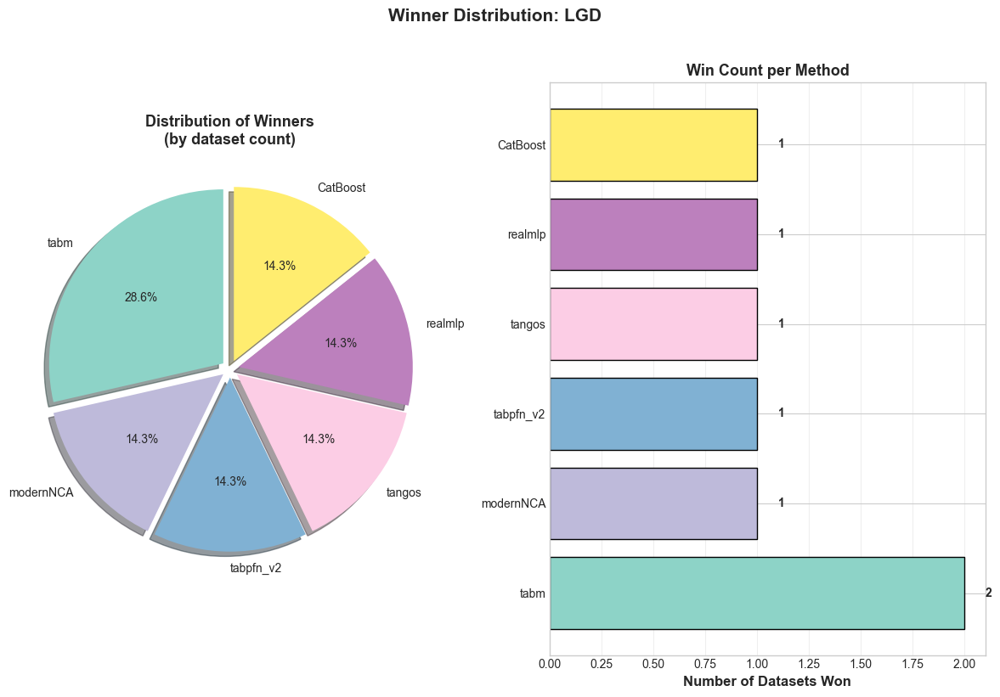


✅ ALL 22 LGD VISUALIZATIONS COMPLETE!


In [23]:
# =============================================================================
# RUN ALL VISUALIZATIONS - LGD TASK
# =============================================================================

if not UNIFIED_DF.empty:
    task = 'lgd'
    tuning = 'default'
    
    print("🎨 " + "=" * 76)
    print("🎨 RUNNING ALL VISUALIZATIONS FOR LGD TASK")
    print("🎨 " + "=" * 76)
    
    # Run all the same visualizations for LGD
    plot_performance_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_rank_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_performance_violins(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_performance_profiles(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_radar_chart(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=6,
                     metrics=['R2', 'RMSE', 'MAE', 'Spearman_Corr'])
    plot_win_tie_loss_matrix(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_gap_to_best(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_method_correlation(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_time_heatmap(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_pareto_frontier(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_rank_distribution(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_bump_chart(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=8)
    plot_method_family_comparison(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_hpo_benefit_heatmap(UNIFIED_DF, task_filter=task)
    plot_multi_metric_scatter(UNIFIED_DF, task_filter=task, tuning_strategy=tuning,
                              metrics=['R2', 'RMSE', 'MAE', 'Spearman_Corr'])
    plot_performance_stability(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_fold_variance(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_topk_frequency(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, max_k=5)
    plot_dataset_difficulty(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_cumulative_wins(UNIFIED_DF, task_filter=task, tuning_strategy=tuning, top_n=6)
    plot_method_dendrogram(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    plot_winner_distribution(UNIFIED_DF, task_filter=task, tuning_strategy=tuning)
    
    print("\n✅ ALL 22 LGD VISUALIZATIONS COMPLETE!")

## 12. Quick Summary

In [24]:
# =============================================================================
# ANALYSIS SUMMARY
# =============================================================================

print("=" * 80)
print(" TabPFNCredit Analysis Notebook Summary")
print("=" * 80)

print("""
📊 AVAILABLE FUNCTIONS:

1. compute_pama_analysis(df, task_filter, tuning_strategy, aggregation_level)
   → Probability of Achieving Maximal Accuracy
   → Shows which algorithms most often achieve best performance

2. calculate_average_ranks(df, task_filter, tuning_strategy, ranking_level)
   → Average ranking across datasets/splits
   → Lower rank = better overall performance

3. statistical_significance_analysis(df, task_filter, tuning_strategy, alpha)
   → Wilcoxon-Holm test with CD diagram
   → Connected algorithms are NOT significantly different

4. compute_baseline_improvement(df, task_filter, baseline_algorithm)
   → Percentage improvement over baseline (e.g., LogReg)
   → Boxplot visualization

5. analyze_tuning_impact(df, task_filter)
   → Compare Default vs HPO performance
   → Overlapping bar chart

6. compare_algorithms_scatter(df, algorithm1, algorithm2, task_filter)
   → Head-to-head scatter plot
   → Points above diagonal: algorithm2 wins

📋 COMMON PARAMETERS:
   - task_filter: 'pd', 'lgd', or None (both)
   - tuning_strategy: 'default', 'optuna', or None (both)
   - aggregation_level/ranking_level: 'dataset' or 'split'

💡 TIPS:
   - Use 'split' level for more statistical power (5x more comparisons)
   - Use 'dataset' level for traditional analysis (more conservative)
   - Check task='pd' and task='lgd' separately before joint analysis
""")

if not UNIFIED_DF.empty:
    print("\n✅ Data loaded successfully!")
    print(f"   {len(UNIFIED_DF)} total rows")
    print(f"   {UNIFIED_DF['model'].nunique()} algorithms")
    print(f"   {UNIFIED_DF['dataset'].nunique()} datasets")
else:
    print("\n⚠️ No data loaded. Run Summarize_Results.py first.")

 TabPFNCredit Analysis Notebook Summary

📊 AVAILABLE FUNCTIONS:

1. compute_pama_analysis(df, task_filter, tuning_strategy, aggregation_level)
   → Probability of Achieving Maximal Accuracy
   → Shows which algorithms most often achieve best performance

2. calculate_average_ranks(df, task_filter, tuning_strategy, ranking_level)
   → Average ranking across datasets/splits
   → Lower rank = better overall performance

3. statistical_significance_analysis(df, task_filter, tuning_strategy, alpha)
   → Wilcoxon-Holm test with CD diagram
   → Connected algorithms are NOT significantly different

4. compute_baseline_improvement(df, task_filter, baseline_algorithm)
   → Percentage improvement over baseline (e.g., LogReg)
   → Boxplot visualization

5. analyze_tuning_impact(df, task_filter)
   → Compare Default vs HPO performance
   → Overlapping bar chart

6. compare_algorithms_scatter(df, algorithm1, algorithm2, task_filter)
   → Head-to-head scatter plot
   → Points above diagonal: algorith